In [1]:
import nub_figures as nf
import numpy as np
import matplotlib.pyplot as plt
import nub_utils as utils
from importlib import reload
import pdb
import numpy as np
import pyute as ut
import scipy.stats as sst
%matplotlib notebook

/Users/dan/Documents/code/downloads/OASIS/oasis/functions.py:14: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  "just not the slower interior point methods we compared to in the papers.")


In [2]:
dsbase = '/Users/dan/Documents/notebooks/mossing-PC/shared_data/'#
dsnames = [dsbase+x for x in ['evan_nub_data_struct_l4.hdf5','evan_nub_data_struct_l23.hdf5','nub_l4_data_struct.hdf5','nub_l23_data_struct.hdf5']]
lbls = ['s1_l4','s1_l23','v1_l4','v1_l23']
train_test_modes = ['halves','thirds','quarters']

In [447]:
for dsname in dsnames:
    with ut.hdf5read(dsname) as ds:
        exptnames = list(ds.keys())
        print(exptnames[0])
        for field in ds[exptnames[0]]:
            print(field)
        print('')
        for field in ds[exptnames[0]]['nub_0']:
            print(field)
        print(ds[exptnames[0]]['nub_0']['F'].shape)
        print('')
#         for exptname in ds:
#             print(exptname)

session_evan_7734_308
cell_center
cell_depth
cell_id
cell_type
lkat
mouse_id
nub_0

F
decon
nafter
nbefore
nondecon
repwise_dFoF
stimulus_id
stimulus_nubs_active
stimulus_parameters
trialrun
(320, 662, 55)

session_evan_6994_210
cell_center
cell_depth
cell_id
cell_type
lkat
mouse_id
nub_0

F
decon
nafter
nbefore
nondecon
repwise_dFoF
stimulus_id
stimulus_nubs_active
stimulus_parameters
trialrun
(997, 684, 26)

session_190827_M10077
cell_center
cell_depth
cell_id
cell_mask
cell_type
mouse_id
nub_0
retinotopy_0

F
decon
nafter
nbefore
neuropil_trialwise
pupil_area_trialwise_pct_eye_area
pupil_area_trialwise_pix
pupil_ctr_trialwise_pct_eye_diam
pupil_ctr_trialwise_pix
raw_trialwise
rf_ctr
rf_displacement_deg
rf_distance_deg
rf_mapping_pval
running_speed_cm_s
stim_offset_deg
stimulus_direction_deg
stimulus_id
stimulus_nubs_active
stimulus_parameters
stimulus_size
t_offset
(1720, 2560, 24)

session_191108_M0403
cell_center
cell_depth
cell_id
cell_mask
cell_type
mean_green_channel
mean_green

# README

Fluorescence and deconvolved traces of calcium imaging videos, aligned to start and ends of stimulus trials, along with information describing the stimuli delivered, behavioral data recorded, and the physical locations and masks of the cells recorded

## Data organization

Files: individual cortical areas/layers (S1 L4, S1 L2/3, V1 L4, V1 L2/3
Level 0 (top level): individual imaging sessions
Level 1: ROI information and experiment names (e.g. retinotopic mapping if applicable, main experiment)
Level 2: experiment information
Note: axis labels for all multidimensional datasets are given in "C" order, as used e.g. by default in Python.

## Level 0: imaging sessions

Titles are given as PREFIX_DATE_MOUSE-ID, where DATE is in YYMMDD format, and MOUSE-ID is a unique identifier for each mouse recorded.

## Level 1: ROI information and experiment names

"cell_center" is an array with shape (ROI x 2) giving the location in pixels of the ROI center.

"cell_depth" is an array with shape (ROI) giving the index of the imaging plane in which the ROI was recorded.

"cell_id" is an array with shape (ROI) giving a unique integer ROI index.

"cell_type" is a string of the cell type of this recording.

"mouse_id" is a string of the unique ID of the mouse in this recording.

"retinotopy_0" contains the receptive field mapping experiment information (V1 only).

"nub_0" contains the multi-piston/multi-patch experiment information.

## Level 2: experiment information

"F" is an array with shape (ROI x trial x frame) of neuropil-subtracted dF/F, where the final axis contains nbefore (see below) frames before stimulus onset, to nafter frames after stimulus offset. Thus `np.nanmean(F[:,:,nbefore:-nafter],axis=2)` yields the time-averaged dF/F during the period in which the stimulus was delivered.

"decon" is an array with shape (ROI x trial x frame), analogous to F, but for event rate deconvolved using OASIS from F.

"nafter" is a scalar giving the number of frames in F, decon, and pupil measurement datasets after stimulus offset.

"nbefore" is a scalar giving the number of frames in F and decon, and pupil measurement datasets before stimulus onset.

"t_offset" is an array with shape (ROI x trial) giving the timepoint at which the ROI was measured (corresponding to `F[iroi,:,nbefore]`), in fractions of 1 frame, relative to the onset of stimulus delivery (in the interval $[0,1)$ ). If the ROI was measured immediately before stimulus onset, this number is nearly 1 (`F[iroi,:,nbefore]` corresponds to nearly 1 frame after stimulus onset); if the ROI was measured immediately after stimulus onset, this number is nearly 0 (`F[iroi,:,nbefore]` corresponds to nearly the exact time of stimulus onset).

"pupil_area_trialwise_pct_eye_area" is an array with shape (trial x frame) giving the area of the eye pupil as a fraction of the visible eye area (V1 only).

"pupil_area_trialwise_pix" is an array with shape (trial x frame) giving the area of the eye pupil in pixels (V1 only).

"pupil_ctr_trialwise_pct_eye_diam" is an array with shape (trial x frame x 2) giving the (x,y) location of the eye pupil center in units of percent of the eye diameter along the x-axis (V1 only).

"pupil_ctr_trialwise_pix" is an array with shape (trial x frame x 2) giving the (x,y) location of the eye pupil center in pixels (V1 only).

"rf_ctr" is an array with shape (ROI x 2) giving the (azimuth, elevation) location of each neuron's receptive field center in visual degrees, relative to the center of the computer monitor (V1 only).

"stim_offset_deg" is an array with shape (2) giving the (azimuth, elevation) location of the visual stimulus center in visual degrees, relative to the center of the computer monitor (V1 only).

"rf_displacement_deg" is an array with shape (ROI x 2) giving the (azimuth, elevation) location of each neuron's receptive field center in visual degrees, relative to the center of the visual stimulus (V1 only).

"rf_distance_deg" is an array with shape (ROI) giving the distance of each neuron's receptive field center, in visual degrees, to the center of the visual stimulus (V1 only).

"rf_mapping_pval" is an array with shape (ROI) giving the p-value (using Wilcoxon signed rank test) for the deconvolved event rate immediately before and immediately after the retinotopic mapping stimulus is displayed, being drawn from different distributions (V1 only).

"running_speed_cm_s" is an array with shape (trial x frame) giving the animal's run speed in cm/sec.

"stimulus_parameters" is a list of stimulus parameters varied in the experiment in question.

"stimulus_size" is an array with giving the unique patch diameters shown, in visual degrees (V1 only).

"stimulus_direction_deg" is an array giving the unique directions of drifting gratings shown in degrees (V1 only).

"stimulus_nubs_active" is an array with shape (32 x 5), giving the unique sets of pistons/patches active (i.e. at 100 percent contrast).

"stimulus_id" is an array with shape (trial x 3 in V1, trial in S1) giving categorical representation of stimulus parameters (patches active, size, direction) in V1, or (pistons active) in S1. If `stimulus_id[itrial] == [i,j,k]` (for a V1 experiment), then the stimulus in trial `itrial` has active patches `stimulus_nubs_active[i]`, each with stimulus size `stimulus_size[j]`, and direction `stimulus_direction_deg[k]`

In [463]:
doc_string = '''
"F" is an array with shape (ROI x trial x frame) of neuropil-subtracted dF/F, where the final axis contains nbefore (see below) frames before stimulus onset, to nafter frames after stimulus offset. Thus $np.nanmean(F[:,:,nbefore:-nafter],axis=2)$ yields the time-averaged dF/F during the period in which the stimulus was delivered.

"decon" is an array with shape (ROI x trial x frame), analogous to F, but for event rate deconvolved using OASIS from F.

"nafter" is a scalar giving the number of frames in F, decon, and pupil measurement datasets after stimulus offset.

"nbefore" is a scalar giving the number of frames in F and decon, and pupil measurement datasets before stimulus onset.

"t_offset" is an array with shape (ROI x trial) giving the timepoint at which the ROI was measured (corresponding to $F[iroi,:,nbefore]$), in fractions of 1 frame, relative to the onset of stimulus delivery (in the interval $[0,1)$ ). If the ROI was measured immediately before stimulus onset, this number is nearly 1 ($F[iroi,:,nbefore]$ corresponds to nearly 1 frame after stimulus onset); if the ROI was measured immediately after stimulus onset, this number is nearly 0 ($F[iroi,:,nbefore]$ corresponds to nearly the exact time of stimulus onset).

"pupil_area_trialwise_pct_eye_area" is an array with shape (trial x frame) giving the area of the eye pupil as a fraction of the visible eye area (V1 only).

"pupil_area_trialwise_pix" is an array with shape (trial x frame) giving the area of the eye pupil in pixels (V1 only).

"pupil_ctr_trialwise_pct_eye_diam" is an array with shape (trial x frame x 2) giving the (x,y) location of the eye pupil center in units of percent of the eye diameter along the x-axis (V1 only).

"pupil_ctr_trialwise_pix" is an array with shape (trial x frame x 2) giving the (x,y) location of the eye pupil center in pixels (V1 only).

"rf_ctr" is an array with shape (ROI x 2) giving the (azimuth, elevation) location of each neuron's receptive field center in visual degrees, relative to the center of the computer monitor (V1 only).

"stim_offset_deg" is an array with shape (2) giving the (azimuth, elevation) location of the visual stimulus center in visual degrees, relative to the center of the computer monitor (V1 only).

"rf_displacement_deg" is an array with shape (ROI x 2) giving the (azimuth, elevation) location of each neuron's receptive field center in visual degrees, relative to the center of the visual stimulus (V1 only).

"rf_distance_deg" is an array with shape (ROI) giving the distance of each neuron's receptive field center, in visual degrees, to the center of the visual stimulus (V1 only).

"rf_mapping_pval" is an array with shape (ROI) giving the p-value (using Wilcoxon signed rank test) for the deconvolved event rate immediately before and immediately after the retinotopic mapping stimulus is displayed, being drawn from different distributions (V1 only).

"running_speed_cm_s" is an array with shape (trial x frame) giving the animal's run speed in cm/sec.

"stimulus_parameters" is a list of stimulus parameters varied in the experiment in question.

"stimulus_size" is an array with giving the unique patch diameters shown, in visual degrees (V1 only).

"stimulus_direction_deg" is an array giving the unique directions of drifting gratings shown in degrees (V1 only).

"stimulus_nubs_active" is an array with shape (32 x 5), giving the unique sets of pistons/patches active (i.e. at 100 percent contrast).

"stimulus_id" is an array with shape (trial x 3 in V1, trial in S1) giving categorical representation of stimulus parameters (patches active, size, direction) in V1, or (pistons active) in S1. If $stimulus_id[itrial] == [i,j,k]$ (for a V1 experiment), then the stimulus in trial $itrial$ has active patches $stimulus_nubs_active[i]$, each with stimulus size $stimulus_size[j]$, and direction $stimulus_direction_deg[k]$
'''

In [464]:
doc_string.split('"')[1::2]

['F',
 'decon',
 'nafter',
 'nbefore',
 't_offset',
 'pupil_area_trialwise_pct_eye_area',
 'pupil_area_trialwise_pix',
 'pupil_ctr_trialwise_pct_eye_diam',
 'pupil_ctr_trialwise_pix',
 'rf_ctr',
 'stim_offset_deg',
 'rf_displacement_deg',
 'rf_distance_deg',
 'rf_mapping_pval',
 'running_speed_cm_s',
 'stimulus_parameters',
 'stimulus_size',
 'stimulus_direction_deg',
 'stimulus_nubs_active',
 'stimulus_id']

In [450]:
to_copy = '''F
decon
nbefore
nafter
pupil_area_trialwise_pct_eye_area
pupil_area_trialwise_pix
pupil_ctr_trialwise_pct_eye_diam
pupil_ctr_trialwise_pix
raw_trialwise
rf_ctr
rf_displacement_deg
rf_distance_deg
stim_offset_deg
rf_mapping_pval
running_speed_cm_s
stimulus_direction_deg
stimulus_id
stimulus_nubs_active
stimulus_parameters
stimulus_size
t_offset'''
for line in to_copy.split('\n'):
    print(line)

F
decon
nafter
nbefore
neuropil_trialwise
pupil_area_trialwise_pct_eye_area
pupil_area_trialwise_pix
pupil_ctr_trialwise_pct_eye_diam
pupil_ctr_trialwise_pix
raw_trialwise
rf_ctr
rf_displacement_deg
rf_distance_deg
rf_mapping_pval
running_speed_cm_s
stim_offset_deg
stimulus_direction_deg
stimulus_id
stimulus_nubs_active
stimulus_parameters
stimulus_size
t_offset


In [3]:
experienced_expts = ['session_191108_M0403','session_191119_M0293','session_200311_M0403','session_200312_M0293','session_200312_M0807']

In [4]:
non_filled_expts = ['session_evan_6994_210','session_evan_7120_250','session_evan_7142_220']

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>


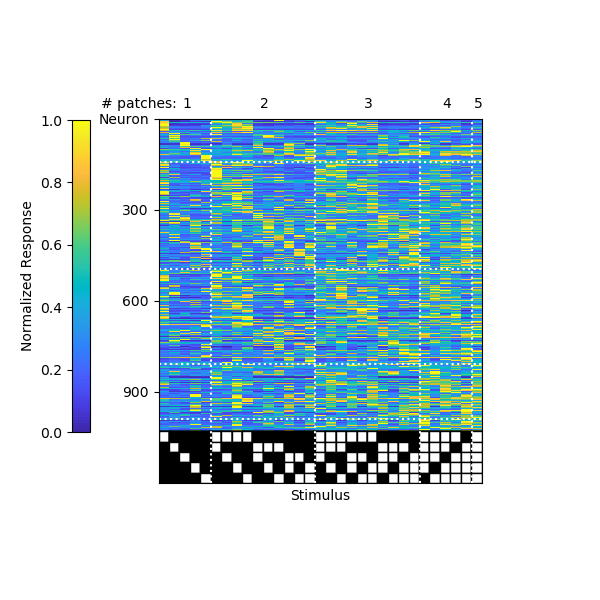

/Users/dan/Documents/code/adesnal/nub_figures.py:478: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:340: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)


<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>


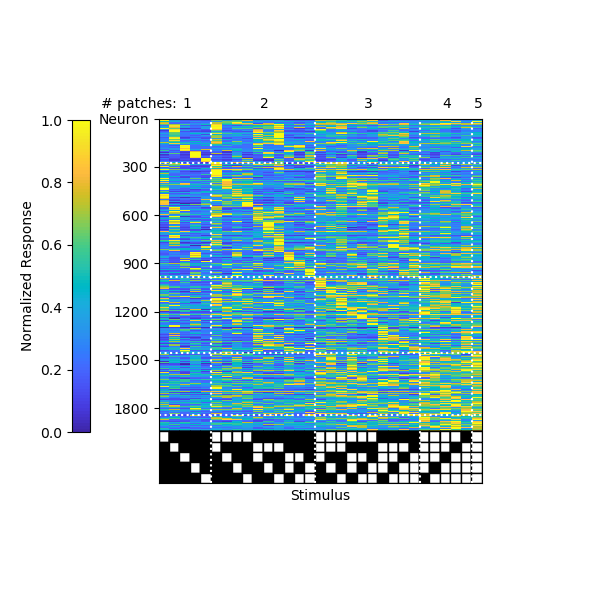

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>


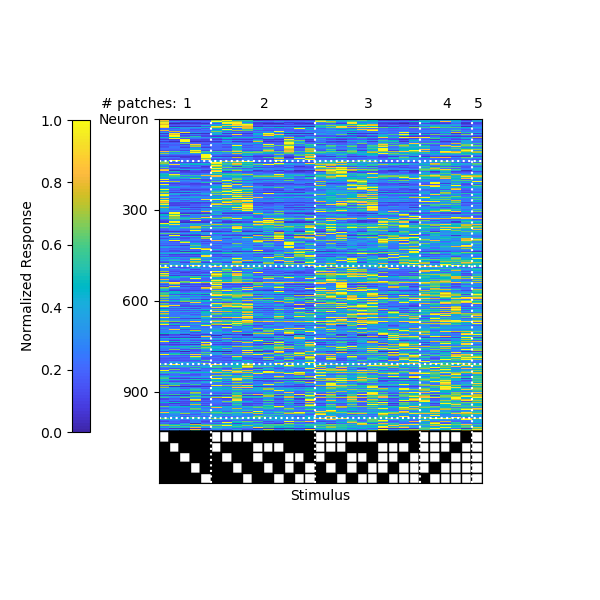

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>


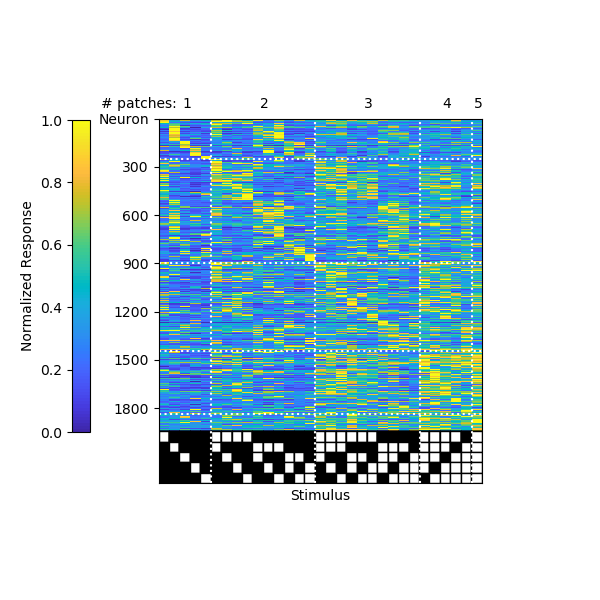

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>


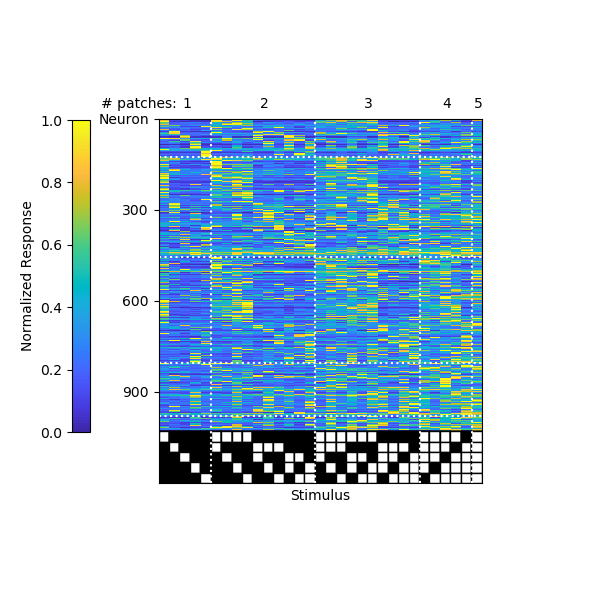

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>


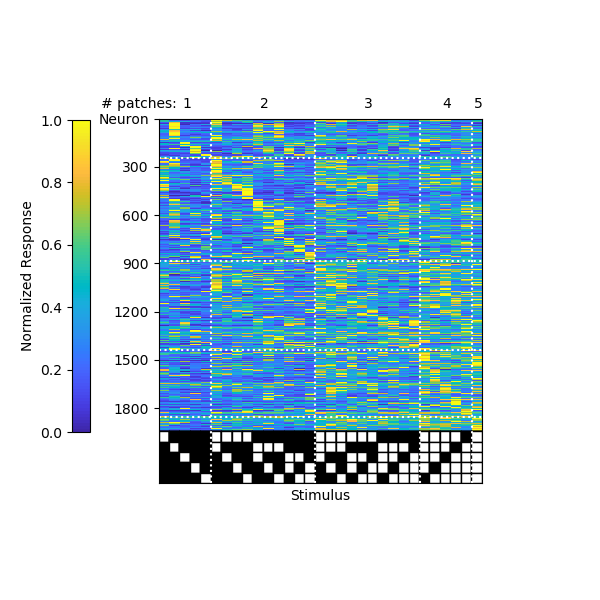

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<IPython.core.display.Javascript object>


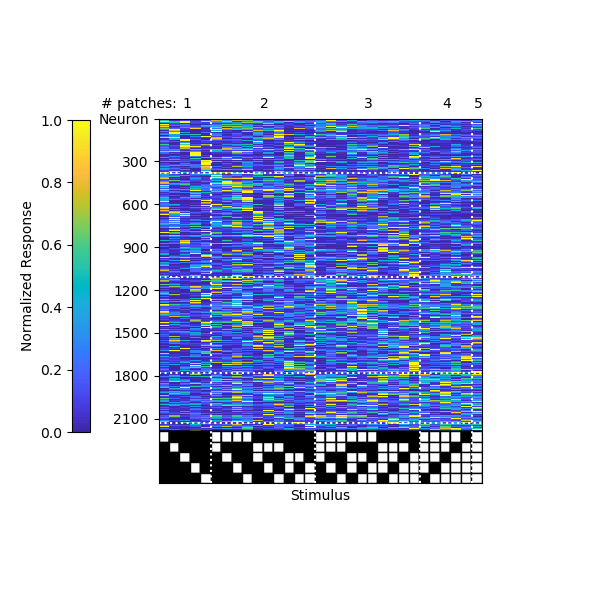

<IPython.core.display.Javascript object>


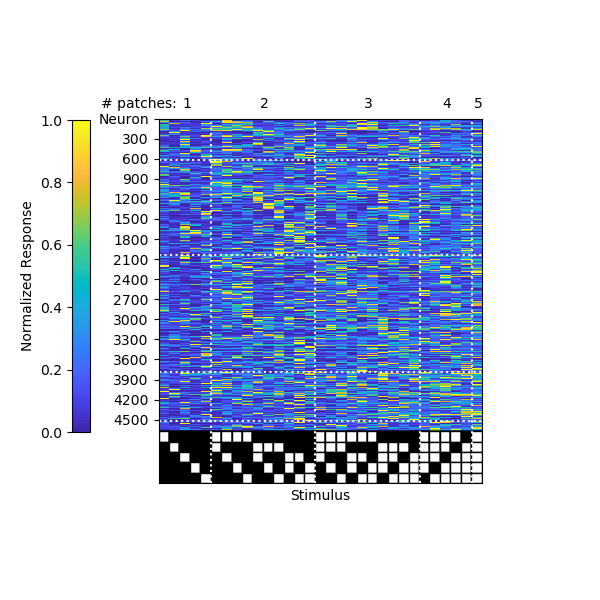

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


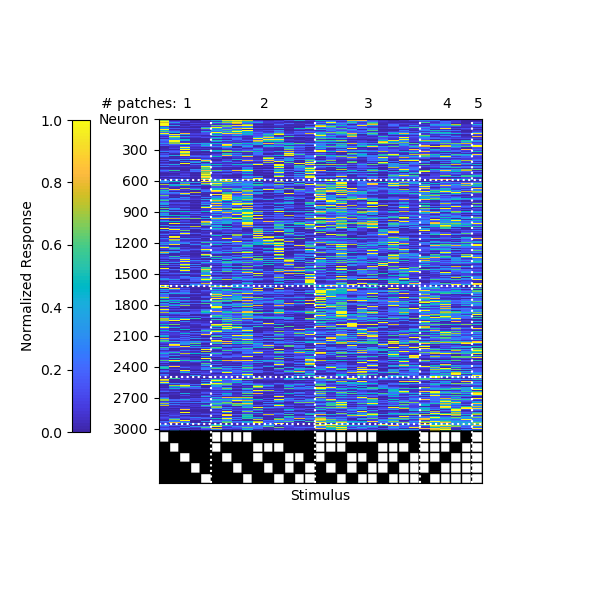

<IPython.core.display.Javascript object>


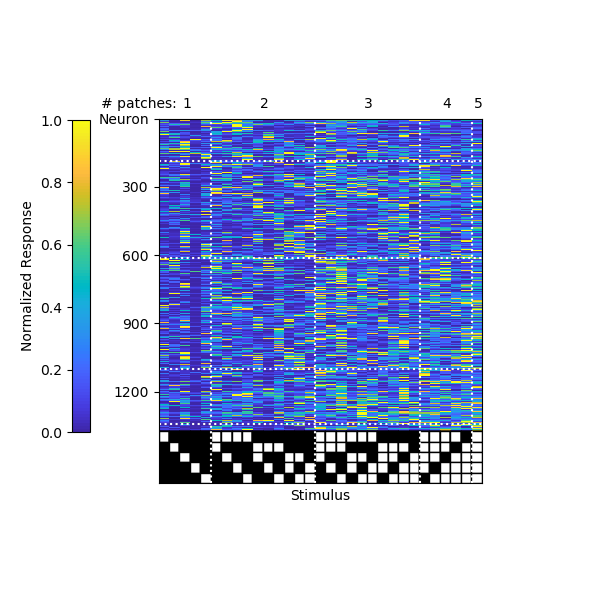

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<IPython.core.display.Javascript object>


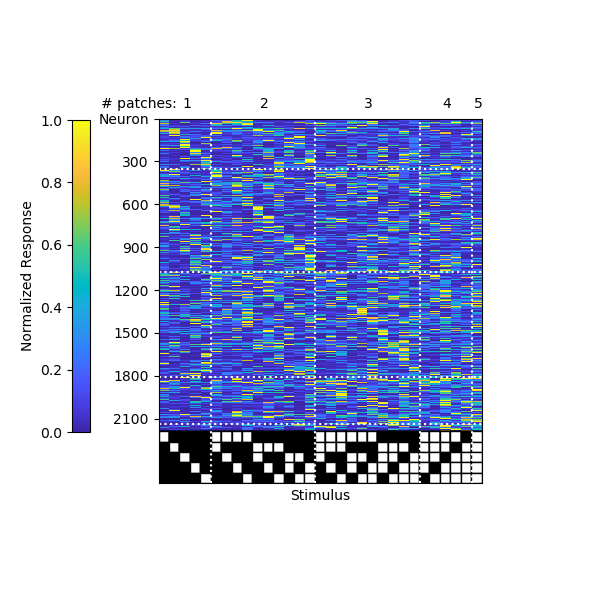

<IPython.core.display.Javascript object>


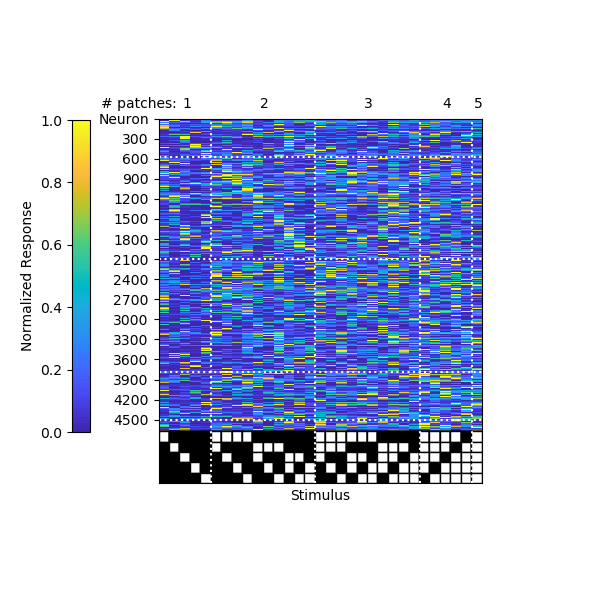

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


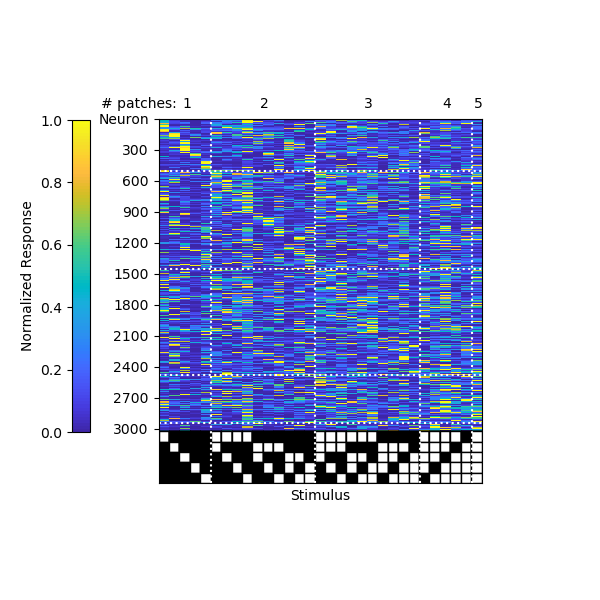

<IPython.core.display.Javascript object>


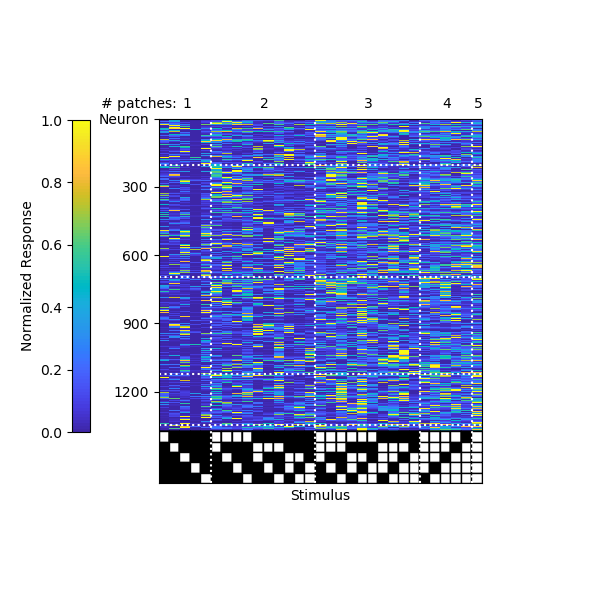

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<IPython.core.display.Javascript object>


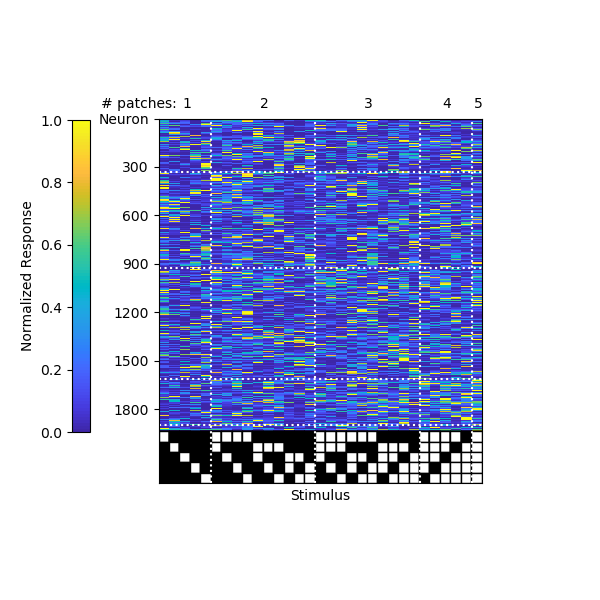

<IPython.core.display.Javascript object>


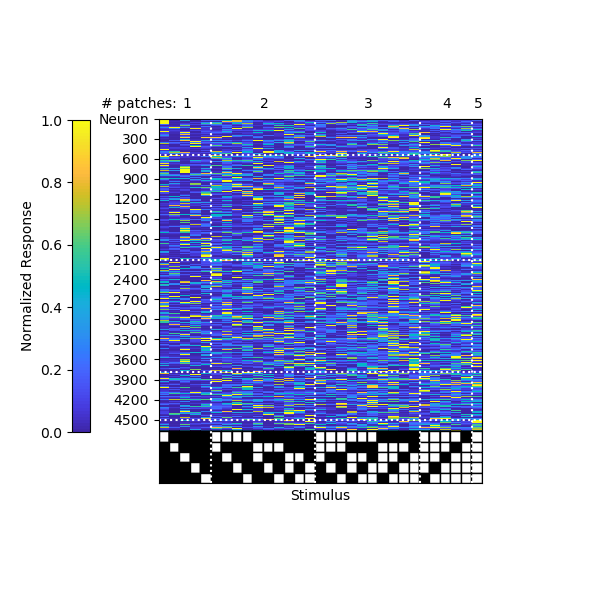

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


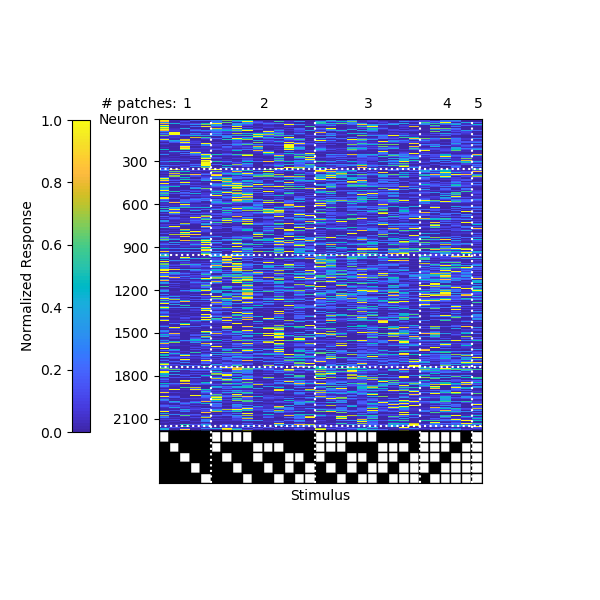

<IPython.core.display.Javascript object>


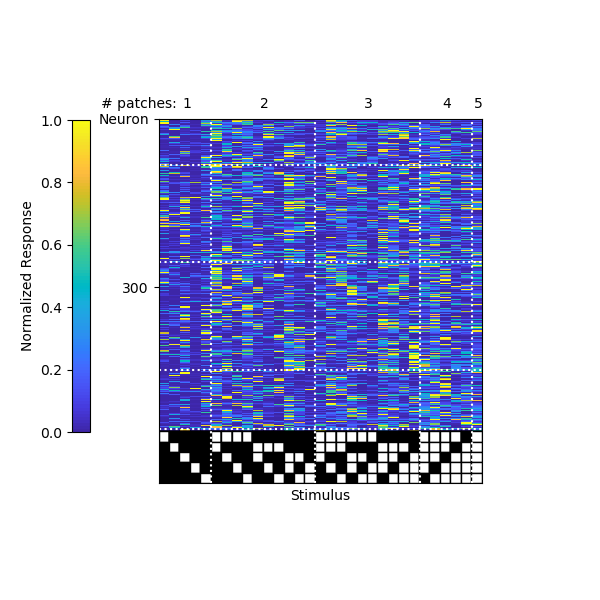

In [38]:
import nub_figures as nf
reload(nf)
reload(utils)
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_split_pupil,utils.gen_nub_selector_v1_split_pupil]#_all_sizes
# gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
run_conditions = [[1],[1],[0,1],[0,1]]
for slc in [slice(None,2),slice(2,None)]:
    for train_test_mode in ['halves','thirds','quarters']:
        for dsname,lbl,sel,keylist,datafield,run_condition in zip(dsnames[slc],lbls[slc],gen_nub_selector[slc],keylists[slc],datafields[slc],run_conditions[slc]):
        # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
            nf.plot_tuning_curves(['figures/nub_experienced_non_moving_tuning_curves_%s_%s.jpg'%(lbl,train_test_mode),'figures/nub_experienced_moving_tuning_curves_%s_%s.jpg'%(lbl,train_test_mode)],\
                                  dsname,keylist,gen_nub_selector=sel,datafield=datafield,run_conditions=run_condition,\
                                  dfof_cutoff=0.,pcutoff=0.05,line=False,train_test_mode=train_test_mode)#0.2)
    

In [49]:
experienced_expts

['session_191108_M0403',
 'session_191119_M0293',
 'session_200311_M0403',
 'session_200312_M0293',
 'session_200312_M0807']

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>


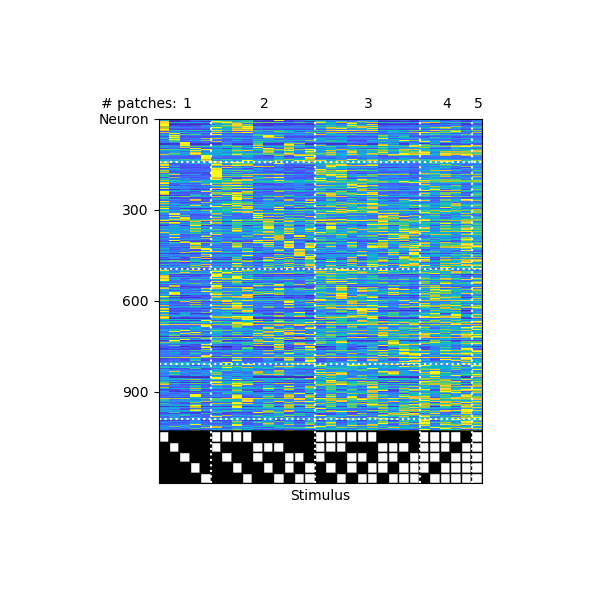

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>


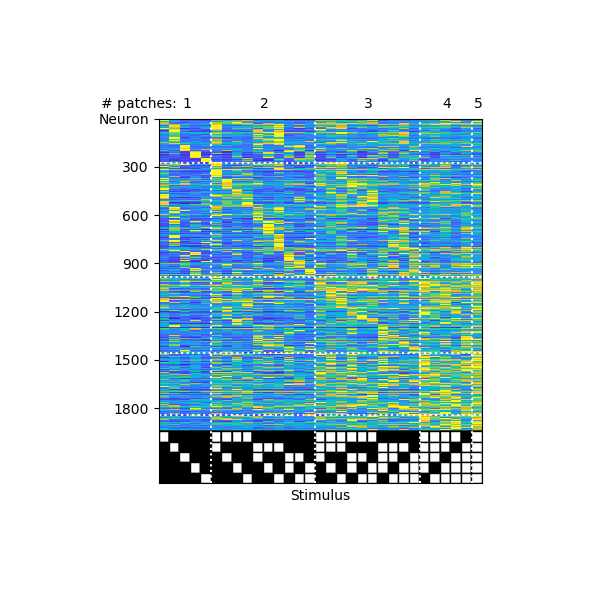

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>


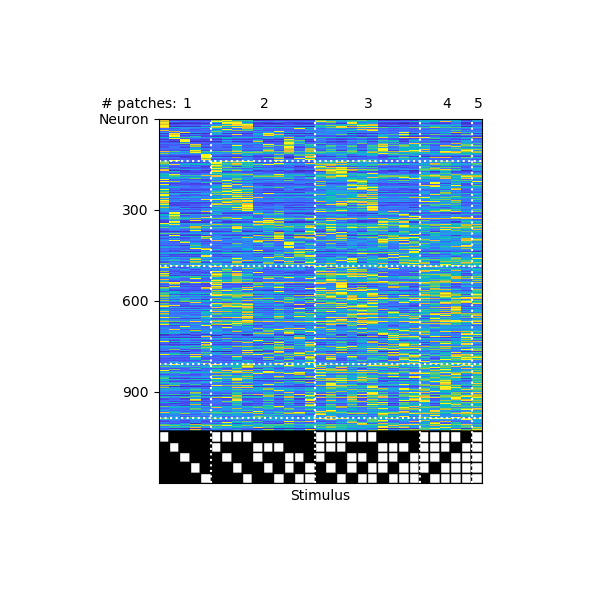

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>


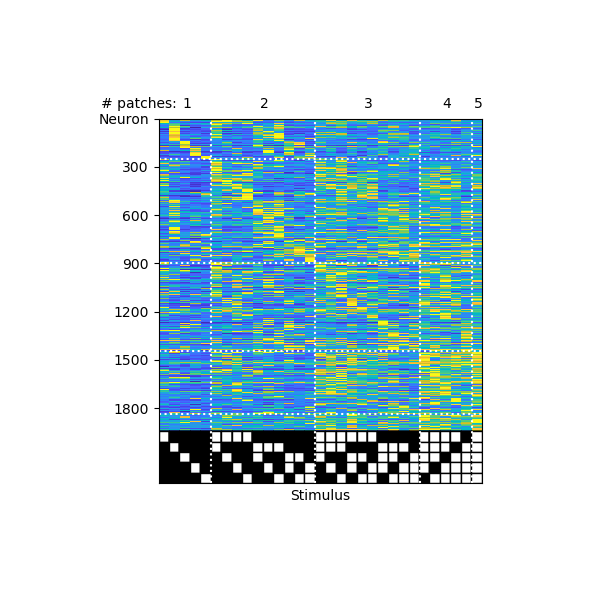

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>


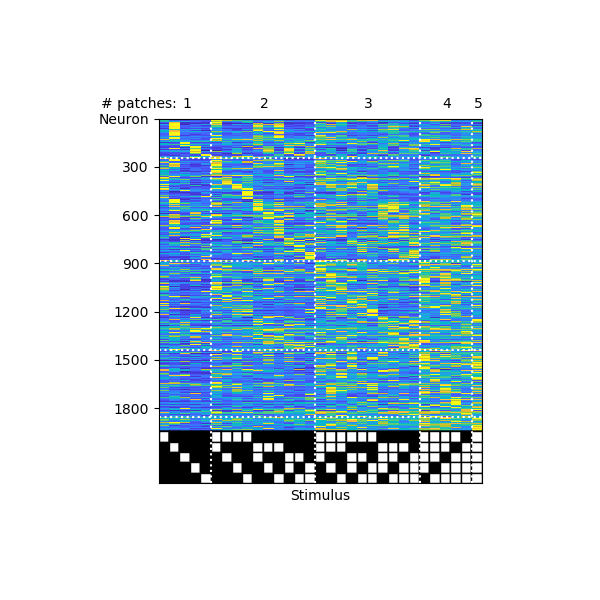

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active', 'dilated', 'centered']
ex

<IPython.core.display.Javascript object>


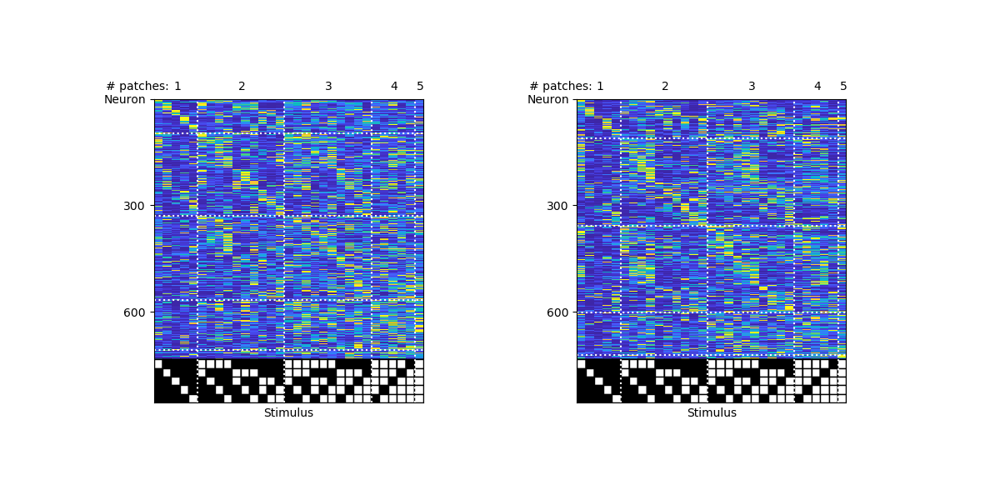

<IPython.core.display.Javascript object>


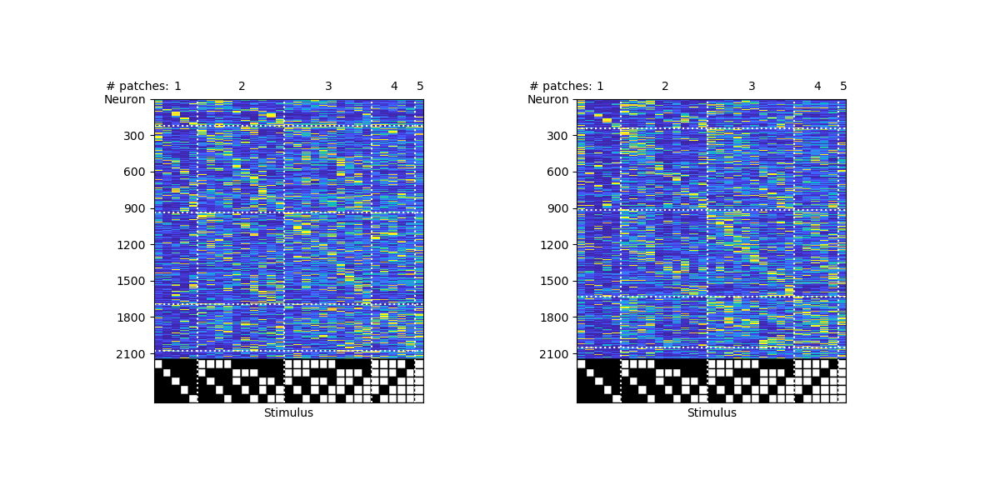

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


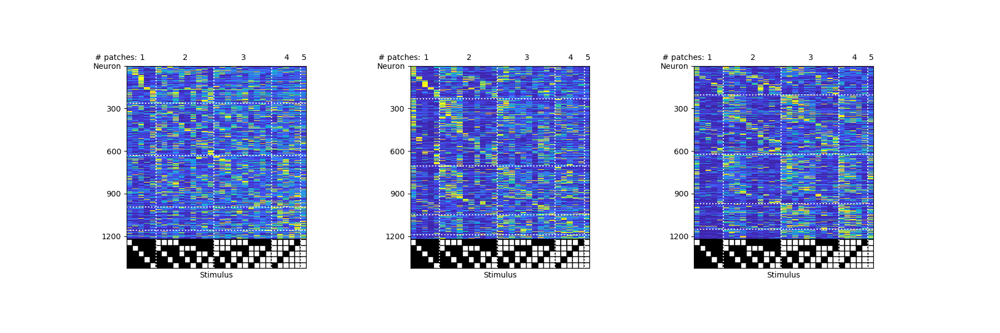

<IPython.core.display.Javascript object>


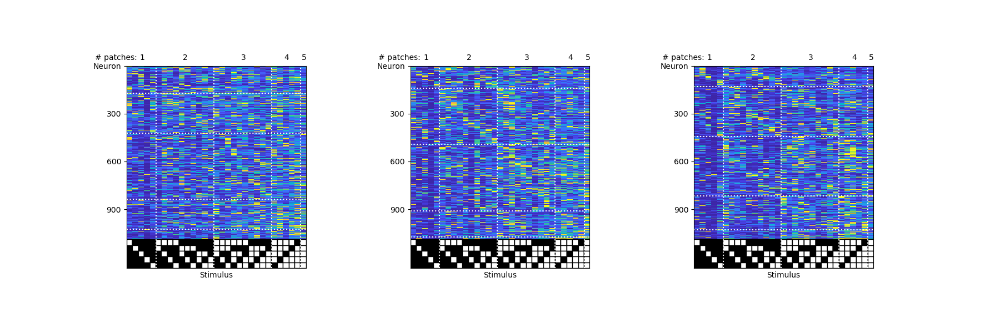

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active', 'dilated', 'centered']
ex

<IPython.core.display.Javascript object>


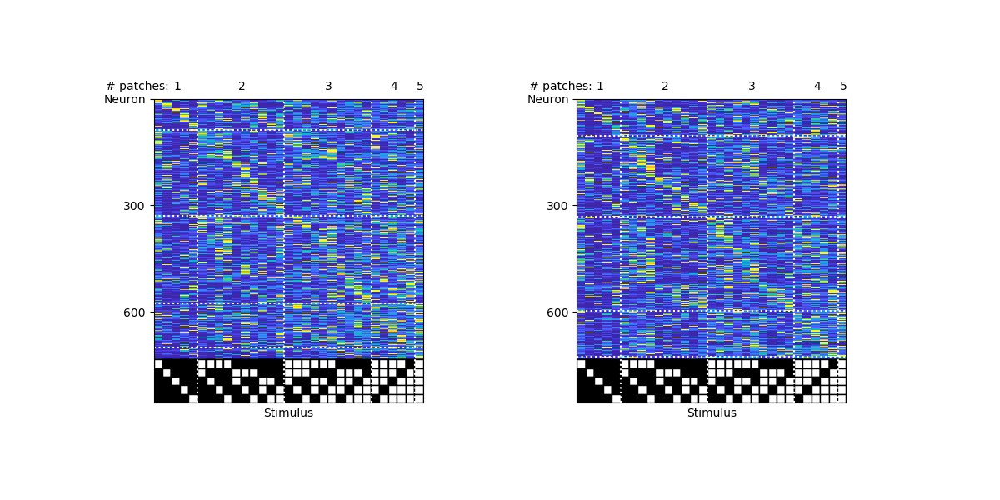

<IPython.core.display.Javascript object>


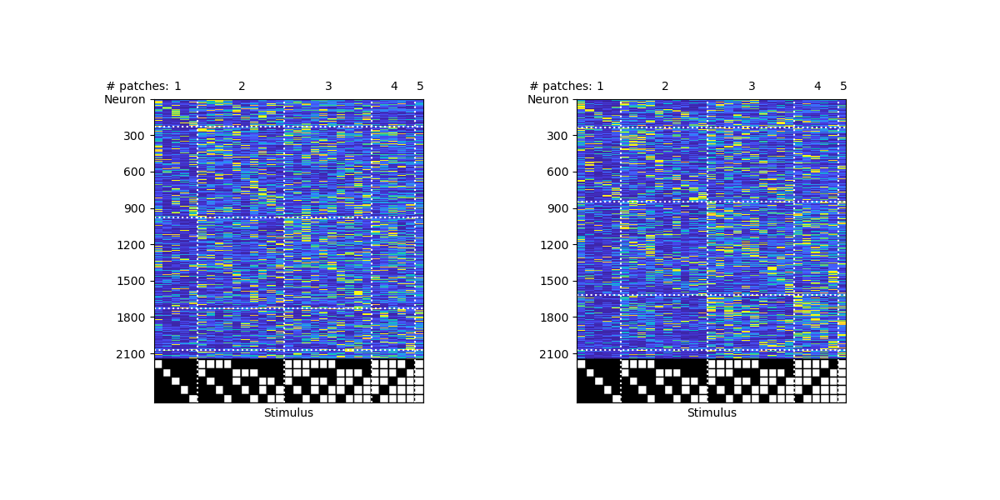

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active', 'dilated', 'centered']
ex

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


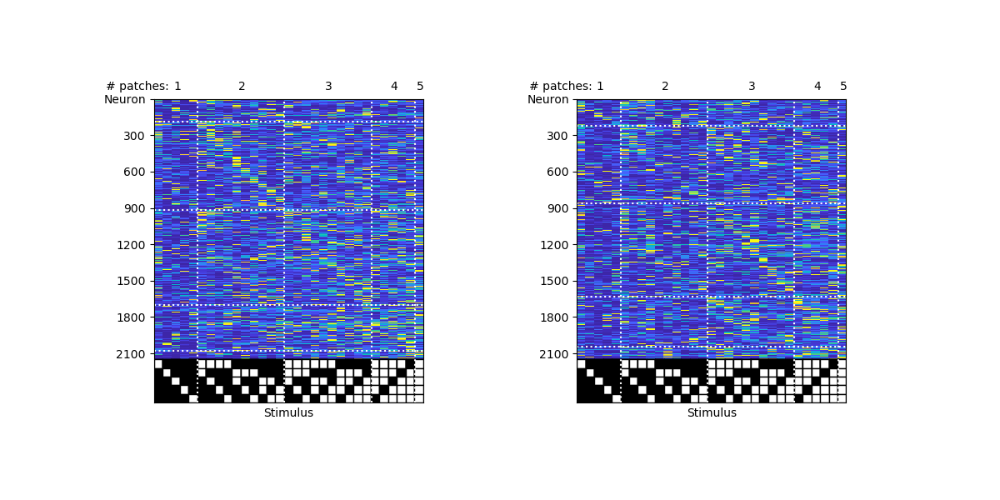

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


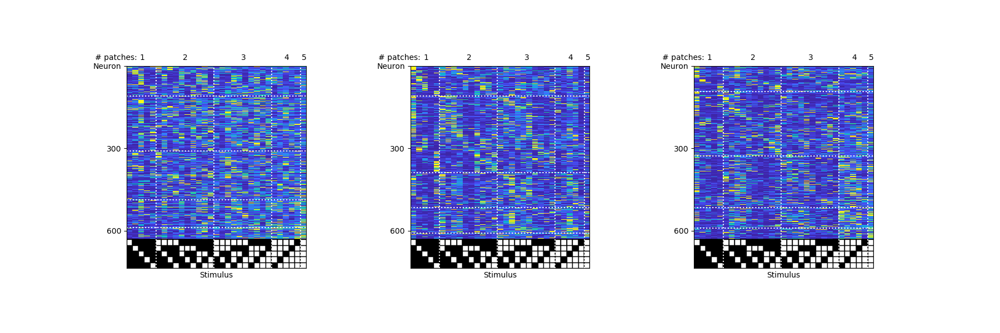

<IPython.core.display.Javascript object>


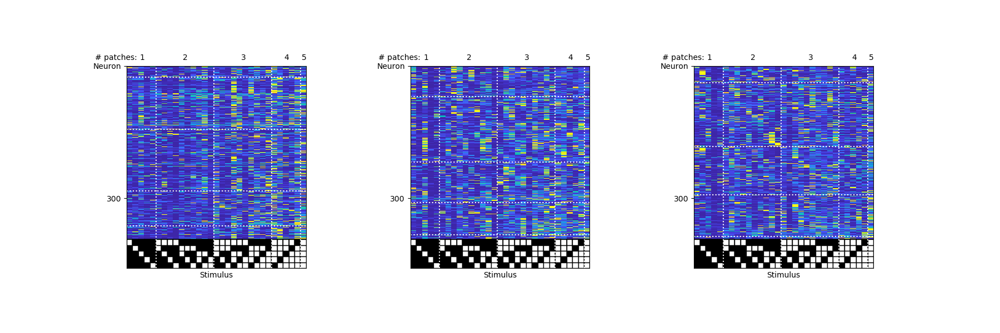

In [37]:
import nub_figures as nf
reload(nf)
reload(utils)
# gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_all_sizes,utils.gen_nub_selector_v1_all_sizes]#_all_sizes
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_all_sizes_split_pupil,utils.gen_nub_selector_v1_all_sizes_split_pupil]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
run_conditions = [[1],[1],[0,1],[0,1]]
for slc in [slice(None,2),slice(2,None)]:
    for train_test_mode in train_test_modes:
        for dsname,lbl,sel,keylist,datafield,run_condition in zip(dsnames[slc],lbls[slc],gen_nub_selector[slc],keylists[slc],datafields[slc],run_conditions[slc]):
        # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
            nf.plot_tuning_curves(['figures/nub_experienced_non_moving_tuning_curves_three_sizes_%s_%s.jpg'%(lbl,train_test_mode),'figures/nub_experienced_moving_tuning_curves_three_sizes_'+lbl+'.jpg'],\
                                  dsname,keylist,gen_nub_selector=sel,datafield=datafield,run_conditions=run_condition,dfof_cutoff=1e-2,\
                                  pcutoff=0.05,colorbar=False,line=False,train_test_mode=train_test_mode)#0.2)


<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>


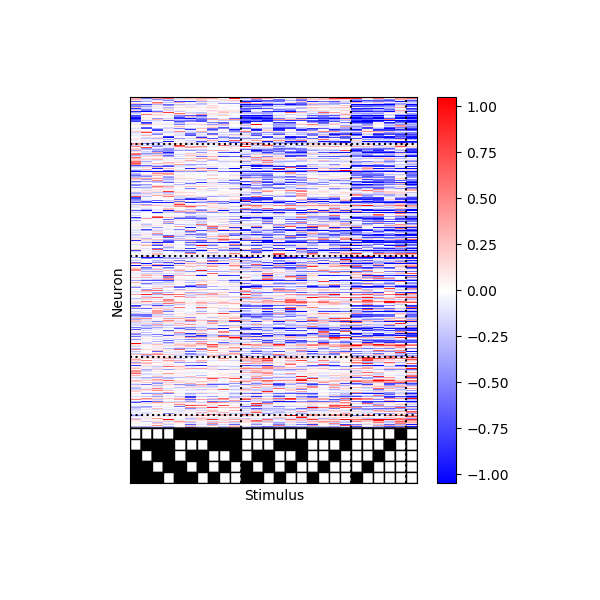

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>


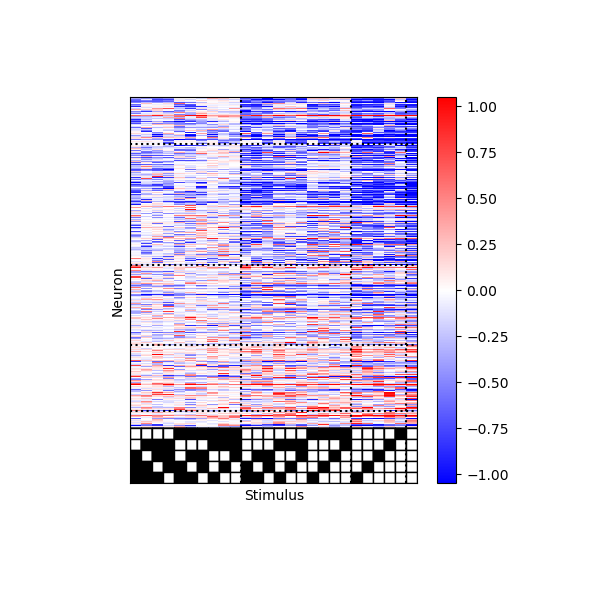

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based on running: 0.97
excluding based on running: 0.

<IPython.core.display.Javascript object>

<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220', 'session_evan_7197_160']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
excluding based on running: 0.86
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27
excluding based on running: 0.14
roracle: 0/997
roracle: 0/536
roracle: 793/795
roracle: 0/1569


<IPython.core.display.Javascript object>

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active', 'dilated', 'centered']
ex

<IPython.core.display.Javascript object>


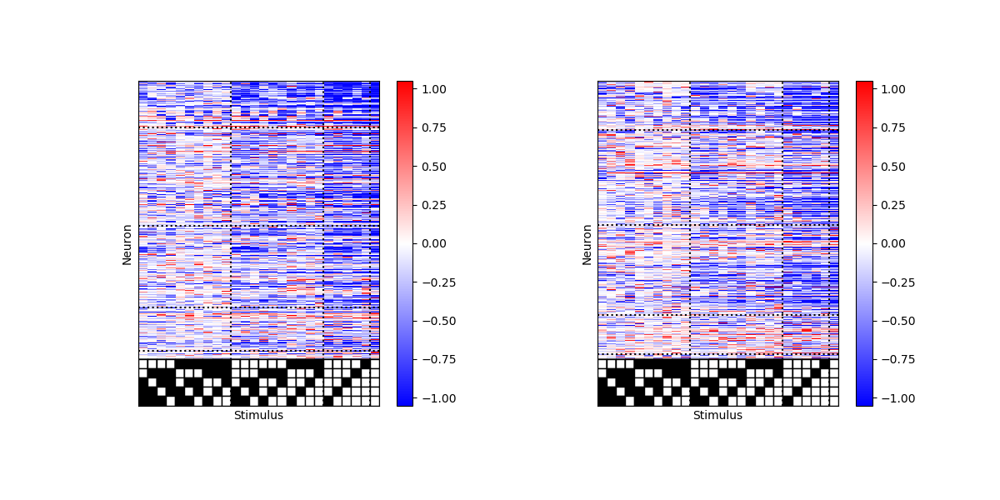

(4671, 2)
(4671, 2, 32)


<IPython.core.display.Javascript object>


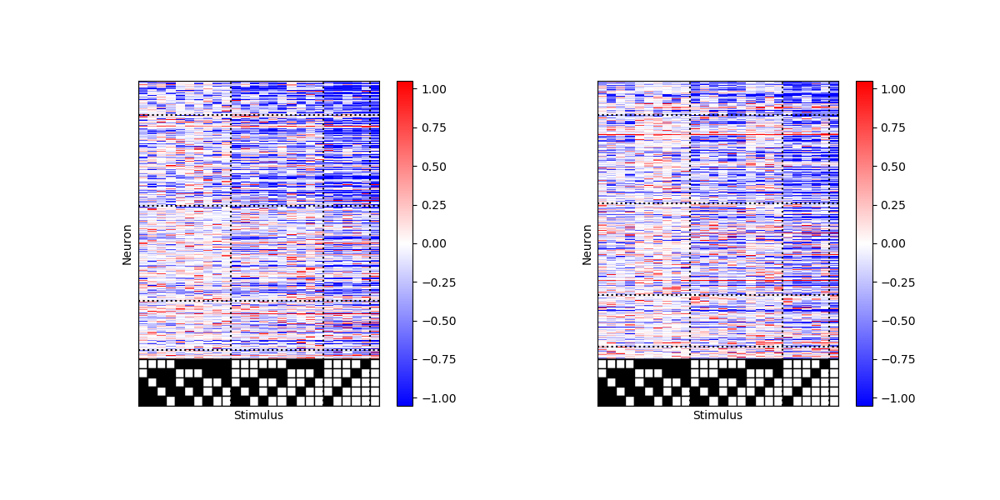

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


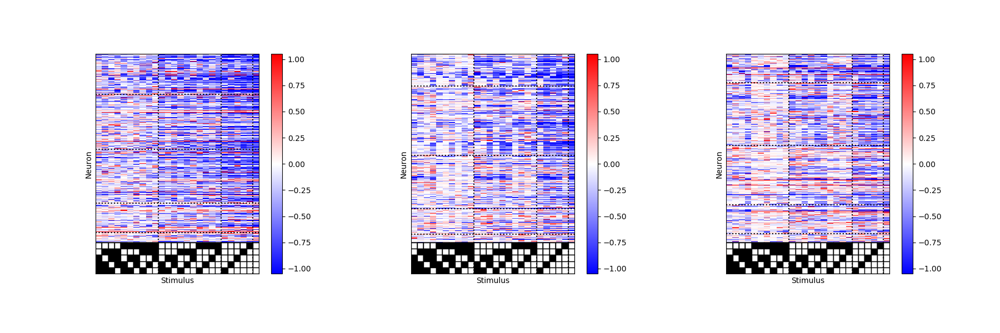

(1373, 3)
(1373, 3, 32)


<IPython.core.display.Javascript object>


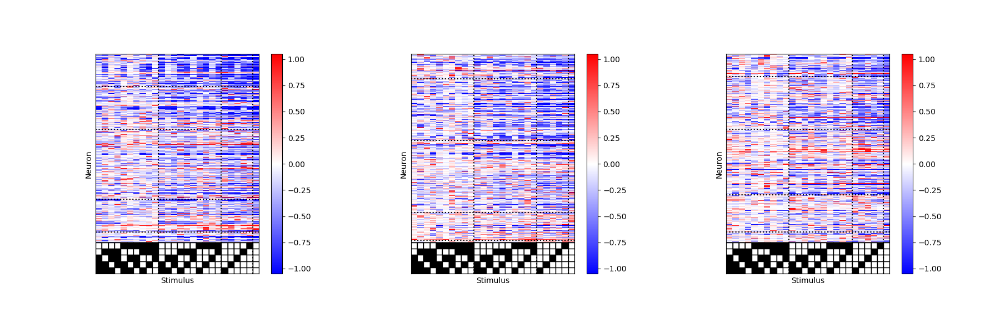

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active', 'dilated', 'centered']
ex

<IPython.core.display.Javascript object>


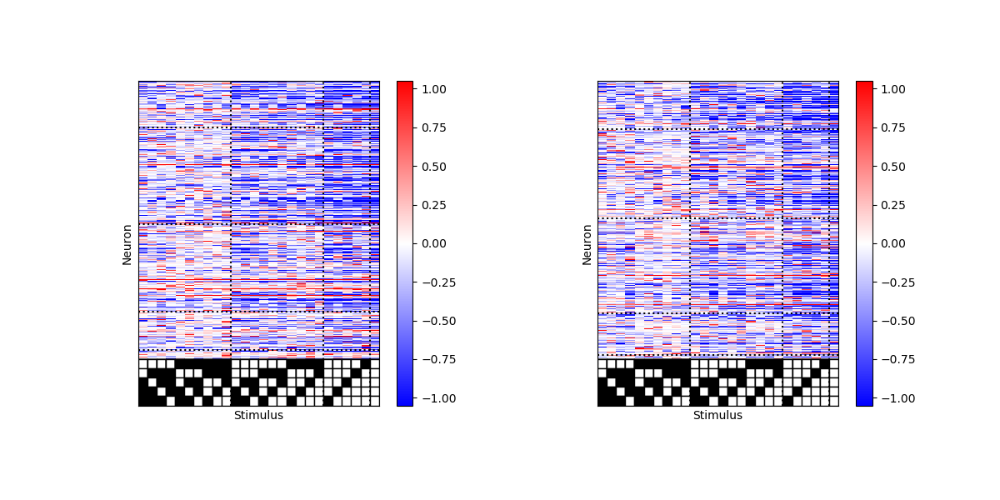

(4671, 2)
(4671, 2, 32)


<IPython.core.display.Javascript object>


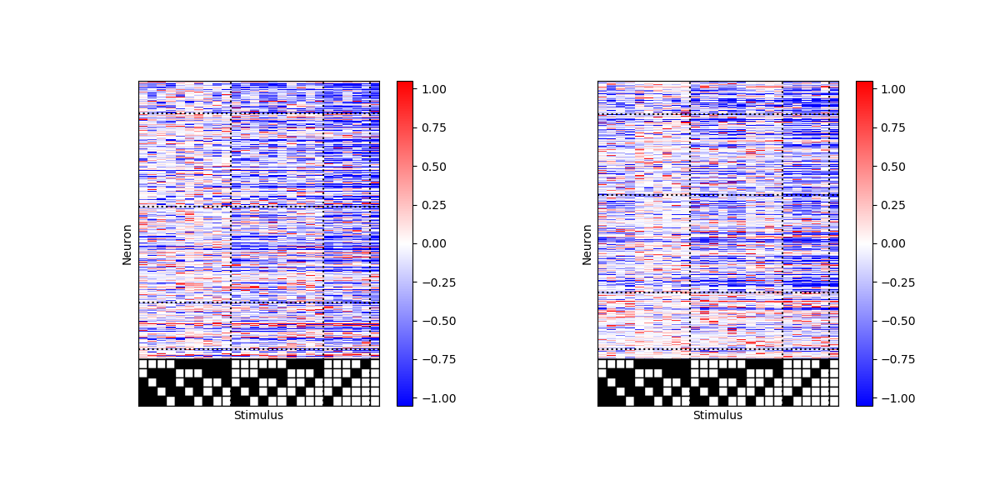

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


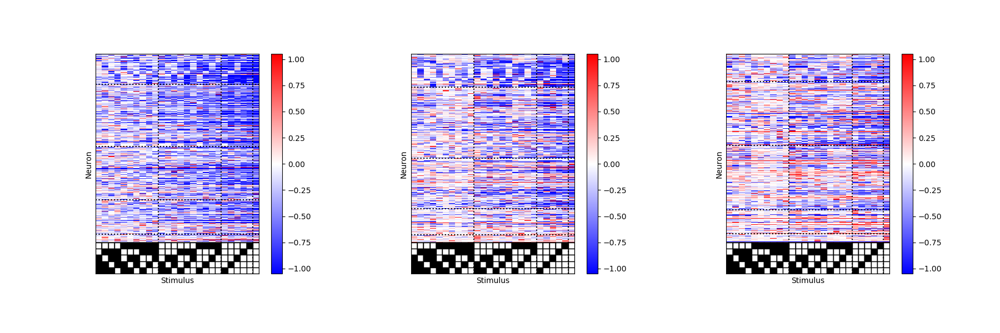

(1373, 3)
(1373, 3, 32)


<IPython.core.display.Javascript object>


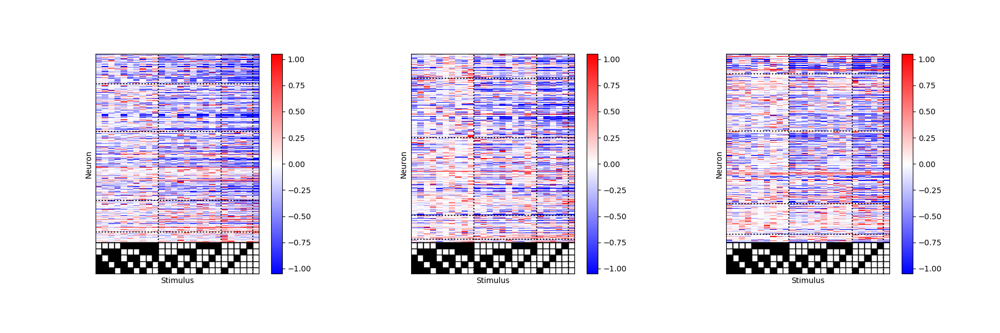

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active', 'dilated', 'centered']
ex

<IPython.core.display.Javascript object>


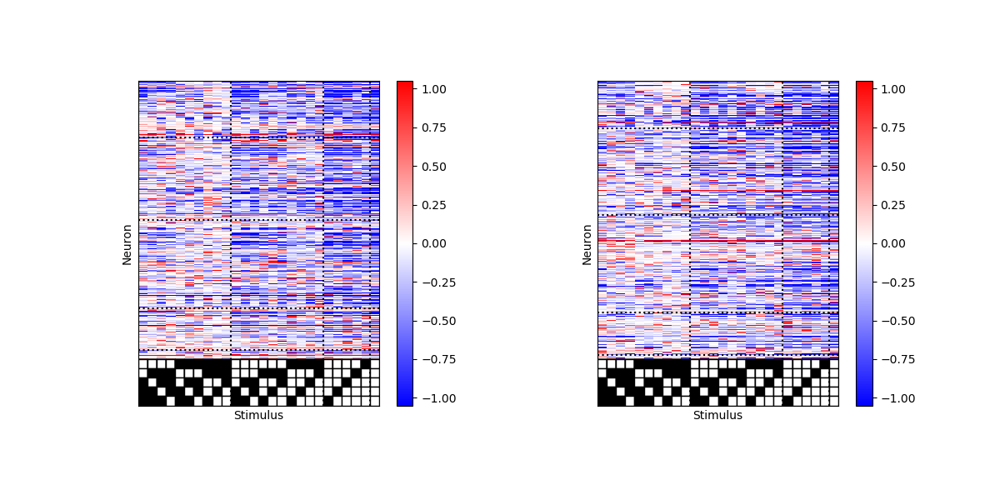

(4671, 2)
(4671, 2, 32)


<IPython.core.display.Javascript object>


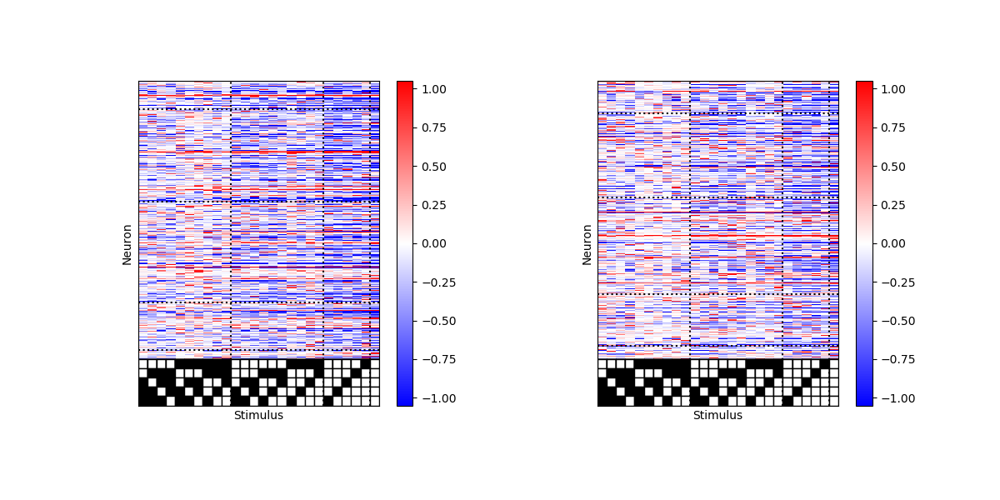

<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


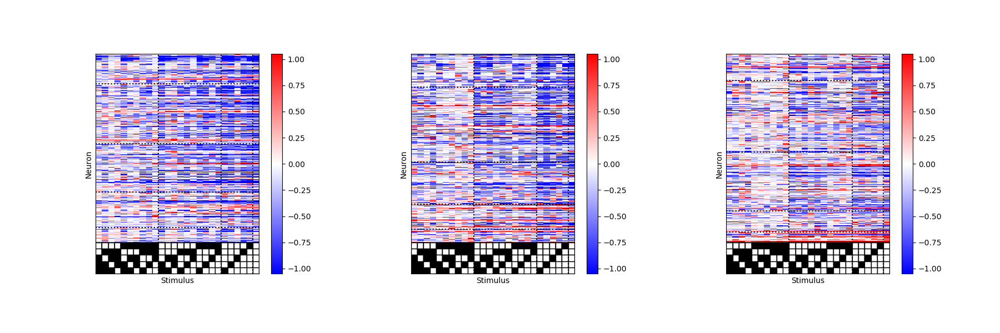

(556, 3)
(556, 3, 32)


<IPython.core.display.Javascript object>


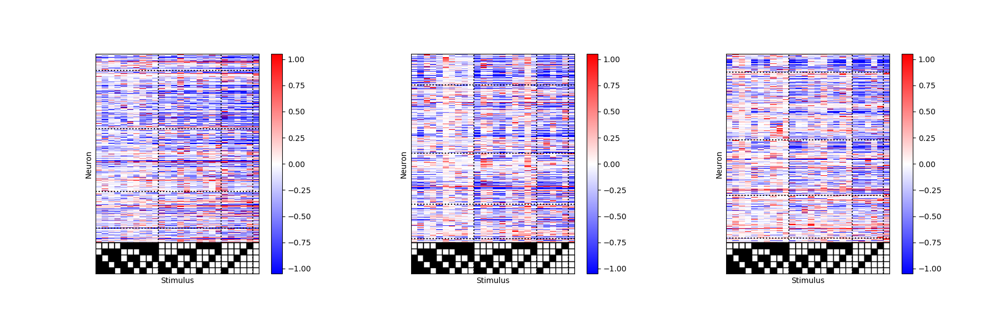

In [36]:
import nub_figures as nf
reload(nf)
reload(utils)
# gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_all_sizes,utils.gen_nub_selector_v1_all_sizes]#_all_sizes
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_all_sizes_split_pupil,utils.gen_nub_selector_v1_all_sizes_split_pupil]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
run_conditions = [[1],[1],[0,1],[0,1]]
for slc in [slice(None,2),slice(2,None)]:
    for train_test_mode in train_test_modes:
        for dsname,lbl,sel,keylist,datafield,run_condition in zip(dsnames[slc],lbls[slc],gen_nub_selector[slc],keylists[slc],datafields[slc],run_conditions[slc]):
        # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
            nf.plot_lin_subtracted(['figures/nub_experienced_non_moving_tuning_curves_three_sizes_%s_%s.jpg'%(lbl,train_test_mode),\
                                    'figures/nub_experienced_moving_tuning_curves_three_sizes_%s_%s.jpg'%(lbl,train_test_mode)],dsname,\
                                   keylist,gen_nub_selector=sel,datafield=datafield,run_conditions=run_condition,dfof_cutoff=0.,train_test_mode=train_test_mode)#0.2)


<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based

<string>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


<IPython.core.display.Javascript object>


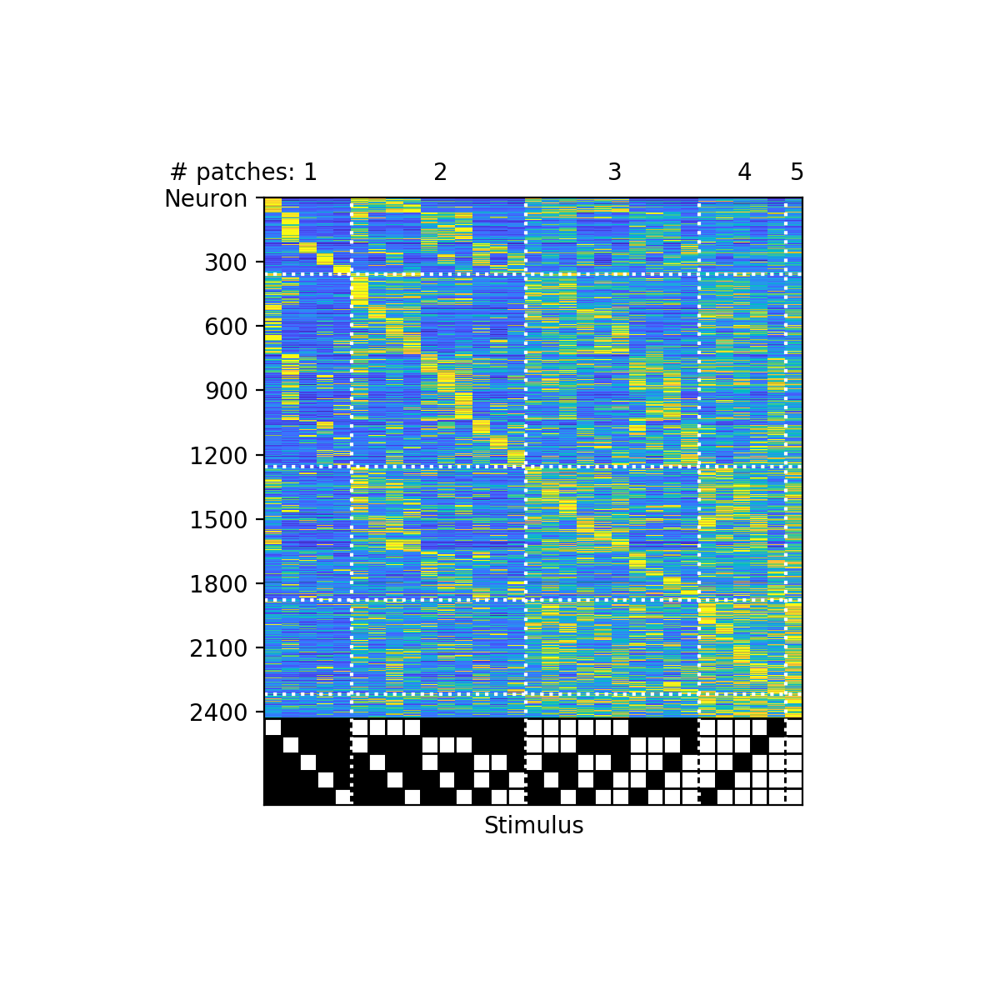

<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based

<IPython.core.display.Javascript object>


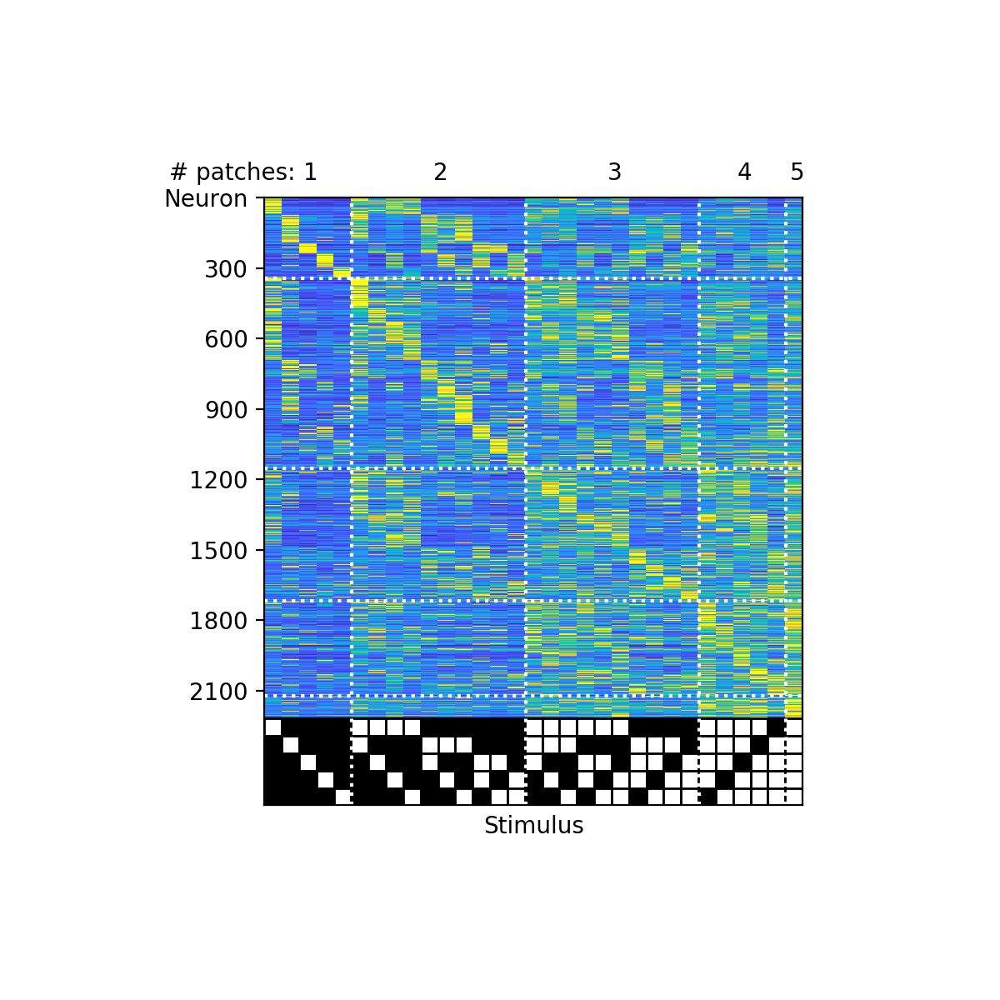

<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based

<IPython.core.display.Javascript object>


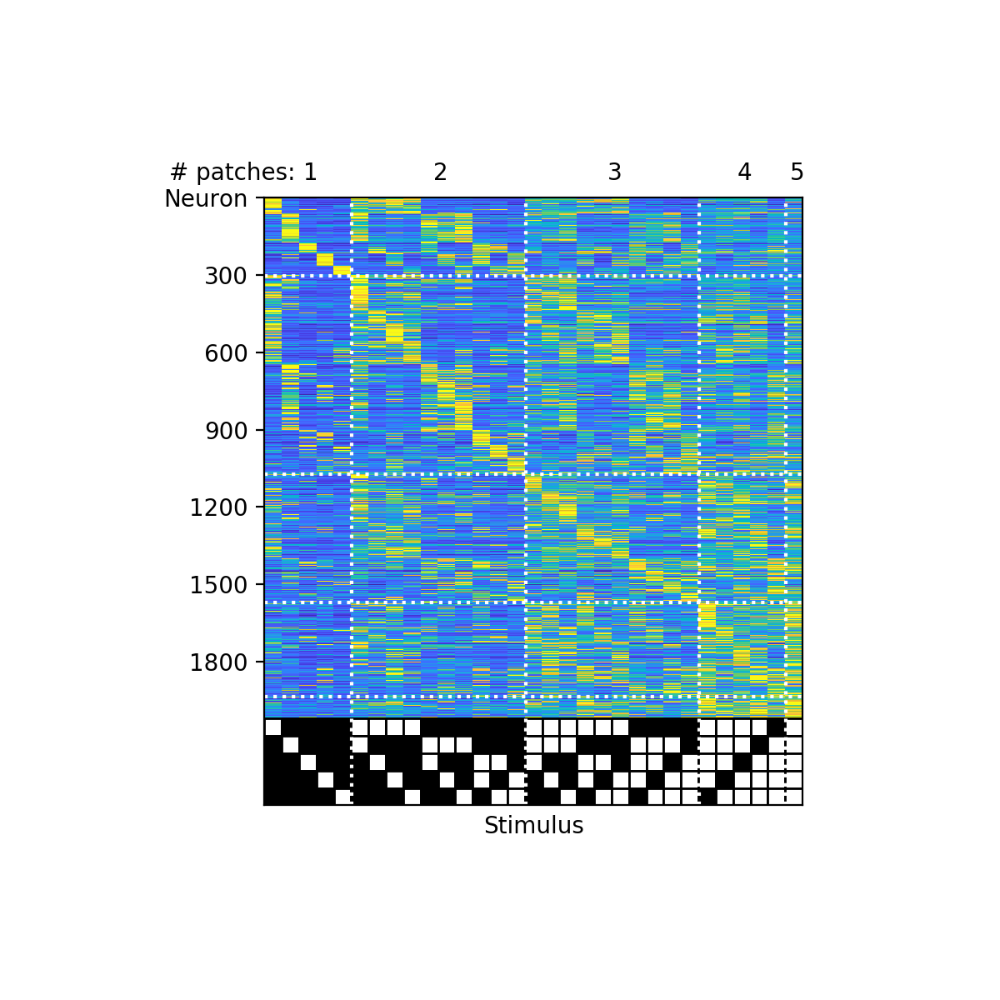

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


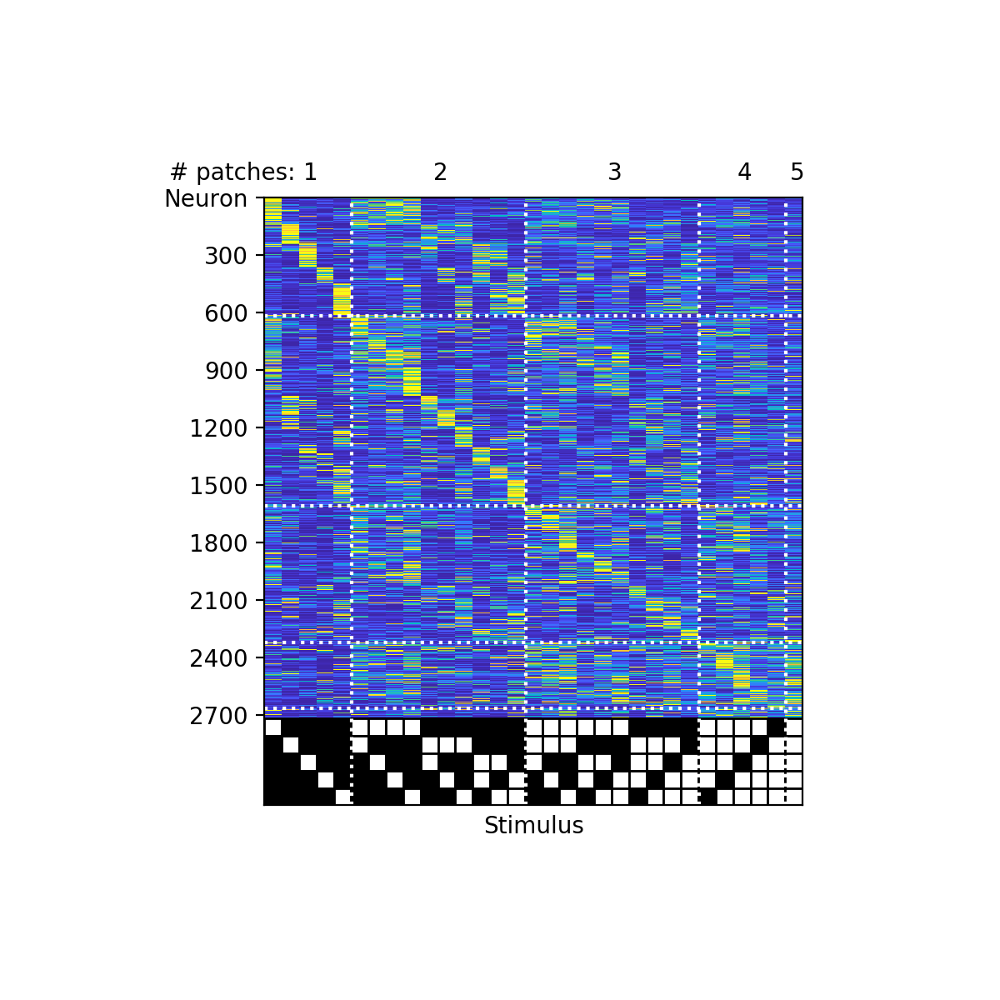

<IPython.core.display.Javascript object>


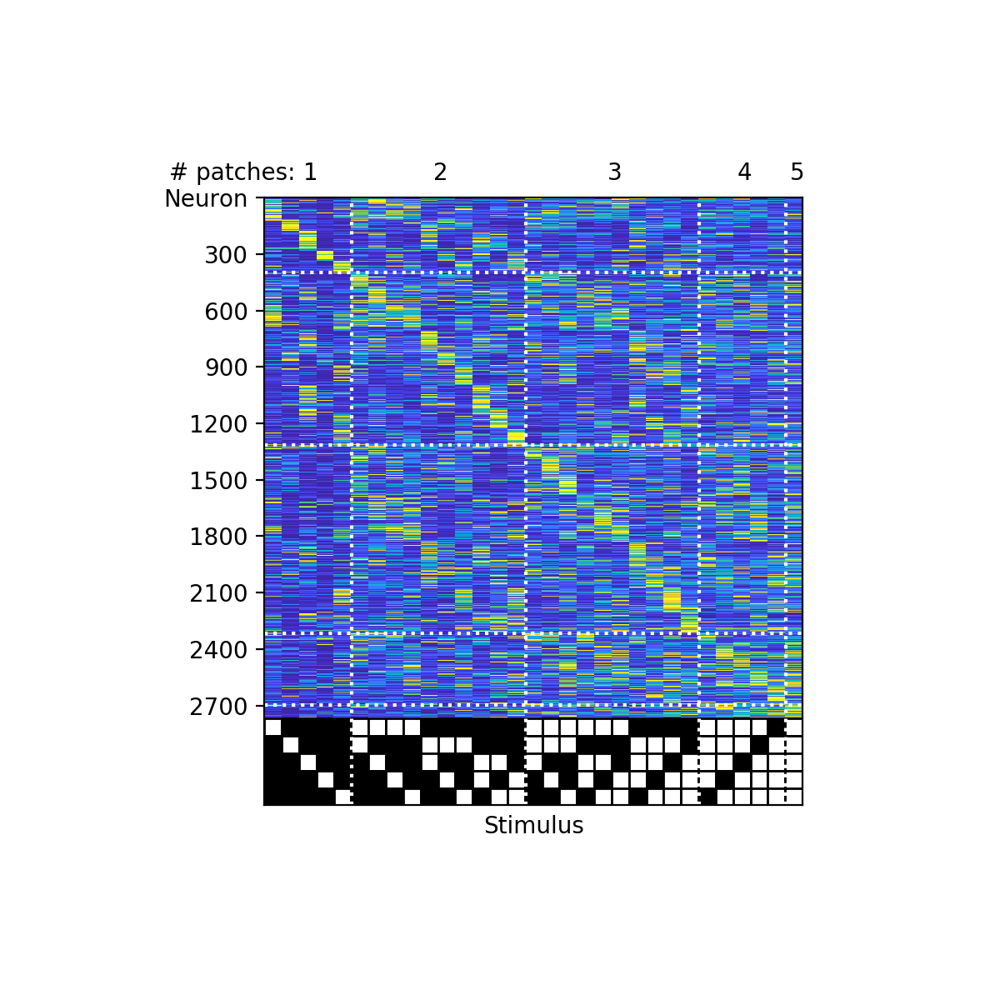

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


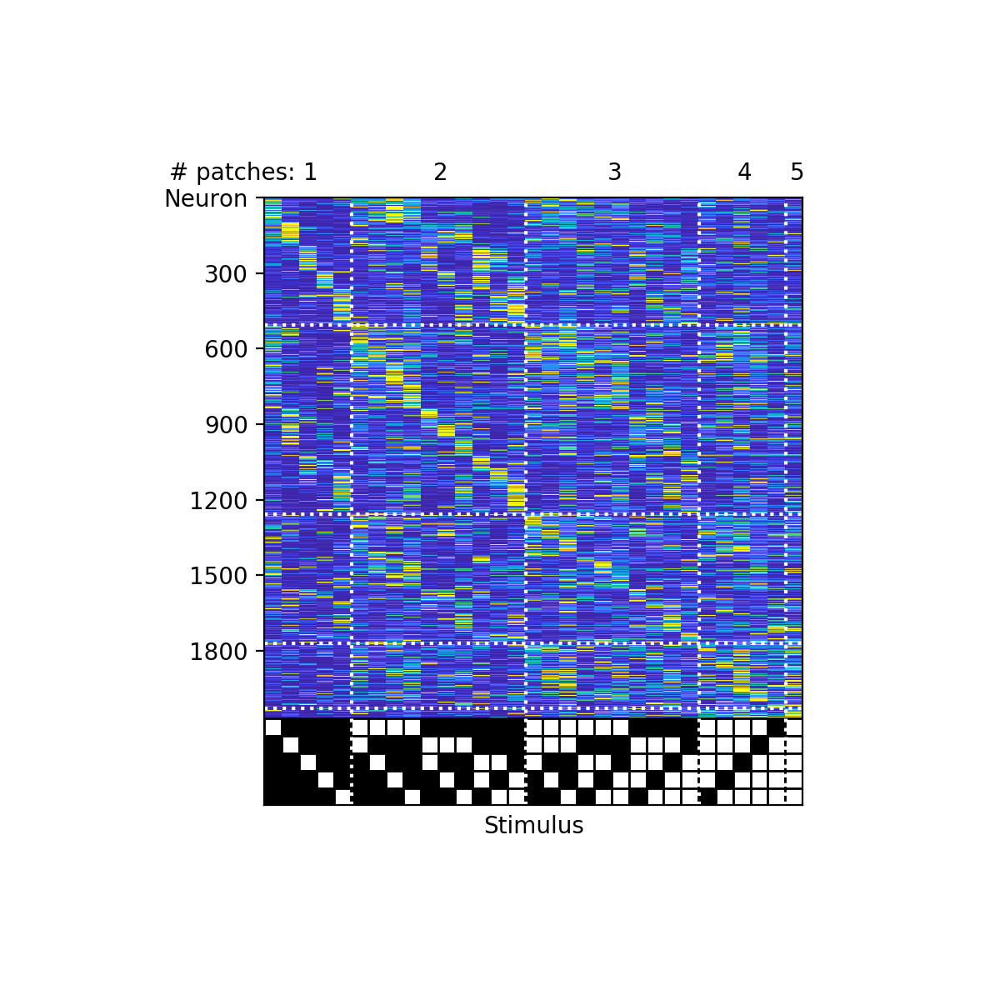

<IPython.core.display.Javascript object>


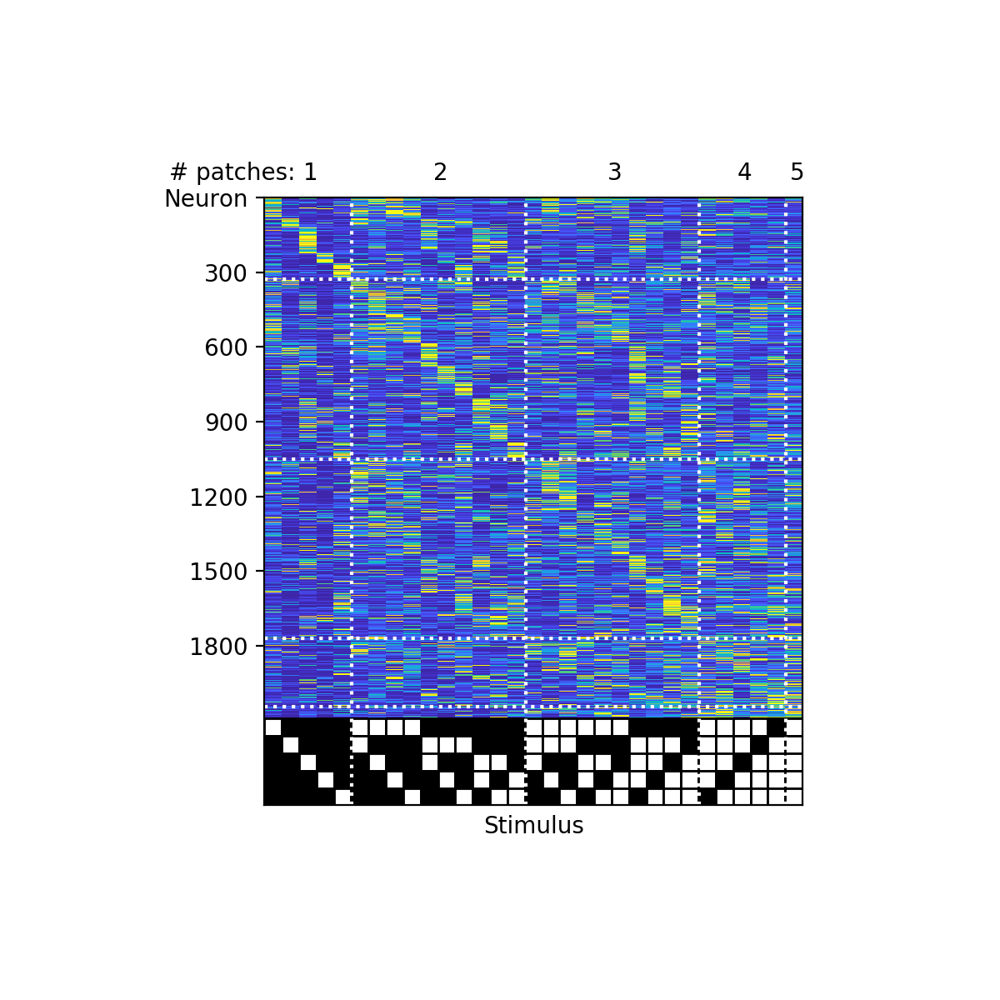

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


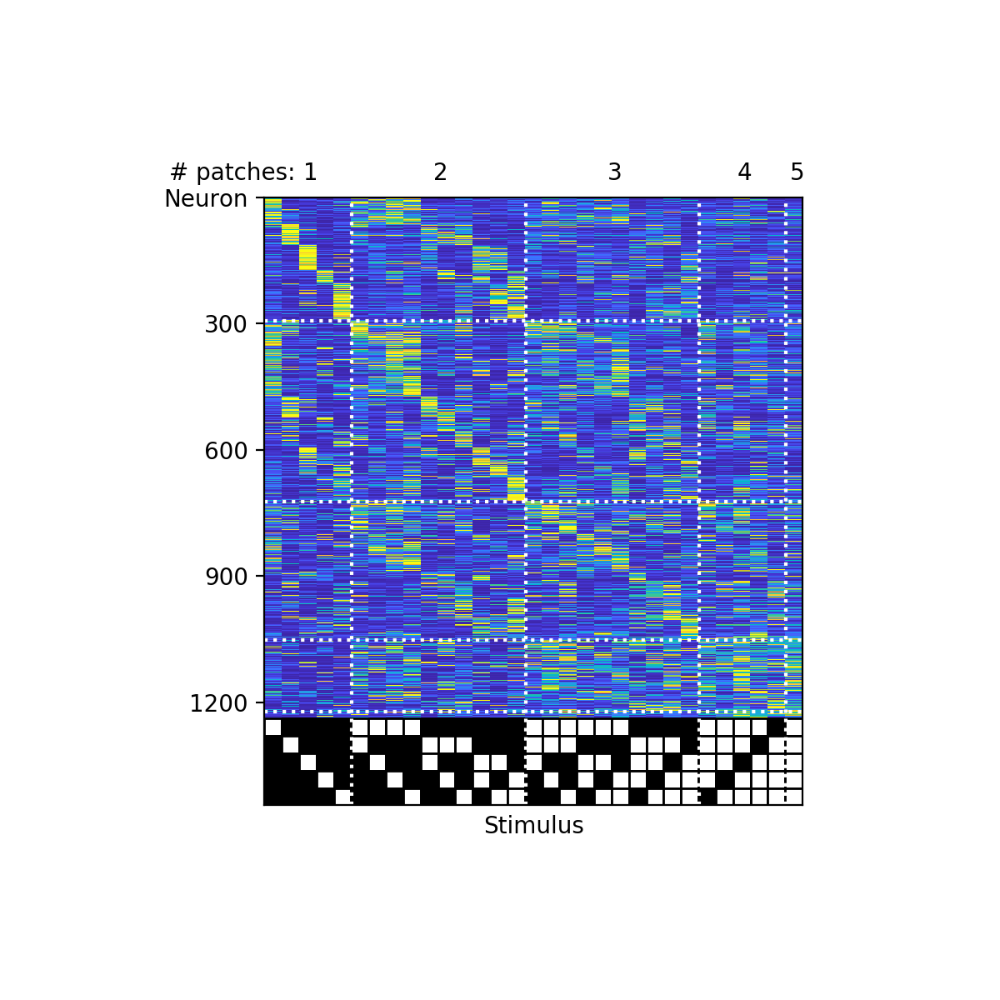

<IPython.core.display.Javascript object>


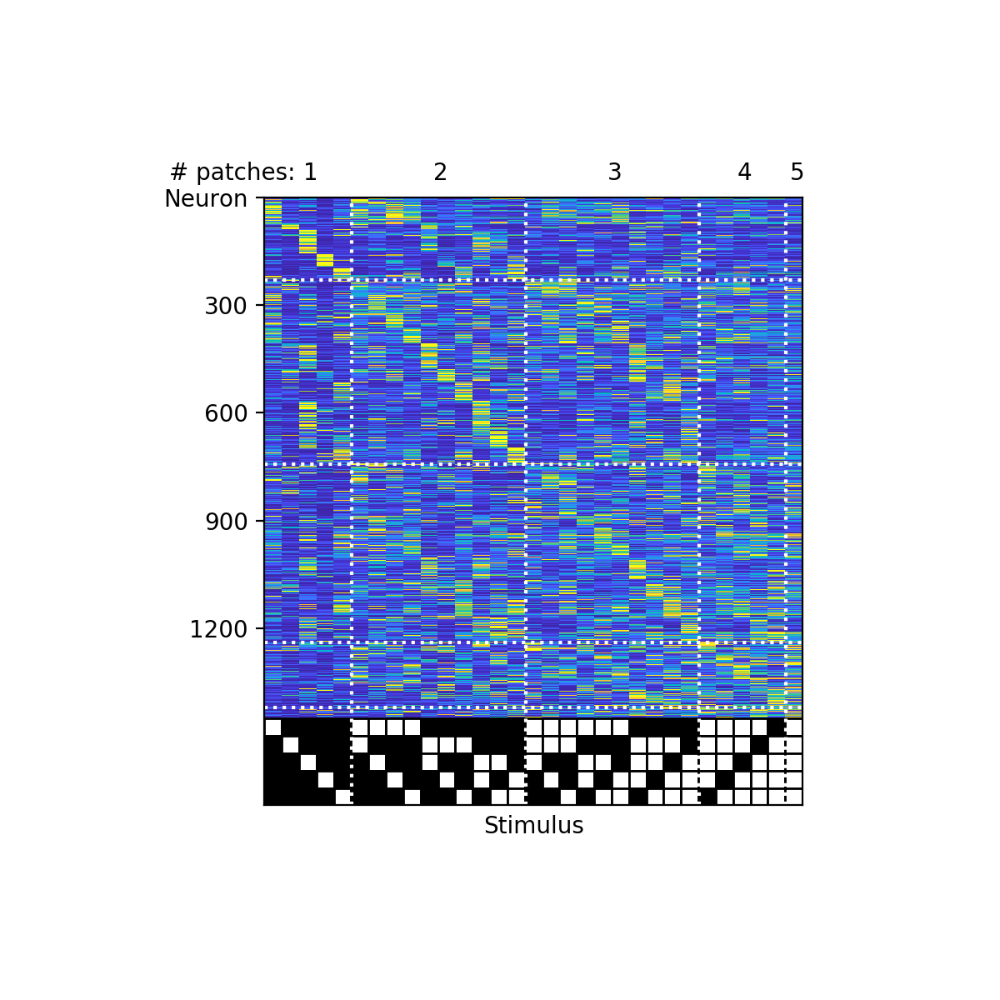

In [25]:
import nub_figures as nf
reload(nf)
reload(utils)
# gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_split_pupil,utils.gen_nub_selector_v1_split_pupil]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
run_conditions = [[1],[1],[0,1],[0,1]]

for slc in [slice(None,2),slice(2,None)]:
    for train_test_mode in train_test_modes:
        for these_dsnames,these_lbls,sels,these_keylists,these_datafields,these_run_conditions in zip([dsnames[slc]],[lbls[slc]],[gen_nub_selector[slc]],[keylists[slc]],[datafields[slc]],[run_conditions[slc]]):
        # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
            nf.plot_combined_tuning_curves(['figures/nub_experienced_non_moving_tuning_curves_combined_%s_%s_%s.jpg'%(these_lbls[0],these_lbls[1],train_test_mode),\
                                            'figures/nub_experienced_moving_tuning_curves_combined_%s_%s_%s.jpg'%(these_lbls[0],these_lbls[1],train_test_mode)],\
                                           these_dsnames,these_keylists,gen_nub_selectors=sels,datafields=these_datafields,run_conditions=these_run_conditions,dfof_cutoff=0.,\
                                           pcutoff=0.05,rcutoff=0.5,colorbar=False,line=False,train_test_mode=train_test_mode)#0.2)


<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


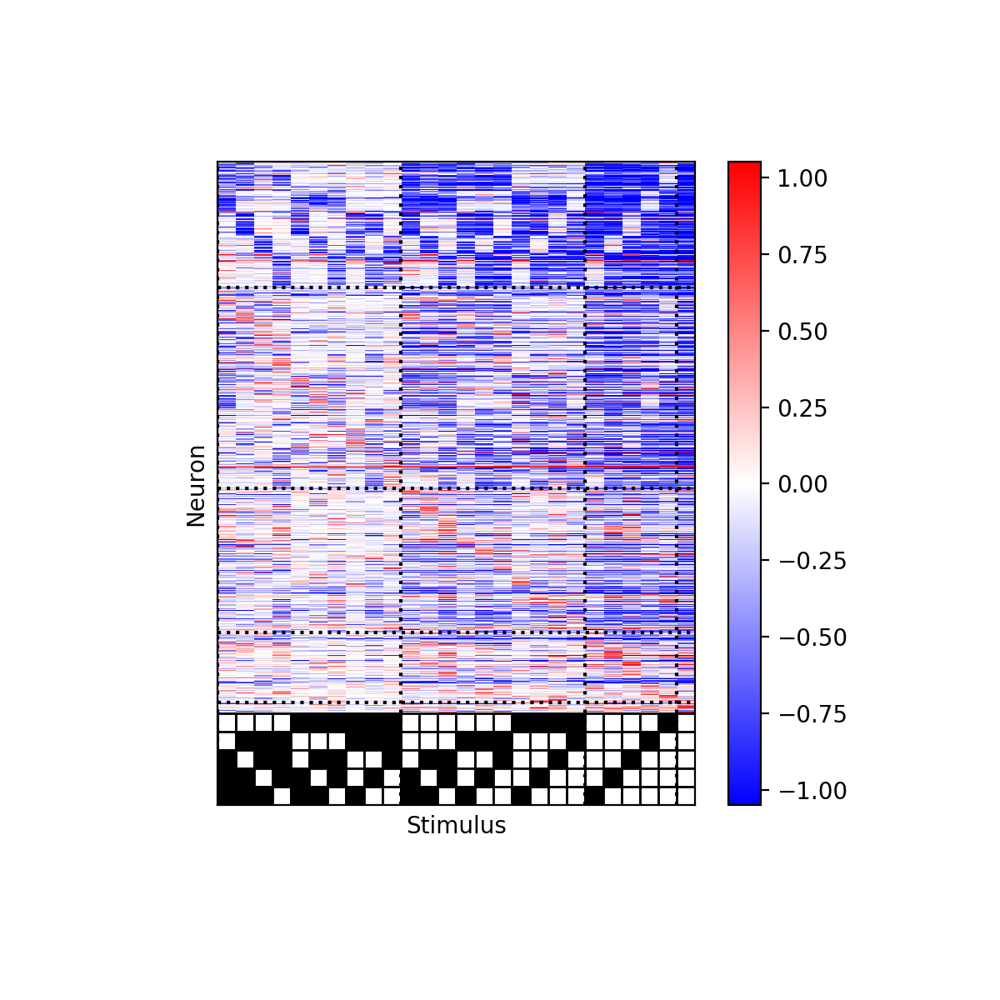

(2769, 1)
(2769, 1, 32)


<IPython.core.display.Javascript object>


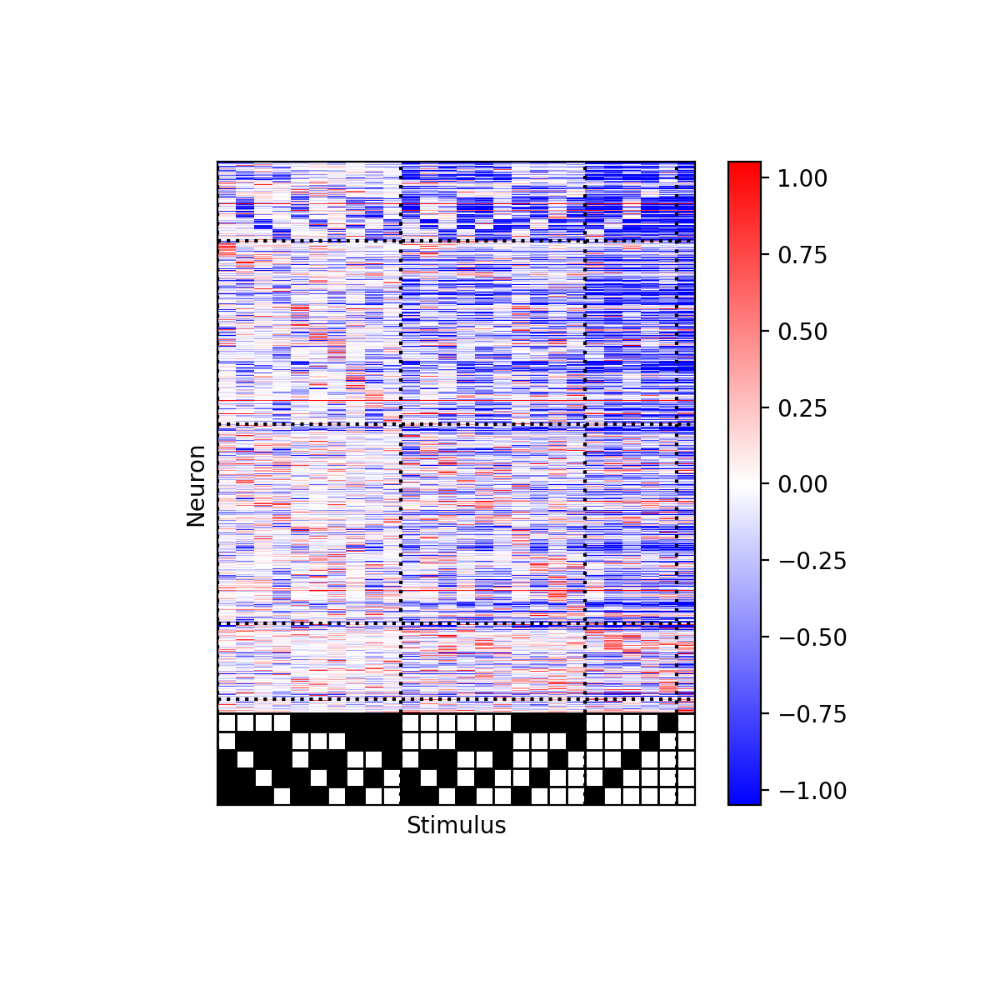

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


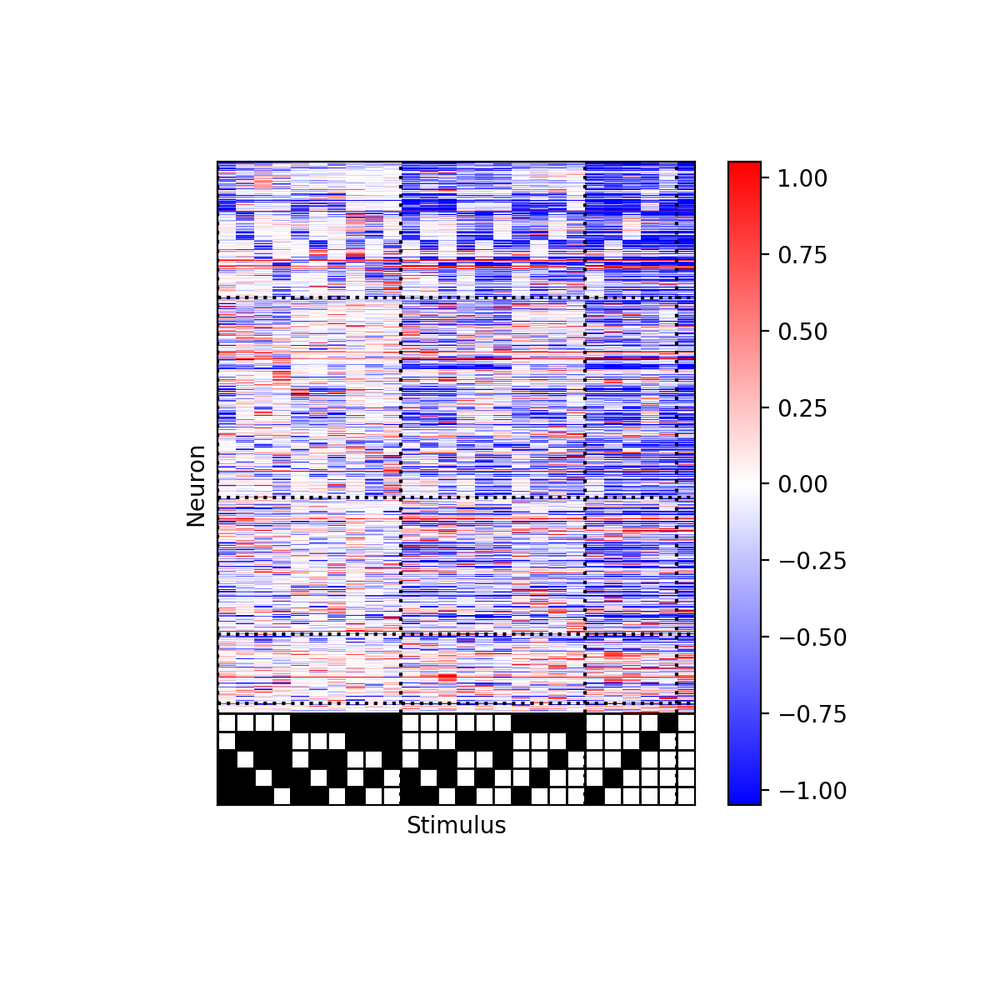

(2092, 1)
(2092, 1, 32)


<IPython.core.display.Javascript object>


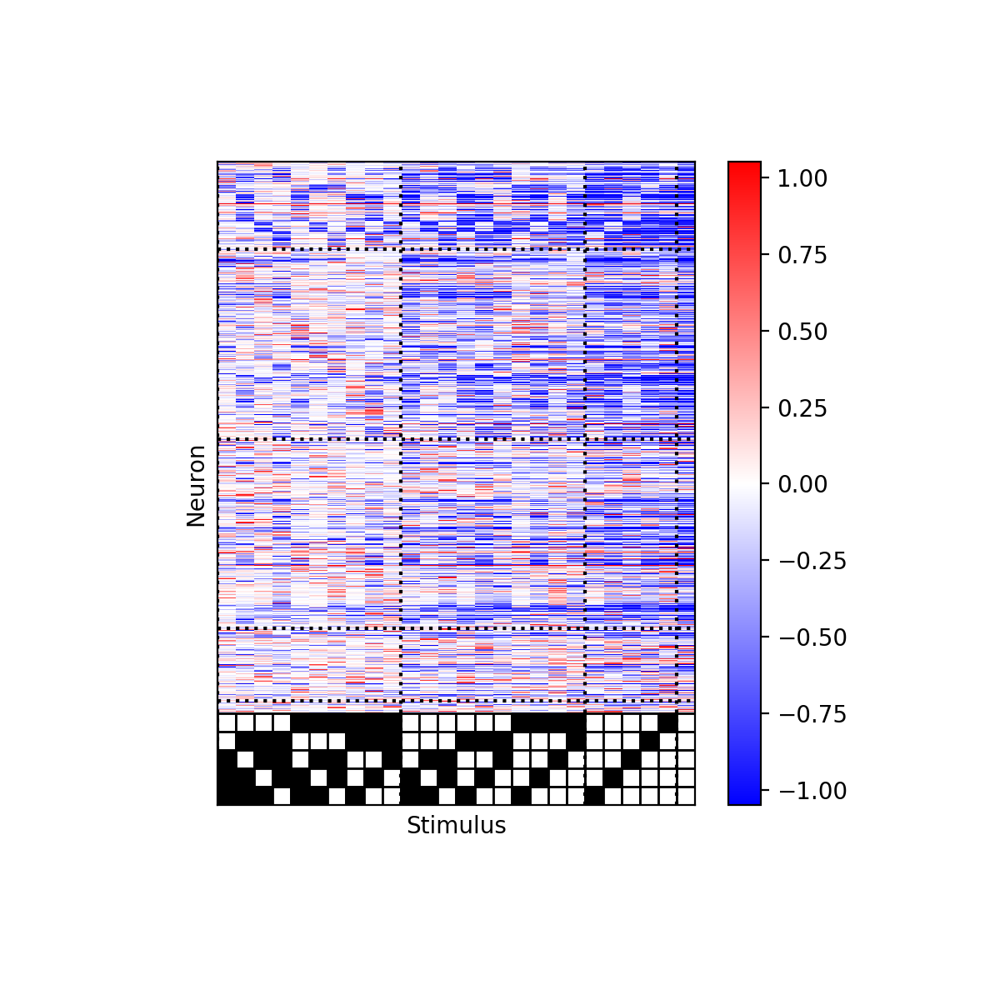

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
ex

<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

<IPython.core.display.Javascript object>


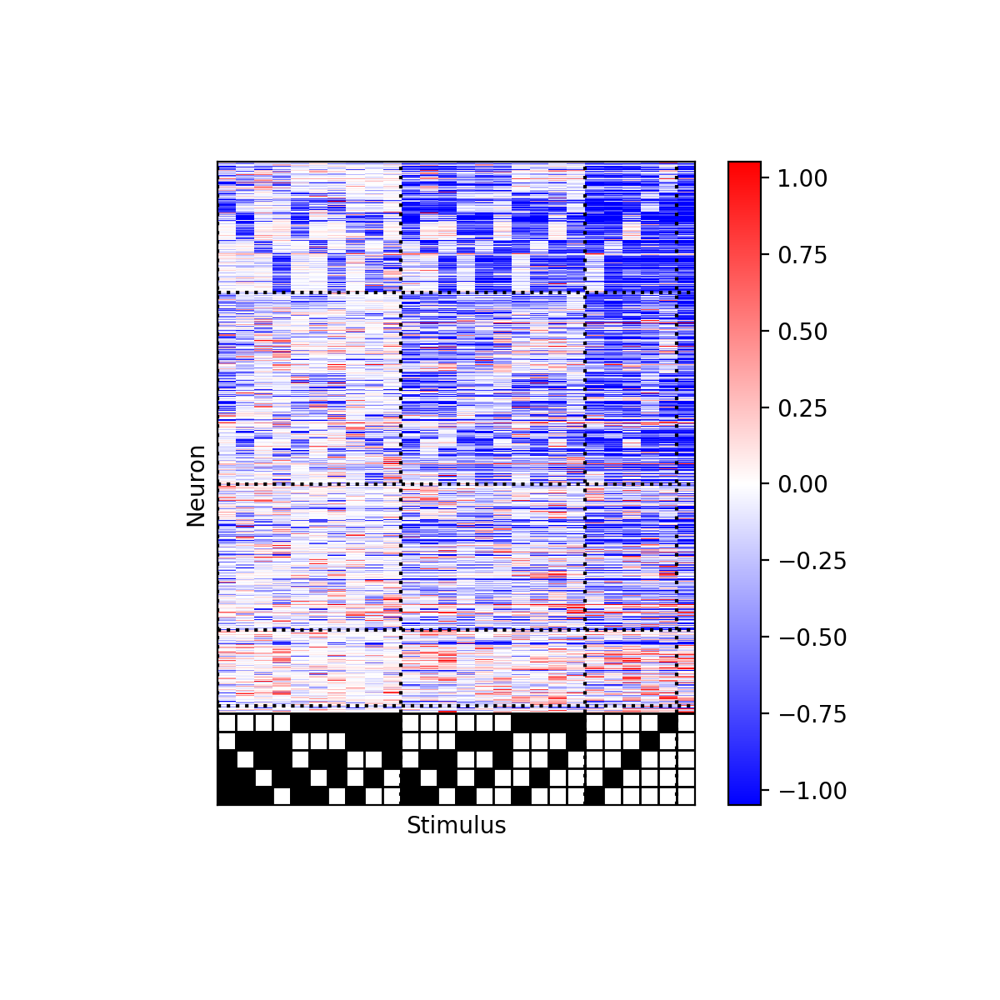

(1452, 1)
(1452, 1, 32)


<IPython.core.display.Javascript object>


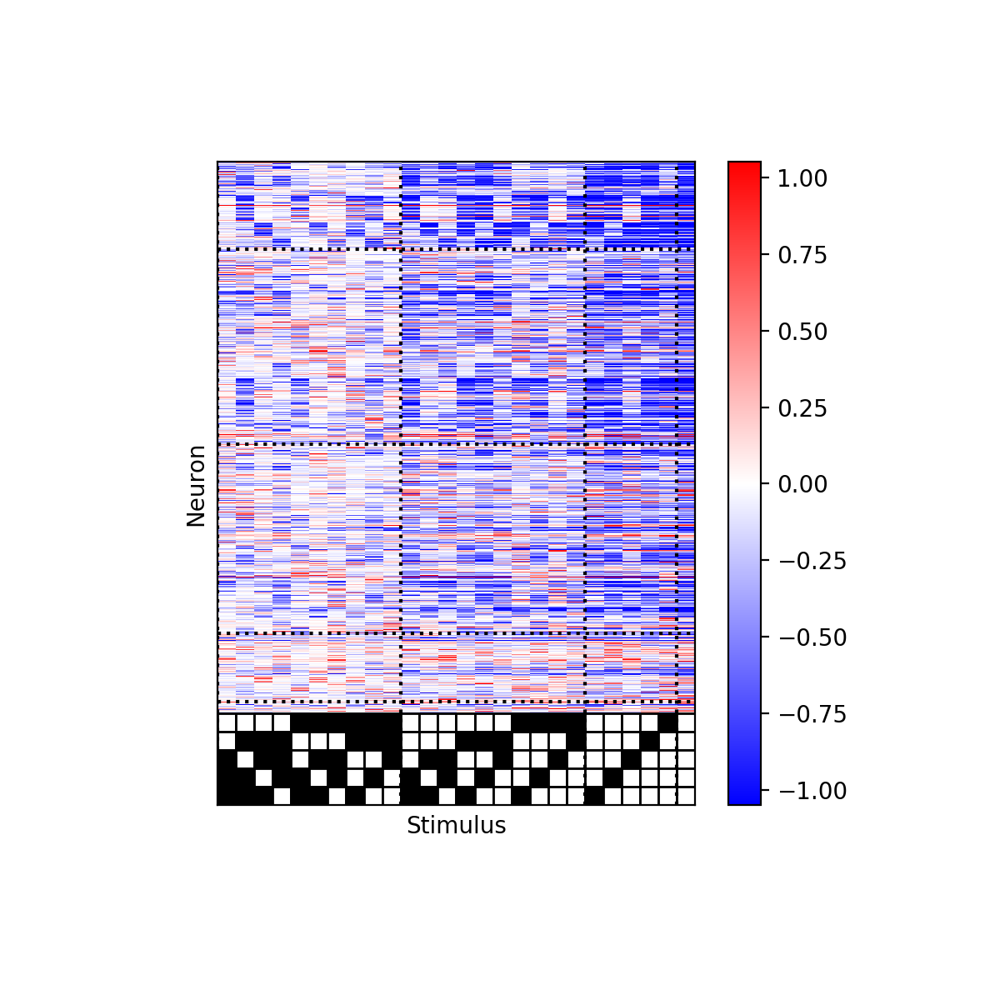

In [26]:
import nub_figures as nf
reload(nf)
reload(utils)
# gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_split_pupil,utils.gen_nub_selector_v1_split_pupil]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
# datafields = ['F','F','F','F']
run_conditions = [[1],[1],[0,1],[0,1]]

# for slc in [slice(None,2),slice(2,None)]:
for slc in [slice(2,None)]:
    for train_test_mode in train_test_modes:
        for these_dsnames,these_lbls,sels,these_keylists,these_datafields,these_run_conditions in zip([dsnames[slc],dsnames[slc]],[lbls[slc]],[gen_nub_selector[slc]],[keylists[slc]],[datafields[slc]],[run_conditions[slc]]):
        # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
            nf.plot_combined_lin_subtracted(['figures/nub_experienced_non_moving_lin_subtracted_combined_%s_%s_%s.jpg'%(these_lbls[0],these_lbls[1],train_test_mode),'figures/nub_experienced_moving_lin_subtracted_combined_%s_%s_%s.jpg'%(these_lbls[0],these_lbls[1],train_test_mode)],\
                                            these_dsnames,these_keylists,gen_nub_selectors=sels,datafields=these_datafields,\
                                            run_conditions=these_run_conditions,dfof_cutoff=0.,pcutoff=0.05,rcutoff=0.5,colorbar=False,\
                                            line=False,train_test_mode=train_test_mode)#0.2)

In [20]:
dsnames[slicer]

['/Users/dan/Documents/notebooks/mossing-PC/shared_data/evan_nub_data_struct_l4_repdf.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/shared_data/evan_nub_data_struct_l23_repdf.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/shared_data/nub_l4_data_struct.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/shared_data/nub_l23_data_struct.hdf5',
 '/Users/dan/Documents/notebooks/mossing-PC/shared_data/evan_nub_data_struct_wiggle_l23_repdf.hdf5']

In [21]:
print([len(x) for x in [dsnames[slicer],lbls[slicer],gen_nub_selector[slicer],keylists[slicer],datafields[slicer],run_conditions[slicer],dfof_cutoffs[slicer]]])

[5, 4, 5, 5, 5, 5, 5]


In [156]:
lbls

['s1_l4', 's1_l23', 'v1_l4', 'v1_l23', 's1_l23_anes']

<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


roracle: 0/320
roracle: 0/270
roracle: 0/540
roracle: 0/336
roracle: 0/588
roracle: 0/374
roracle: 111/320
roracle: 74/270
roracle: 109/540
roracle: 113/336
roracle: 267/588
roracle: 176/374
[0.0, 0.3500823723228995]
<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


dF/F above cutoff: 358/540
sig. driven: 4/540
dF/F above cutoff: 236/336
sig. driven: 2/336


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe',

dF/F above cutoff: 441/588
sig. driven: 53/588
dF/F above cutoff: 216/374
sig. driven: 8/374
<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
dF/F above cutoff: 258/320
sig. driven: 127/320
dF/F above cutoff: 200/270
sig. driven: 95/270
dF/F above cut

/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (6, 2)
this_tunings_pct shape: (3, 6, 2)
<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


roracle: 0/997
roracle: 0/536
roracle: 4/795
roracle: 586/997
roracle: 234/536
roracle: 498/795
[0.001718213058419244, 0.5661512027491409]
<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


dF/F above cutoff: 564/997
sig. driven: 0/997
dF/F above cutoff: 276/536
sig. driven: 15/536


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


dF/F above cutoff: 418/795
sig. driven: 3/795
<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


dF/F above cutoff: 824/997
sig. driven: 604/997
dF/F above cutoff: 418/536
sig. driven: 260/536
dF/F above cutoff: 721/795
sig. driven: 552/795
driven: [0.007731958762886598, 0.6082474226804123]


/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (3, 2)
this_tunings_pct shape: (3, 3, 2)
<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
excluding based on running: 0.42
excluding based on stimulus_size: 0.50
excluding based on running: 0.33
excluding based on stimulus_size: 0.50
excluding ba

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


roracle: 907/1720
roracle: 428/1571
roracle: 294/1768
roracle: 259/1801
roracle: 305/1111
roracle: 786/1720
roracle: 544/1571
roracle: 194/1768
roracle: 830/1801
roracle: 335/1111
[0.2751223184042153, 0.3373478860870656]
<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
dF/F abov

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
dF/F above cutoff: 1538/1720
sig. driven: 1212/1720
dF/F above cutoff: 1481/1571
sig. driven: 1078/1571
dF/F above cutoff: 1418/1768
sig. driven: 566/1768
dF/F above cutoff: 1444/1801
sig. driven: 1036/1801
dF/F above cutoff: 1040/1111
sig. driven: 779/1111
driven: [0.2743695897628905, 0.5859992472713587]


/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (5, 2)
this_tunings_pct shape: (3, 5, 2)
<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'm

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


roracle: 396/1461
roracle: 429/1472
roracle: 528/2162
roracle: 570/2191
roracle: 0/1220
roracle: 0/1461
roracle: 0/1472
roracle: 566/2162
roracle: 0/2191
roracle: 248/1220
[0.22607571126263815, 0.09569715494944744]
<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/

/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (5, 2)
this_tunings_pct shape: (3, 5, 2)
<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


['session_evan_9019_165', 'session_evan_9025_180', 'session_evan_9445_180']
['running', 'stimulus_nubs_active']
excluding based on running: 1.00
excluding based on running: 1.00
excluding based on running: 1.00
['running', 'stimulus_nubs_active']
excluding based on running: 0.00
excluding based on running: 0.00
excluding based on running: 0.00


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_9019_165', 'session_evan_9025_180', 'session_evan_9445_180']
['running', 'stimulus_nubs_active']
excluding based on running: 1.00
excluding based on running: 1.00
excluding based on running: 1.00
['running', 'stimulus_nubs_active']
excluding based on running: 0.00
excluding based on running: 0.00
excluding based on running: 0.00


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


roracle: 0/809
roracle: 0/553
roracle: 0/106
roracle: 177/809
roracle: 160/553
roracle: 50/106
[0.0, 0.26362397820163486]
<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
dF/F above cutoff: 0/809
sig. driven: 0/809
dF/F above cutoff: 0/553
sig. driven: 0/553
dF/F above cutoff: 0/106
sig. driven: 0/106
<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


dF/F above cutoff: 662/809
sig. driven: 221/809
dF/F above cutoff: 440/553
sig. driven: 177/553
dF/F above cutoff: 89/106
sig. driven: 0/106
driven: [0.0, 0.27111716621253407]


/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (3, 2)
this_tunings_pct shape: (3, 3, 2)
<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_7734_308', 'session_evan_7734_338', 'session_evan_7736_265', 'session_evan_7736_300', 'session_evan_7737_291', 'session_evan_7737_326']
['running', 'stimulus_nubs_active']
excluding based

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


roracle: 0/320
roracle: 0/270
roracle: 0/540
roracle: 0/336
roracle: 0/588
roracle: 0/374
roracle: 99/320
roracle: 70/270
roracle: 92/540
roracle: 92/336
roracle: 234/588
roracle: 149/374
[0.0, 0.3031301482701812]
<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


dF/F above cutoff: 358/540
sig. driven: 4/540
dF/F above cutoff: 236/336
sig. driven: 2/336


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe',

dF/F above cutoff: 441/588
sig. driven: 53/588
dF/F above cutoff: 216/374
sig. driven: 8/374
<HDF5 group "/session_evan_7734_308" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
dF/F above cutoff: 258/320
sig. driven: 127/320
dF/F above cutoff: 200/270
sig. driven: 95/270
dF/F above cut

/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (6, 3)
this_tunings_pct shape: (3, 6, 3)
<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_6994_210', 'session_evan_7120_250', 'session_evan_7142_220']
['running', 'stimulus_nubs_active']
excluding based on running: 0.90
excluding based on running: 0.88
excluding based on running: 0.73
['running', 'stimulus_nubs_active']
excluding based on running: 0.10
excluding based on running: 0.12
excluding based on running: 0.27


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


roracle: 0/997
roracle: 0/536
roracle: 6/795
roracle: 558/997
roracle: 219/536
roracle: 452/795
[0.002577319587628866, 0.5279209621993127]
<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


dF/F above cutoff: 564/997
sig. driven: 0/997
dF/F above cutoff: 276/536
sig. driven: 15/536


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/core/_methods.py:224: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


dF/F above cutoff: 418/795
sig. driven: 3/795
<HDF5 group "/session_evan_6994_210" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (7 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


dF/F above cutoff: 824/997
sig. driven: 604/997
dF/F above cutoff: 418/536
sig. driven: 260/536
dF/F above cutoff: 721/795
sig. driven: 552/795
driven: [0.007731958762886598, 0.6082474226804123]


/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (3, 3)
this_tunings_pct shape: (3, 3, 3)
<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']
['running', 'dilated', 'centered', 'stimulus_size', 'stimulus_direction_deg', 'stimulus_nubs_active']
excluding based on running: 0.42
excluding based on stimulus_size: 0.50
excluding based on running: 0.33
excluding based on stimulus_size: 0.50
excluding ba

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


roracle: 788/1720
roracle: 321/1571
roracle: 205/1768
roracle: 225/1801
roracle: 229/1111
roracle: 542/1720
roracle: 394/1571
roracle: 210/1768
roracle: 636/1801
roracle: 242/1111
[0.22180403964370846, 0.2539204616735667]
<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
dF/F abo

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
dF/F above cutoff: 1538/1720
sig. driven: 1212/1720
dF/F above cutoff: 1481/1571
sig. driven: 1078/1571
dF/F above cutoff: 1418/1768
sig. driven: 566/1768
dF/F above cutoff: 1444/1801
sig. driven: 1036/1801
dF/F above cutoff: 1040/1111
sig. driven: 779/1111
driven: [0.2743695897628905, 0.5859992472713587]


/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (5, 3)
this_tunings_pct shape: (3, 5, 3)
<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'm

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]


roracle: 286/1461
roracle: 320/1472
roracle: 382/2162
roracle: 378/2191
roracle: 0/1220
roracle: 0/1461
roracle: 0/1472
roracle: 398/2162
roracle: 0/2191
roracle: 206/1220
[0.16059252292499412, 0.07100869974135904]
<HDF5 group "/session_191108_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/

/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (5, 3)
this_tunings_pct shape: (3, 5, 3)
<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


['session_evan_9019_165', 'session_evan_9025_180', 'session_evan_9445_180']
['running', 'stimulus_nubs_active']
excluding based on running: 1.00
excluding based on running: 1.00
excluding based on running: 1.00
['running', 'stimulus_nubs_active']
excluding based on running: 0.00
excluding based on running: 0.00
excluding based on running: 0.00


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/autograd/tracer.py:48: RuntimeWarning: Mean of empty slice
  return f_raw(*args, **kwargs)


<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
['session_evan_9019_165', 'session_evan_9025_180', 'session_evan_9445_180']
['running', 'stimulus_nubs_active']
excluding based on running: 1.00
excluding based on running: 1.00
excluding based on running: 1.00
['running', 'stimulus_nubs_active']
excluding based on running: 0.00
excluding based on running: 0.00
excluding based on running: 0.00


/opt/anaconda3/envs/py3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1390: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


roracle: 0/809
roracle: 0/553
roracle: 0/106
roracle: 128/809
roracle: 139/553
roracle: 44/106
[0.0, 0.21185286103542234]
<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
dF/F above cutoff: 0/809
sig. driven: 0/809
dF/F above cutoff: 0/553
sig. driven: 0/553
dF/F above cutoff: 0/106
sig. driven: 0/106
<HDF5 group "/session_evan_9019_165" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9025_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_9445_180" (5 members)>
['cell_id', 'cell_type', 'lkat', 'mouse_id', 'nub_0']


/Users/dan/Documents/code/adesnal/pyute.py:1270: RuntimeWarning: Mean of empty slice
  data = np.nanmean(sc0[datafield][:,:,nbefore:-nafter][:],-1) # N neurons x P trials (previously x T timepoints)


dF/F above cutoff: 662/809
sig. driven: 221/809
dF/F above cutoff: 440/553
sig. driven: 177/553
dF/F above cutoff: 89/106
sig. driven: 0/106
driven: [0.0, 0.27111716621253407]


/Users/dan/Documents/code/adesnal/nub_figures.py:530: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:392: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=7)
/Users/dan/Documents/code/adesnal/nub_figures.py:623: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  single_whisker_responses = test_norm_response[slicer]
/Users/dan/Documents/code/adesnal/nub_figures.py:631: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an a

tuning_a shape: (3, 3)
this_tunings_pct shape: (3, 3, 3)


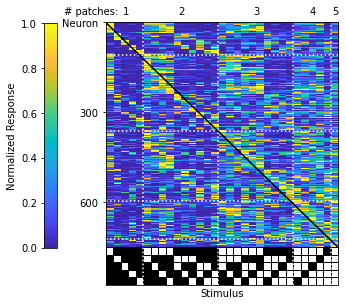

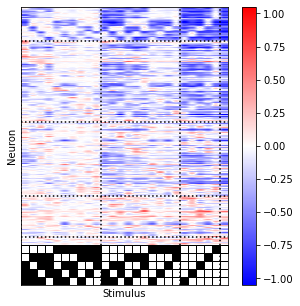

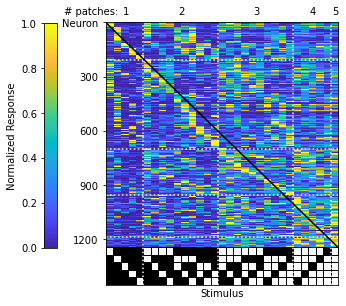

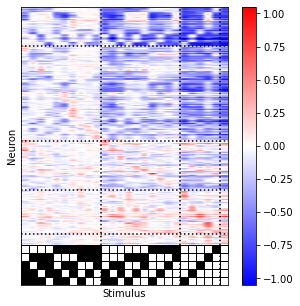

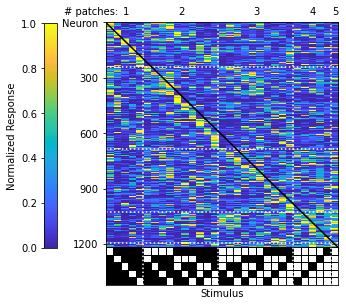

...

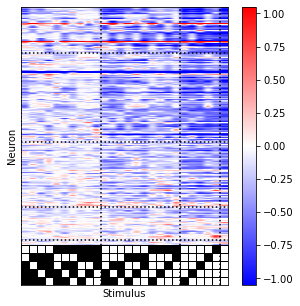

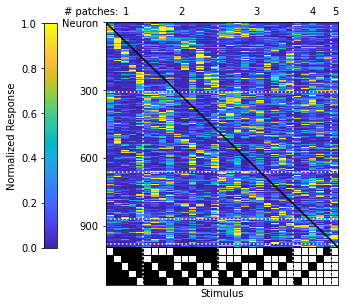

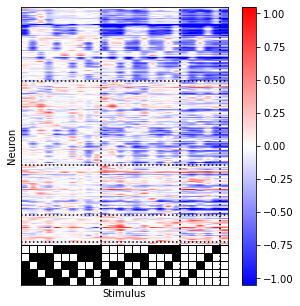

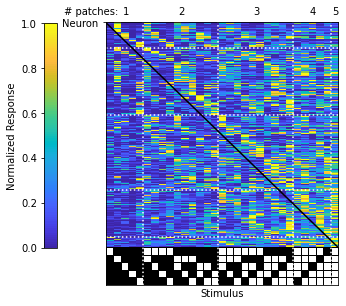

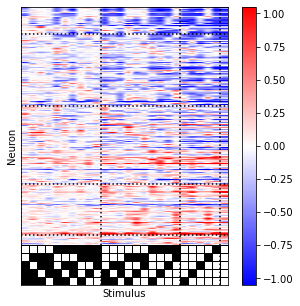

In [305]:
lbls = ['s1_l4', 's1_l23', 'v1_l4', 'v1_l23', 's1_l23_anes']

dsnames = [dsbase+x for x in ['evan_nub_data_struct_l4_repdf.hdf5','evan_nub_data_struct_l23_repdf.hdf5','nub_l4_data_struct.hdf5','nub_l23_data_struct_low_blcutoff.hdf5','evan_nub_data_struct_wiggle_l23_repdf.hdf5']]

npartitionings = 1

import nub_figures as nf
from importlib import reload
import nub_utils as utils
reload(nf)
reload(utils)
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1_split_pupil,utils.gen_nub_selector_v1_split_pupil,utils.gen_nub_selector_s1]#_all_sizes
keylists = [None,non_filled_expts,None,experienced_expts,None]
datafields = ['repwise_dFoF','repwise_dFoF','decon','decon','repwise_dFoF']
run_conditions = [[1],[1],[0],[0],[1]]
dfof_cutoffs = [0.,0.,0.,0.,0.]
pct = (0.05,99.95,50)
# pct = (45,55,50)
tuningses,lkatses,lin_subtractedses,sorteachses,sortindses,expt_idses,boundses,lin_subtracted_boundses = [{} for _ in range(8)]
for train_test_mode in ['halves','thirds']:
    tuningses[train_test_mode] = []
    lkatses[train_test_mode] = []
    lin_subtractedses[train_test_mode] = []
    sorteachses[train_test_mode] = []
    sortindses[train_test_mode] = []
    expt_idses[train_test_mode] = []
    boundses[train_test_mode] = []
    lin_subtracted_boundses[train_test_mode] = []
    slicer = slice(None)
    for dsname,lbl,sel,keylist,datafield,run_condition,dfof_cutoff in zip(dsnames[slicer],lbls[slicer],gen_nub_selector[slicer],keylists[slicer],datafields[slicer],run_conditions[slicer],dfof_cutoffs[slicer]):
    # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
        tunings = []
        lkats = []
        lin_subtracteds = []
        sorteachs = []
        sortinds = []
        expt_ids = []
        bounds = []
        lin_subtracted_bounds = []
        for ipartitioning in range(npartitionings):
    #         tuning,lkat = \
    #         nf.plot_tuning_curves(['figures/nub_experienced_non_moving_tuning_curves_'+lbl+'.jpg',\
    #                                 'figures/nub_experienced_moving_tuning_curves_'+lbl+'.jpg'],\
    #                                dsname,keylist,gen_nub_selector=sel,datafield=datafield,dfof_cutoff=dfof_cutoff,\
    #                                run_conditions=run_condition,rcutoff=0.5,seed=ipartitioning)
#             tuning,lkat,lin_subtracted,sorteach,sortind,expt_id = \
#                 nf.plot_tuning_curves_and_lin_subtracted(['a.jpg','b.jpg'],['a.jpg','b.jpg'],\
#                                    dsname,keylist,gen_nub_selector=sel,datafield=datafield,dfof_cutoff=dfof_cutoff,\
#                                    run_conditions=run_condition,rcutoff=0.5,seed=ipartitioning,bound_lin_subtracted=False)
            tuning,lkat,lin_subtracted,sorteach,sortind,expt_id,bound,lin_subtracted_bound = \
                nf.plot_tuning_curves_and_lin_subtracted(['a.jpg','b.jpg'],['a.jpg','b.jpg'],\
                                   dsname,keylist,gen_nub_selector=sel,datafield=datafield,dfof_cutoff=dfof_cutoff,\
                                   run_conditions=run_condition,rcutoff=0.5,seed=ipartitioning,bound_lin_subtracted=True,
                                                        train_test_mode=train_test_mode,trialwise_dfof=False,pct=pct)
        #lin_subtracted,sorteach,sortind,expt_id = \
    #         nf.plot_lin_subtracted(['figures/nub_experienced_non_moving_tuning_curves_'+lbl+'.jpg',\
    #                                 'figures/nub_experienced_moving_tuning_curves_'+lbl+'.jpg'],\
    #                                dsname,keylist,gen_nub_selector=sel,datafield=datafield,dfof_cutoff=dfof_cutoff,\
    #                                run_conditions=run_condition,rcutoff=0.5,seed=ipartitioning)
            tunings.append(tuning)
            lkats.append(lkat)
            lin_subtracteds.append(lin_subtracted)
            sorteachs.append(sorteach)
            sortinds.append(sortind)
            expt_ids.append(expt_id)
            bounds.append(bound)
            lin_subtracted_bounds.append(lin_subtracted_bound)
        tuningses[train_test_mode].append(tunings)
        lkatses[train_test_mode].append(lkats)
        lin_subtractedses[train_test_mode].append(lin_subtracteds)
        sorteachses[train_test_mode].append(sorteachs)
        sortindses[train_test_mode].append(sortinds)
        expt_idses[train_test_mode].append(expt_ids)
        boundses[train_test_mode].append(bounds)
        lin_subtracted_boundses[train_test_mode].append(lin_subtracted_bounds)
    # import nub_figures as nf
    # reload(nf)
    # reload(utils)
    # gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
    # keylists = [None,None,None,experienced_expts]
    # datafields = ['F','F','decon','decon']
    # for dsname,lbl,sel,keylist,datafield in zip(dsnames[-2:],lbls[-2:],gen_nub_selector[-2:],keylists,datafields[-2:]):
    # # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
    #     nf.plot_lin_subtracted(['figures/nub_experienced_non_moving_lin_subtracted_'+lbl+'.jpg','figures/nub_experienced_moving_lin_subtracted_'+lbl+'.jpg'],dsname,keylist,gen_nub_selector=sel,datafield=datafield)

In [306]:
# bounds: list of lists, running x expt x partition x pct (percentile) x (roi x size? x stim)


In [307]:
this_dsname = dsnames[3]
print(this_dsname)
with ut.hdf5read(this_dsname) as ds:
    print(list(ds.keys()))

/Volumes/Seagate_1T/data/nub_l23_data_struct_low_blcutoff.hdf5
['session_191108_M0403', 'session_191119_M0293', 'session_200311_M0403', 'session_200312_M0293', 'session_200312_M0807']


In [308]:
ipartitioning = 0
irun = 0
ipart = 1
ipct = 0
len(boundses[train_test_mode][itype][ipartitioning][irun][iexpt][ipart][ipct])#[irep][ipct][iexpt])

2191

In [309]:
this_list = [[[[0,0,0],[1,1,1]],[[2,2,2],[3,3,3]]],[[[0,0,0],[1,1,1]],[[2,2,2],[3,3,3]]]]
reload(nf)
that_list = nf.unpack_list_of_lists(this_list,depth=2)

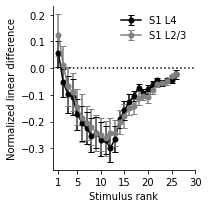

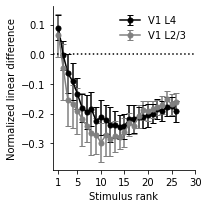

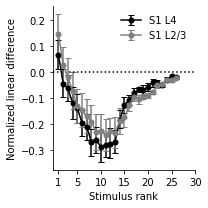

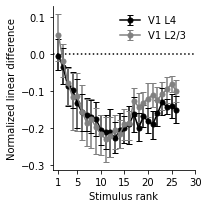

In [310]:
save = False
big_lin_subtracted_sorted = {}
# plt.figure()
colors = ['k',(0.5,0.5,0.5),'k',(0.5,0.5,0.5)]
for train_test_mode in ['halves','thirds']:
    big_lin_subtracted_sorted[train_test_mode] = [None for itype in range(4)]
    for itype in range(4):
        if np.remainder(itype,2)==0:
            plt.figure(figsize=(3,3))
        nrep = len(lin_subtractedses[train_test_mode][itype])
        big_lin_subtracted_sorted[train_test_mode][itype] = [None for irep in range(nrep)]
        for irep in range(nrep):

            big_lin_subtracted_sorted[train_test_mode][itype][irep] = np.zeros((0,1,26))
            lin_subtracted=lin_subtractedses[train_test_mode][itype][irep]
            expt_id = expt_idses[train_test_mode][itype][irep]
            sorteach=sorteachses[train_test_mode][itype][irep]
            sortind=sortindses[train_test_mode][itype][irep]

            na = utils.nubs_active[nf.evan_order_actual]
            lkat = (na.sum(1)>=0)[sorteach[:,0,0]]
            lin_subtracted=lin_subtracted[sortind[:,0]][lkat][:,:,nf.evan_order_actual]
            sorteach=sorteach[lkat]
            expt_id = expt_id[lkat]
            nexpt = int(expt_id.max()+1)
    #         sortind=sortind[lkat]
    #         lin_subtracted = lin_subtracted
    #         lin_subtracted = lin_subtracted[sortind[:,0]]

            lin_subtracted_sorted = np.zeros(lin_subtracted.shape[:2]+(26,))
            for iroi in range(lin_subtracted_sorted.shape[0]):
                se = sorteach[iroi,0]
                lin_subtracted_sorted[iroi] = lin_subtracted[iroi][:,se[utils.nubs_active[se].sum(1)>1]]
            for iexpt in range(nexpt):
                to_add = np.nanmean(lin_subtracted_sorted[expt_id==iexpt],0)[np.newaxis]
    #         plt.plot(np.arange(1,27),to_add[0][0])
                big_lin_subtracted_sorted[train_test_mode][itype][irep] = np.concatenate((big_lin_subtracted_sorted[train_test_mode][itype][irep],to_add),axis=0)
    #         big_lin_subtracted_sorted = np.concatenate((big_lin_subtracted_sorted,lin_subtracted_sorted.mean(0)[np.newaxis]),axis=0)
    #     big_lin_subtracted_sorted[itype] = np.nansum(big_lin_subtracted_sorted[itype],axis=0)/nexpt
        big_lin_subtracted_sorted[train_test_mode][itype] = np.nanmean(big_lin_subtracted_sorted[train_test_mode][itype],axis=0)
        lb,ub,mn = ut.bootstrap(big_lin_subtracted_sorted[train_test_mode][itype],axis=0,pct=(16,84,50),fn=np.nanmean)
    #     plt.plot(np.arange(1,27),mn[0])
    #     plt.fill_between(np.arange(1,27),lb[0],ub[0],alpha=0.5)
        plt.errorbar(np.arange(1,27),mn[0],yerr=np.concatenate((mn-lb,ub-mn),axis=0),fmt='.-',markersize=10,capsize=3,c=colors[itype])
    #     plt.legend(['S1 L4','S1 L2/3','V1 L4','V1 L2/3'])
        plt.ylabel('Normalized linear difference')
        plt.xlabel('Stimulus rank')
        plt.xticks((1,5,10,15,20,25,30))
        ut.erase_top_right()
        if np.remainder(itype,2)==1:
            if itype<2:
                plt.legend(['S1 L4','S1 L2/3'],frameon=False)
                plt.axhline(0,linestyle='dotted',c='k')
                if save:
                    plt.savefig('figures/norm_linear_difference_averaged_exptwise_incl_single_whisker_pref_sem_s1_%s.eps'%train_test_mode,dpi=300)
            else:
                plt.legend(['V1 L4','V1 L2/3'],frameon=False)
                plt.axhline(0,linestyle='dotted',c='k')
                if save:
                    plt.savefig('figures/norm_linear_difference_averaged_exptwise_incl_single_patch_pref_sem_v1_%s.eps'%train_test_mode,dpi=300)
        plt.tight_layout()

    # plt.plot((0,26),(0,0),linestyle='dotted',c='k')
    # plt.savefig('figures/norm_linear_difference_averaged_exptwise_sem.jpg',dpi=300)

In [311]:
### Figure out what the two entries on lkatses are

In [432]:
nrep

1

('halves', 0, 0, 94)
('halves', 0, 0, 66)
('halves', 0, 0, 94)
('halves', 0, 0, 96)
('halves', 0, 0, 242)
('halves', 0, 0, 158)
('halves', 1, 0, 549)
('halves', 1, 0, 223)
('halves', 1, 0, 472)
('halves', 2, 0, 610)
('halves', 2, 0, 203)
('halves', 2, 0, 161)
('halves', 2, 0, 101)
('halves', 2, 0, 143)
('halves', 3, 0, 325)
('halves', 3, 0, 365)
('halves', 3, 0, 313)
('halves', 3, 0, 401)
('thirds', 0, 0, 88)
('thirds', 0, 0, 62)
('thirds', 0, 0, 81)
('thirds', 0, 0, 85)
('thirds', 0, 0, 214)
('thirds', 0, 0, 139)
('thirds', 1, 0, 524)
('thirds', 1, 0, 211)
('thirds', 1, 0, 435)
('thirds', 2, 0, 541)
('thirds', 2, 0, 164)
('thirds', 2, 0, 116)
('thirds', 2, 0, 78)
('thirds', 2, 0, 108)
('thirds', 3, 0, 243)
('thirds', 3, 0, 264)
('thirds', 3, 0, 224)
('thirds', 3, 0, 264)


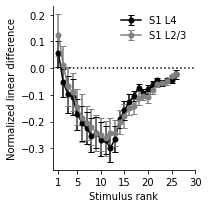

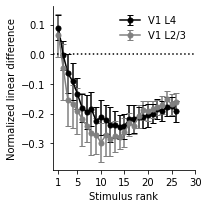

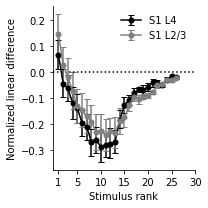

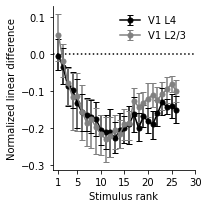

In [435]:
save = False
big_lin_subtracted_sorted = {}
lin_subtracted_sorteds,sorted_index,lin_subtracted_sorted_boundses = [{} for _ in range(3)]
lss_mean_top,lss_pval_top,lss_mean_all,lss_pval_all,lss_pval_top_v_all = [{} for _ in range(5)]
# plt.figure()
colors = ['k',(0.5,0.5,0.5),'k',(0.5,0.5,0.5)]
for train_test_mode in ['halves','thirds']:
    big_lin_subtracted_sorted[train_test_mode] = [None for itype in range(4)]
    lin_subtracted_sorteds[train_test_mode],sorted_index[train_test_mode],lin_subtracted_sorted_boundses[train_test_mode] \
        = [[None for itype in range(4)] for _ in range(3)]
    lss_mean_top[train_test_mode],lss_pval_top[train_test_mode],\
            lss_mean_all[train_test_mode],lss_pval_all[train_test_mode],lss_pval_top_v_all[train_test_mode] \
    = [[None for itype in range(4)] for _ in range(5)]
    for itype in range(4):
        if np.remainder(itype,2)==0:
            plt.figure(figsize=(3,3))
        nrep = len(lin_subtractedses[train_test_mode][itype])
#         npct = len(lin_subtracted_boundses[train_test_mode][itype][irep])
        npct = len(pct)
        big_lin_subtracted_sorted[train_test_mode][itype] = [None for irep in range(nrep)]
        lin_subtracted_sorteds[train_test_mode][itype],sorted_index[train_test_mode][itype] = [[None for irep in range(nrep)] for _ in range(2)]
        lin_subtracted_sorted_boundses[train_test_mode][itype] = [None for irep in range(nrep)]
        for irep in range(nrep):

            big_lin_subtracted_sorted[train_test_mode][itype][irep] = np.zeros((0,1,26))
            lin_subtracted=lin_subtractedses[train_test_mode][itype][irep]
            lin_subtracted_bounds=lin_subtracted_boundses[train_test_mode][itype][irep]
            expt_id = expt_idses[train_test_mode][itype][irep]
            sorteach=sorteachses[train_test_mode][itype][irep]
            sortind=sortindses[train_test_mode][itype][irep]

            na = utils.nubs_active[nf.evan_order_actual]
            lkat = (na.sum(1)>=2)[sorteach[:,0,0]]
            og_index = np.where(lkatses[train_test_mode][itype][irep][run_conditions[itype][0]])[0]#np.arange(lin_subtracted.shape[0])
            lin_subtracted = lin_subtracted[sortind[:,0]][lkat][:,:,nf.evan_order_actual]
            lin_subtracted_bounds = [lin_subtracted_bounds[ipct][sortind[:,0]][lkat][:,:,nf.evan_order_actual] for ipct in range(npct)]
            sorted_index[train_test_mode][itype][irep] = og_index[sortind[:,0]][lkat]
            sorteach=sorteach[lkat]
            expt_id = expt_id[lkat]
            nexpt = int(expt_id.max()+1)
    #         sortind=sortind[lkat]
    #         lin_subtracted = lin_subtracted
    #         lin_subtracted = lin_subtracted[sortind[:,0]]
            
            lin_subtracted_sorted = np.zeros(lin_subtracted.shape[:2]+(26,))
            lin_subtracted_sorted_bounds = [np.zeros(lin_subtracted.shape[:2]+(26,)) for ipct in range(npct)]
            for iroi in range(lin_subtracted_sorted.shape[0]):
                se = sorteach[iroi,0]
                multi_whisker = se[utils.nubs_active[se].sum(1)>1]
                lin_subtracted_sorted[iroi] = lin_subtracted[iroi][:,multi_whisker]
                for ipct in range(npct):
                    lin_subtracted_sorted_bounds[ipct][iroi] = lin_subtracted_bounds[ipct][iroi][:,multi_whisker]
            lss_mean_top[train_test_mode][itype],lss_pval_top[train_test_mode][itype],\
            lss_mean_all[train_test_mode][itype],lss_pval_all[train_test_mode][itype],lss_pval_top_v_all[train_test_mode][itype] = [np.nan*np.ones((nexpt,)) for _ in range(5)]
            for iexpt in range(nexpt):
                this_data = lin_subtracted_sorted[expt_id==iexpt]
                print((train_test_mode,itype,irep,(expt_id==iexpt).sum()))
                to_add = np.nanmean(this_data,0)[np.newaxis]
    #         plt.plot(np.arange(1,27),to_add[0][0])
                big_lin_subtracted_sorted[train_test_mode][itype][irep] = np.concatenate((big_lin_subtracted_sorted[train_test_mode][itype][irep],to_add),axis=0)
                if this_data.size:
                    lss_mean_top[train_test_mode][itype][iexpt] = np.nanmean(this_data[:,0,0])
                    lss_pval_top[train_test_mode][itype][iexpt] = sst.wilcoxon(this_data[:,0,0]).pvalue
                    lss_mean_all[train_test_mode][itype][iexpt] = np.nanmean(this_data[:,0,:])
                    lss_pval_all[train_test_mode][itype][iexpt] = sst.wilcoxon(this_data[:,0,:].flatten()).pvalue
                    lss_pval_top_v_all[train_test_mode][itype][iexpt] = sst.wilcoxon(this_data[:,0,0]-np.nanmean(this_data[:,0,1:],1)).pvalue
            lin_subtracted_sorteds[train_test_mode][itype][irep] = lin_subtracted_sorted
#             for ipct in range(npct):
            lin_subtracted_sorted_boundses[train_test_mode][itype][irep] \
                = [lin_subtracted_sorted_bounds[ipct] for ipct in range(npct)]
    #         big_lin_subtracted_sorted = np.concatenate((big_lin_subtracted_sorted,lin_subtracted_sorted.mean(0)[np.newaxis]),axis=0)
    #     big_lin_subtracted_sorted[itype] = np.nansum(big_lin_subtracted_sorted[itype],axis=0)/nexpt
        big_lin_subtracted_sorted[train_test_mode][itype] = np.nanmean(big_lin_subtracted_sorted[train_test_mode][itype],axis=0)
        lb,ub,mn = ut.bootstrap(big_lin_subtracted_sorted[train_test_mode][itype],axis=0,pct=(16,84,50),fn=np.nanmean)
    #     plt.plot(np.arange(1,27),mn[0])
    #     plt.fill_between(np.arange(1,27),lb[0],ub[0],alpha=0.5)
        plt.errorbar(np.arange(1,27),mn[0],yerr=np.concatenate((mn-lb,ub-mn),axis=0),fmt='.-',markersize=10,capsize=3,c=colors[itype])
    #     plt.legend(['S1 L4','S1 L2/3','V1 L4','V1 L2/3'])
        plt.ylabel('Normalized linear difference')
        plt.xlabel('Stimulus rank')
        plt.xticks((1,5,10,15,20,25,30))
        ut.erase_top_right()
        if np.remainder(itype,2)==1:
            if itype<2:
                plt.legend(['S1 L4','S1 L2/3'],frameon=False)
                plt.axhline(0,linestyle='dotted',c='k')
                if save:
                    plt.savefig('figures/norm_linear_difference_averaged_exptwise_excl_single_whisker_pref_sem_s1_%s.eps'%train_test_mode,dpi=300)
            else:
                plt.legend(['V1 L4','V1 L2/3'],frameon=False)
                plt.axhline(0,linestyle='dotted',c='k')
                if save:
                    plt.savefig('figures/norm_linear_difference_averaged_exptwise_excl_single_patch_pref_sem_v1_%s.eps'%train_test_mode,dpi=300)
        plt.tight_layout()

    # plt.plot((0,26),(0,0),linestyle='dotted',c='k')
    # plt.savefig('figures/norm_linear_difference_averaged_exptwise_sem.jpg',dpi=300)

In [430]:
train_test_mode = 'halves'
itype = 3
big_lin_subtracted_sorted[train_test_mode][itype][0]
# lin_subtracted_sorteds[train_test_mode][itype][irep][0]

array([[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]])

In [431]:
to_add

array([[[ 0.13175202,  0.13611017,  0.04732514,  0.07011165,
          0.01411072, -0.02805777,  0.02929063, -0.04524324,
         -0.05405216, -0.07266555, -0.08751324, -0.09317811,
         -0.08947716, -0.10737573, -0.07958747, -0.11955812,
         -0.0717974 , -0.09769064, -0.06923055, -0.03241555,
         -0.06480663, -0.05581591, -0.05280978, -0.0221145 ,
         -0.05653434, -0.07317819]]])

In [420]:
for iid in range(4):
    print(lin_subtractedses[train_test_mode][itype][irep][expt_idses[train_test_mode][itype][irep]==iid])


[[[ 0.          0.          0.         ... -1.22943239 -1.17204668
   -1.24440293]]

 [[ 0.          0.          0.         ... -0.7153787  -1.01059859
   -0.99268701]]

 [[ 0.          0.          0.         ... -0.72855337 -0.75853677
   -0.75853677]]

 ...

 [[ 0.          0.          0.         ... -0.01949942 -0.28903803
   -0.31726881]]

 [[ 0.          0.          0.         ...  0.72619515  0.21954775
    1.03991435]]

 [[ 0.          0.          0.         ... -0.06018914 -0.51107745
   -0.58351293]]]
[[[ 0.          0.          0.         ... -0.30601995 -0.10603067
    0.06304859]]

 [[ 0.          0.          0.         ... -0.93323421 -0.91503557
   -0.91875898]]

 [[ 0.          0.          0.         ... -0.42973627  0.31248401
   -0.52510796]]

 ...

 [[ 0.          0.          0.         ...  0.17476941  0.3399994
   -0.14348825]]

 [[ 0.          0.          0.         ...  0.19581788  0.25099984
    0.04203135]]

 [[ 0.          0.          0.         ... -0.14956324

In [421]:
lin_subtractedses[train_test_mode][itype][irep].shape

(1404, 1, 32)

In [365]:
lss_pval_top[train_test_mode][itype]

array([           nan, 8.78812054e-06, 1.50818347e-02, 2.50789295e-05])

In [439]:
def plot_lin_subtracted_pdfs(lin_subtracted_sorted):
    bins = np.linspace(-1.5,1.5,100)
    rgs = [slice(0,1),slice(1,None)]
    cs = ['r','b']
    for irg in range(len(rgs)):
        ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1),bins=bins,alpha=0.5,facecolor=cs[irg])
    ut.erase_top_right()
    plt.xlabel('Normalized linear difference')
    plt.ylabel('frac. of neurons')
    
def plot_lin_subtracted_pdfs_sig(lin_subtracted_sorted,sig=None,sig_above=False,sig_c='k'):
    bins = np.linspace(-1.5,1.5,100)
    rgs = [slice(0,1),slice(1,None)]
    cs = ['r','b']
#     sig_c = 'c'
    for irg in range(1):#len(rgs)):
        ut.bar_pdf_sig(np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1),
                       bins=bins,
                       alpha=0.5,
                       facecolor=cs[irg],
                       sig_facecolor=sig_c,
                       sig=sig,
#                        edgecolor='k',
                       sig_above=sig_above)
    for irg in range(1,2):#len(rgs)):
        ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1),
                       bins=bins,
                       alpha=0.5,
                       facecolor=cs[irg])
    ut.erase_top_right()
    plt.xlabel('Normalized linear difference')
    plt.ylabel('frac. of neurons')
    
def plot_lin_subtracted_pdfs_sig_comparison(lin_subtracted_sorted,lin_subtracted_sorted_bounds=None,sig_above=False,sig_c='k'):
    bins = np.linspace(-1.5,1.5,100)
    rgs = [slice(0,1),slice(1,None)]
    
    irg = 0
    bds_rg0 = [np.nanmean(lin_subtracted_sorted_bounds[ibd][:,rgs[irg]],axis=1) for ibd in range(2)]
    irg = 1
    val_rg1 = np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1)
    
    sig = ((bds_rg0[0] > val_rg1) | (bds_rg0[1] < val_rg1))
    
#     cs = ['r','b']
    cs = [np.array((1,0.5,0.5)),np.array((0,0,1))]
#     sig_c = 'c'
    for irg in range(1):#len(rgs)):
        ut.bar_pdf_sig(np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1),
                       bins=bins,
                       alpha=0.5,
                       facecolor=cs[irg],
                       sig_facecolor=sig_c,
                       sig=sig,
#                        edgecolor='k',
                       sig_above=sig_above)
    for irg in range(1,2):#len(rgs)):
        ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1),
                       bins=bins,
                       alpha=0.5,
                       facecolor=cs[irg])
    ut.erase_top_right()
    plt.xlabel('Normalized linear difference')
    plt.ylabel('frac. of neurons')
    
def scatter_lin_subtracted_sig_comparison(lin_subtracted_sorted,lin_subtracted_sorted_bounds=None,sig_above=False,sig_c='k',compare_to_zero=True,s=8,alpha=1):
    rgs = [slice(0,1),slice(1,None)]
    
    irg = 0
    bds_rg0 = [np.nanmean(lin_subtracted_sorted_bounds[ibd][:,rgs[irg]],axis=1) for ibd in range(2)]
    irg = 1
    val_rg1 = np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1)
    
    if compare_to_zero:
        sig_greater = (bds_rg0[0] > 0) 
        sig_less = (bds_rg0[1] < 0)
    else:
        sig_greater = (bds_rg0[0] > val_rg1)
        sig_less = (bds_rg0[1] < val_rg1)
    
    sig = sig_greater | sig_less
    
    ydata,xdata = [np.nanmean(lin_subtracted_sorted[:,rgs[irg]],axis=1) for irg in range(2)]
    cs = ['w','r','b']
    for isig,to_plot in enumerate([~sig,sig_greater,sig_less]):
        plt.scatter(xdata[to_plot],ydata[to_plot],c=cs[isig],s=s,edgecolor='k',linewidth=0.3,alpha=alpha)
        
        
    lim = 1.2    
    
    plt.plot((-lim,lim),(-lim,lim),c='k')
    plt.axhline(0,c='k',linestyle='dashed')
    plt.axvline(0,c='k',linestyle='dashed')
    plt.xlim((-lim,lim))
    plt.ylim((-lim,lim))
    
    ut.erase_top_right()
    plt.xlabel('Norm. linear difference, \n non-top-ranked')
    plt.ylabel('Norm. linear difference, \n top-ranked')

In [345]:
lin_subtracted_sorted_bounds[0].shape

(685, 26)

(78, 39, 685)
(192, 23, 642)
(86, 35, 1037)
(63, 36, 976)
(71, 40, 1052)
(164, 47, 571)
(60, 77, 966)
(63, 80, 810)


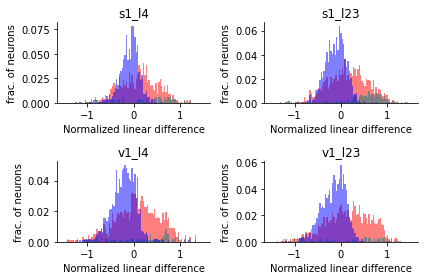

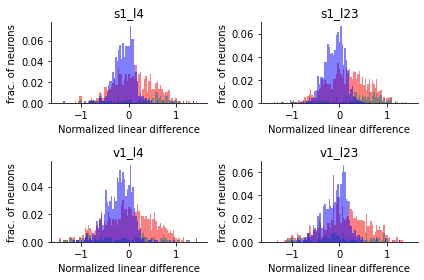

In [348]:
# should be more lenient percentile cutoffs
reload(ut)
for train_test_mode in ['halves','thirds']:
    irep = 0
    plt.figure()
    for itype in range(4):
        plt.subplot(2,2,itype+1)
        bins = np.linspace(-1.5,1.5,100)
        lin_subtracted_sorted = lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]
        lin_subtracted_sorted_bounds = [lin_subtracted_sorted_boundses[train_test_mode][itype][irep][ipct][:,0,:] for ipct in range(npct)]
#         sig_nonzero = ((lin_subtracted_sorted_bounds[0] > 0) | (lin_subtracted_sorted_bounds[1] < 0))
#         plot_lin_subtracted_pdfs_sig(lin_subtracted_sorted,sig=np.logical_and(sig_nonzero[:,0],True),sig_above=False,sig_c='k')#sig_c='k')
        sig_above = (lin_subtracted_sorted_bounds[0][:,0] > np.mean(lin_subtracted_sorted[:,1:],axis=1))
        sig_below = (lin_subtracted_sorted_bounds[1][:,0] < np.mean(lin_subtracted_sorted[:,1:],axis=1))
        print((sig_above.sum(),sig_below.sum(),sig.shape[0]))
        sig = sig_above | sig_below
        plot_lin_subtracted_pdfs_sig(lin_subtracted_sorted,sig=np.logical_and(sig,True),sig_above=False,sig_c='k')#sig_c='k')
#     # for irank in range(3):
#     #     plt.hist(lin_subtracted_sorted[:,0,irank],bins=bins,alpha=0.5)
# #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
# #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
#     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
#     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
#     ut.erase_top_right()
#     plt.xlabel('Normalized linear difference')
#     plt.ylabel('# of neurons')
        plt.title(lbls[itype])
#     plt.legend(['top-ranked stimulus','all other stimuli'])
    plt.tight_layout()
    plt.savefig('figures/norm_linear_difference_excl_single_patch_pref_hist_four_celltypes_%s.jpg'%train_test_mode,dpi=300)

/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
/opt/anaconda3/envs/py3/lib/python3.6/site-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matc

[           nan 4.74869396e-09 2.47668964e-03 9.01820286e-09
 2.55210418e-13 2.32643726e-06]
[2.41271227e-25 5.05756058e-27 4.50452378e-46]
[6.49328749e-37 1.64225785e-23 1.33514288e-10 2.32561321e-07
 2.98654775e-10]
[           nan 5.19713033e-37 9.39646096e-35 9.66588067e-24]
[           nan 8.35343344e-10 4.46345908e-02 5.32929297e-08
 5.92941642e-07 8.29839712e-07]
[3.21364725e-25 7.66897603e-27 3.85758898e-30]
[2.36990673e-16 3.48446057e-06 2.32735508e-04 1.94464024e-01
 1.52590243e-05]
[           nan 1.51099901e-12 6.80061978e-12 6.13000174e-10]


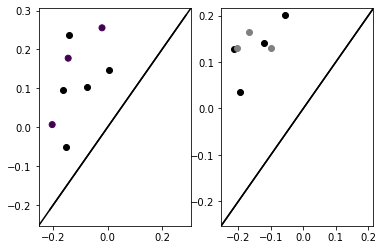

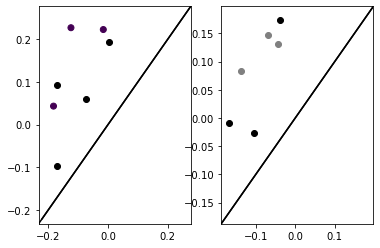

In [374]:
rgs = [slice(0,1),slice(1,None)]
cs = [np.array((0,0,0)),np.array((0.5,0.5,0.5))]
for train_test_mode in ['halves','thirds']:
    plt.figure()
    eps = 0.05
    for itype in range(4):
        plt.subplot(1,2,itype // 2+1)
        ydata,xdata = [np.nanmean(big_lin_subtracted_sorted[train_test_mode][itype][:,0,rg],axis=1) for rg in rgs]
        plt.scatter(xdata,ydata,c=cs[itype % 2])
        xlim = (np.nanmin(xdata),np.nanmax(xdata))
        ylim = (np.nanmin(ydata),np.nanmax(ydata))
        lim = (np.minimum(xlim[0],ylim[0])-eps,np.maximum(xlim[1],ylim[1])+eps)
        plt.plot(lim,lim,c='k')
        plt.xlim(lim)
        plt.ylim(lim)
#         plt.xlabel
        print(lss_pval_top_v_all[train_test_mode][itype])

In [364]:
big_lin_subtracted_sorted['thirds'][itype][0]

array([[nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]])

In [360]:
for itype in range(4):
    print(big_lin_subtracted_sorted[train_test_mode][itype].shape)

(6, 1, 26)
(3, 1, 26)
(5, 1, 26)
(4, 1, 26)


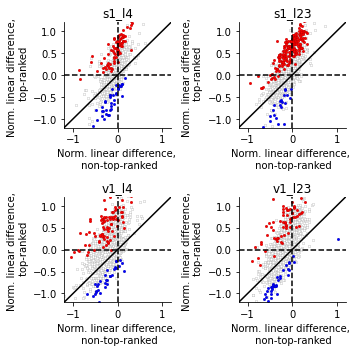

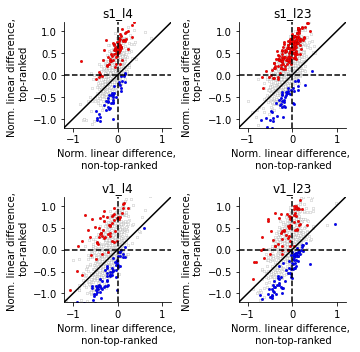

In [341]:
# should be more lenient percentile cutoffs
reload(ut)
for train_test_mode in ['halves','thirds']:
    irep = 0
    plt.figure(figsize=(5,5))
    for itype in range(4):
        plt.subplot(2,2,itype+1)
        bins = np.linspace(-1.5,1.5,100)
        lin_subtracted_sorted = lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]
        lin_subtracted_sorted_bounds = [lin_subtracted_sorted_boundses[train_test_mode][itype][irep][ipct][:,0,:] for ipct in range(npct)]
        scatter_lin_subtracted_sig_comparison(lin_subtracted_sorted,
                                                lin_subtracted_sorted_bounds=lin_subtracted_sorted_bounds,
                                                sig_above=False,
                                                sig_c='k',
                                                compare_to_zero=False
                                             )
#     # for irank in range(3):
#     #     plt.hist(lin_subtracted_sorted[:,0,irank],bins=bins,alpha=0.5)
# #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
# #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
#     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
#     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
#     ut.erase_top_right()
#     plt.xlabel('Normalized linear difference')
#     plt.ylabel('# of neurons')
        plt.title(lbls[itype])
#     plt.legend(['top-ranked stimulus','all other stimuli'])
    plt.tight_layout()
    plt.savefig('figures/norm_linear_difference_excl_single_patch_pref_scatter_four_celltypes_%s.eps'%train_test_mode,dpi=300)

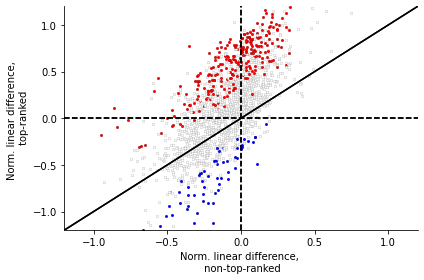

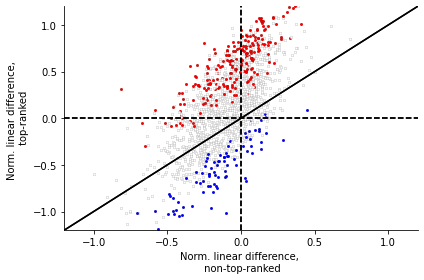

In [324]:
# should be more lenient percentile cutoffs
reload(ut)
for train_test_mode in ['halves','thirds']:
    irep = 0
    plt.figure()#figsize=(5,5))
    for itype in range(2):
#         plt.subplot(2,2,itype+1)
        bins = np.linspace(-1.5,1.5,100)
        lin_subtracted_sorted = lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]
        lin_subtracted_sorted_bounds = [lin_subtracted_sorted_boundses[train_test_mode][itype][irep][ipct][:,0,:] for ipct in range(npct)]
        scatter_lin_subtracted_sig_comparison(lin_subtracted_sorted,
                                                lin_subtracted_sorted_bounds=lin_subtracted_sorted_bounds,
                                                sig_above=False,
                                                sig_c='k',
                                                compare_to_zero=False
                                             )
    plt.tight_layout()
    plt.savefig('figures/norm_linear_difference_excl_single_patch_pref_scatter_s1_%s.eps'%train_test_mode,dpi=300)

[1.36569347e-04 2.20871693e-11 2.47668964e-03 9.01820286e-09
 2.55210418e-13 2.32643726e-06]
[6.40546345e-34 5.05756058e-27 4.50452378e-46]
[1.36569347e-04 2.20871693e-11 2.47668964e-03 9.01820286e-09
 2.55210418e-13 2.32643726e-06]
[6.40546345e-34 5.05756058e-27 4.50452378e-46]
[5.93889360e-05 2.09735267e-11 4.46345908e-02 5.32929297e-08
 5.92941642e-07 8.29839712e-07]
[2.62516600e-36 7.66897603e-27 3.85758898e-30]
[5.93889360e-05 2.09735267e-11 4.46345908e-02 5.32929297e-08
 5.92941642e-07 8.29839712e-07]
[2.62516600e-36 7.66897603e-27 3.85758898e-30]


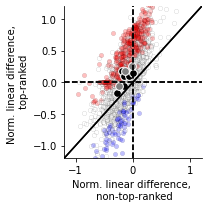

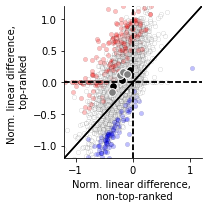

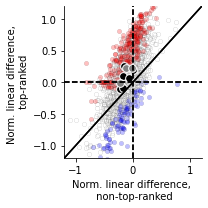

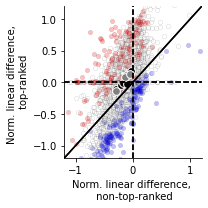

In [440]:
# should be more lenient percentile cutoffs

rgs = [slice(0,1),slice(1,None)]
cs = [np.array((0,0,0)),np.array((0.5,0.5,0.5))]

s = 20

area_lbls = ['s1','v1']

reload(ut)
for train_test_mode in ['halves','thirds']:
    for iarea in range(2):
        irep = 0
        plt.figure(figsize=(3,3))#figsize=(5,5))
        for itype in range(2):
    #         plt.subplot(2,2,itype+1)
            bins = np.linspace(-1.5,1.5,100)
            lin_subtracted_sorted = lin_subtracted_sorteds[train_test_mode][2*iarea + itype][irep][:,0,:]
            lin_subtracted_sorted_bounds = [lin_subtracted_sorted_boundses[train_test_mode][2*iarea + itype][irep][ipct][:,0,:] for ipct in range(npct)]
            scatter_lin_subtracted_sig_comparison(lin_subtracted_sorted,
                                                    lin_subtracted_sorted_bounds=lin_subtracted_sorted_bounds,
                                                    sig_above=False,
                                                    sig_c='k',
                                                    compare_to_zero=False,s=s,alpha=0.25
                                                 )
        for itype in range(2): 
            ydata,xdata = [np.nanmean(big_lin_subtracted_sorted[train_test_mode][2*iarea + itype][:,0,rg],axis=1) for rg in rgs]
            plt.scatter(xdata,ydata,s=3*s,c=np.array(cs[itype % 2])[np.newaxis],edgecolor='w')
    #         print(cs[itype % 2])
            print(lss_pval_top_v_all[train_test_mode][itype])

        plt.tight_layout()
        plt.savefig('figures/norm_linear_difference_excl_single_patch_pref_scatter_%s_%s.jpg'%(area_lbls[iarea],train_test_mode),dpi=300)


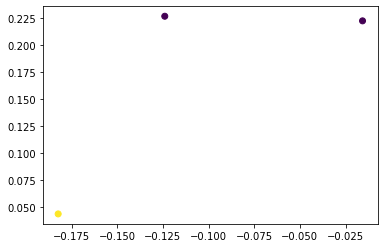

In [391]:
plt.scatter(xdata,ydata,c=cs[itype % 2])

In [392]:
cs[itype % 2]

array([1, 0, 0])

In [283]:
# # should be the most lenient percentile cutoffs
# reload(ut)
# for train_test_mode in ['halves','thirds']:
#     irep = 0
#     plt.figure()
#     for itype in range(4):
#         plt.subplot(2,2,itype+1)
#         bins = np.linspace(-1.5,1.5,100)
#         lin_subtracted_sorted = lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]
#         lin_subtracted_sorted_bounds = [lin_subtracted_sorted_boundses[train_test_mode][itype][irep][ipct][:,0,:] for ipct in range(npct)]
#         sig_nonzero = ((lin_subtracted_sorted_bounds[0] > 0) | (lin_subtracted_sorted_bounds[1] < 0))
#         plot_lin_subtracted_pdfs_sig(lin_subtracted_sorted,sig=sig_nonzero[:,0],sig_above=False)
# #     # for irank in range(3):
# #     #     plt.hist(lin_subtracted_sorted[:,0,irank],bins=bins,alpha=0.5)
# # #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
# # #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
# #     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
# #     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
# #     ut.erase_top_right()
# #     plt.xlabel('Normalized linear difference')
# #     plt.ylabel('# of neurons')
#         plt.title(lbls[itype])
# #     plt.legend(['top-ranked stimulus','all other stimuli'])
#     plt.tight_layout()

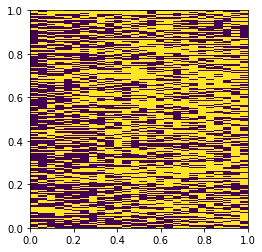

In [178]:
plt.figure()
plt.imshow(sig_nonzero,extent=[0,1,0,1],interpolation='nearest')

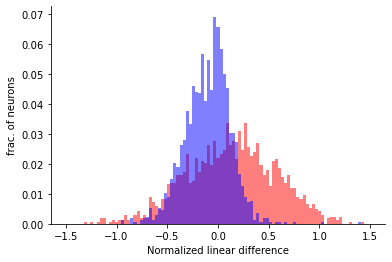

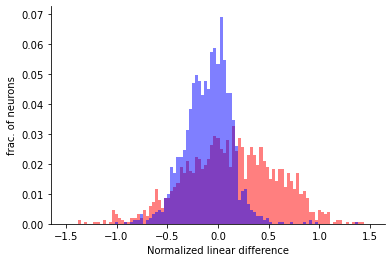

In [16]:
for train_test_mode in ['halves','thirds']:
    irep = 0
    plt.figure()
#     plt.subplot(2,2,itype+1)
    bins = np.linspace(-1.5,1.5,100)
    itype = 0
    lin_subtracted_sorted = lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]
    itype = 1
    lin_subtracted_sorted = np.concatenate((lin_subtracted_sorted,lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]),axis=0)
    plot_lin_subtracted_pdfs(lin_subtracted_sorted)
    plt.savefig('figures/s1_exptl_linear_difference_hists_%s.jpg'%train_test_mode,dpi=300)
# #     # for irank in range(3):
# #     #     plt.hist(lin_subtracted_sorted[:,0,irank],bins=bins,alpha=0.5)
# # #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
# # #     plt.hist(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
# #     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,0:1],axis=1),bins=bins,alpha=0.5,facecolor='r')
# #     ut.bar_pdf(np.nanmean(lin_subtracted_sorted[:,0,1:],axis=1),bins=bins,alpha=0.5,facecolor='b')
# #     ut.erase_top_right()
# #     plt.xlabel('Normalized linear difference')
# #     plt.ylabel('# of neurons')
#     plt.title(lbls[itype])
# #     plt.legend(['top-ranked stimulus','all other stimuli'])
# plt.tight_layout()

In [248]:
for train_test_mode in ['halves','thirds']:
    irep = 0
    plt.figure()
#     plt.subplot(2,2,itype+1)
    bins = np.linspace(-1.5,1.5,100)
    itype = 0
    lin_subtracted_sorted = lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]
    itype = 1
    lin_subtracted_sorted = np.concatenate((lin_subtracted_sorted,lin_subtracted_sorteds[train_test_mode][itype][irep][:,0,:]),axis=0)
    lin_subtracted_sorted_bounds = [lin_subtracted_sorted_boundses[train_test_mode][itype][irep][ipct][:,0,:] for ipct in range(npct)]
    sig_nonzero = ((lin_subtracted_sorted_bounds[0] > 0) | (lin_subtracted_sorted_bounds[1] < 0))
    plot_lin_subtracted_pdfs_sig(lin_subtracted_sorted,sig=sig_nonzero[:,0],sig_above=False)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 1679 but corresponding boolean dimension is 1037

<Figure size 432x288 with 0 Axes>

In [77]:
pval_cutoff = 0.05
for train_test_mode in ['halves']:
#     print('top:')
    for itype in range(4):
#         print('mean: '+str(lss_mean_top[train_test_mode][itype]))
#         print('pval: '+str(lss_pval_top[train_test_mode][itype]))
        greater_0 = np.sum((lss_mean_top[train_test_mode][itype]>0) & (lss_pval_top[train_test_mode][itype]<pval_cutoff))
        non_nan = np.sum(~np.isnan(lss_mean_top[train_test_mode][itype]))
        print('%s top stim: %d/%d imaging sessions > 0'%(lbls[itype],greater_0,non_nan))
#     print('all:')
    for itype in range(4):
#         print('mean: '+str(lss_mean_all[train_test_mode][itype]))
#         print('pval: '+str(lss_pval_all[train_test_mode][itype]))
        less_0 = np.sum((lss_mean_all[train_test_mode][itype]<0) & (lss_pval_all[train_test_mode][itype]<pval_cutoff))
        non_nan = np.sum(~np.isnan(lss_mean_all[train_test_mode][itype]))
        print('%s all stims: %d/%d imaging sessions < 0'%(lbls[itype],less_0,non_nan))

s1_l4 top stim: 2/5 imaging sessions > 0
s1_l23 top stim: 3/3 imaging sessions > 0
v1_l4 top stim: 4/5 imaging sessions > 0
v1_l23 top stim: 3/3 imaging sessions > 0
s1_l4 all stims: 5/5 imaging sessions < 0
s1_l23 all stims: 3/3 imaging sessions < 0
v1_l4 all stims: 5/5 imaging sessions < 0
v1_l23 all stims: 3/3 imaging sessions < 0


In [47]:
lin_subtracted_sorted.shape

(1140, 1, 26)

In [38]:
big_lin_subtracted_sorted[train_test_mode][itype][:,0,0]

array([0.51729208, 0.08503826, 0.08947129, 0.23956961])

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']


<IPython.core.display.Javascript object>


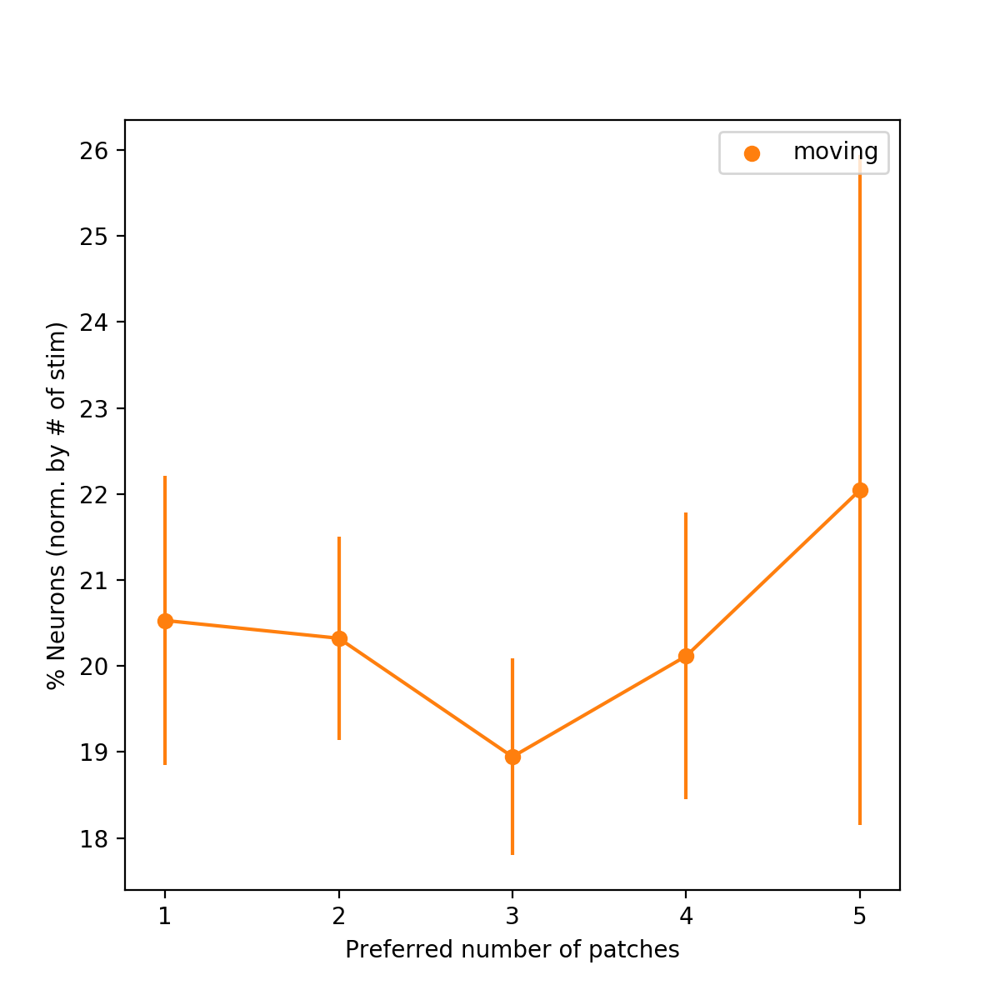

[20.52888889 20.32222222 18.94444444 20.11555556 22.04444444]
<HDF5 group "/session_evan_6994_210" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7120_250" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7142_220" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7197_160" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']


<IPython.core.display.Javascript object>


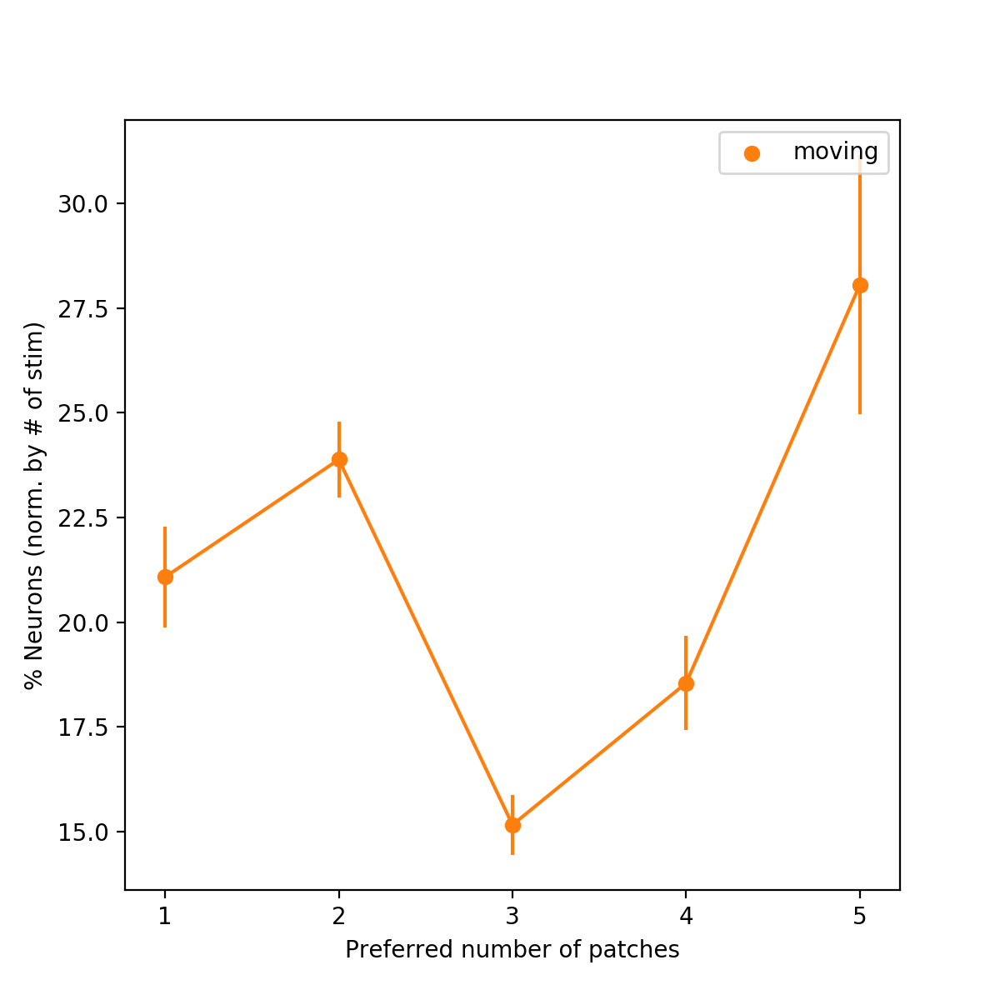

[21.07726269 23.88300221 15.15783664 18.54525386 28.05739514]
<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']


<IPython.core.display.Javascript object>


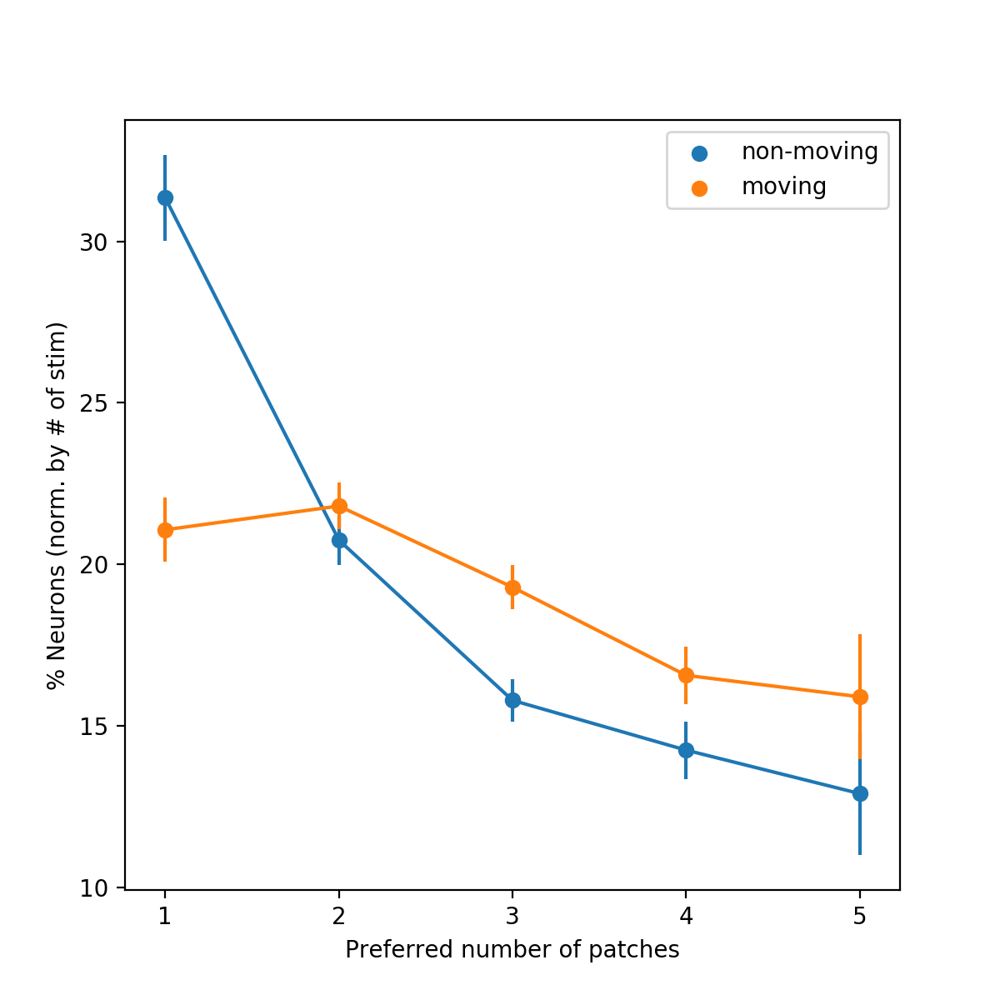

[31.35052013 20.7507915  15.7874265  14.24513795 12.89914066]
[21.07003444 21.80558745 19.29047072 16.56180635 15.8974359 ]
<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotop

<IPython.core.display.Javascript object>


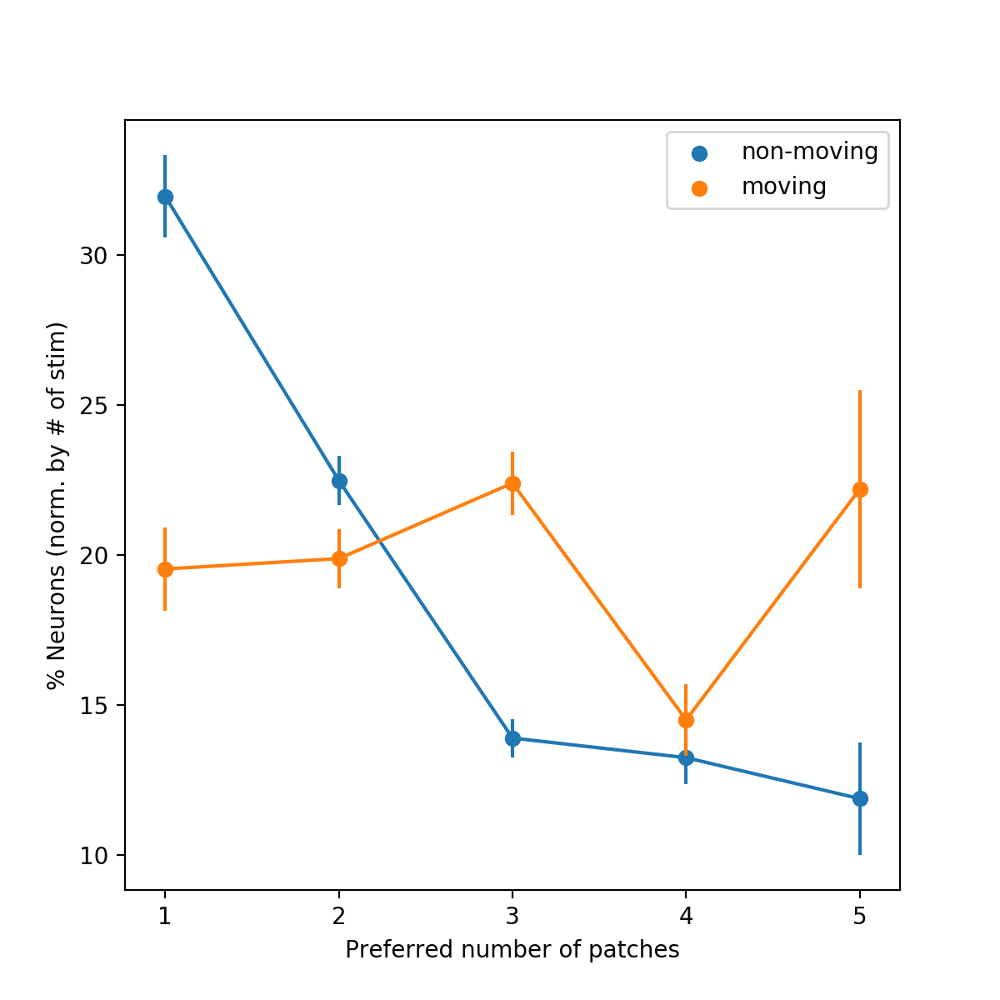

[31.95019157 22.47796935 13.89655172 13.24329502 11.87739464]
[19.53221957 19.87748608 22.3929992  14.50119332 22.19570406]


In [37]:
import nub_figures as nf
reload(nf)
reload(utils)
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
run_conditions = [[1],[1],[0,1],[0,1]]
for dsname,lbl,sel,keylist,datafield,run_condition in zip(dsnames,lbls,gen_nub_selector,keylists,datafields,run_conditions):
# tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
    nf.plot_patch_no_pref('figures/nub_experienced_patch_no_pref_moving_nonmoving_'+lbl+'.jpg',dsname,keylist,gen_nub_selector=sel,datafield=datafield,run_conditions=run_condition,dfof_cutoff=None)#0.2)

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_dept

<IPython.core.display.Javascript object>


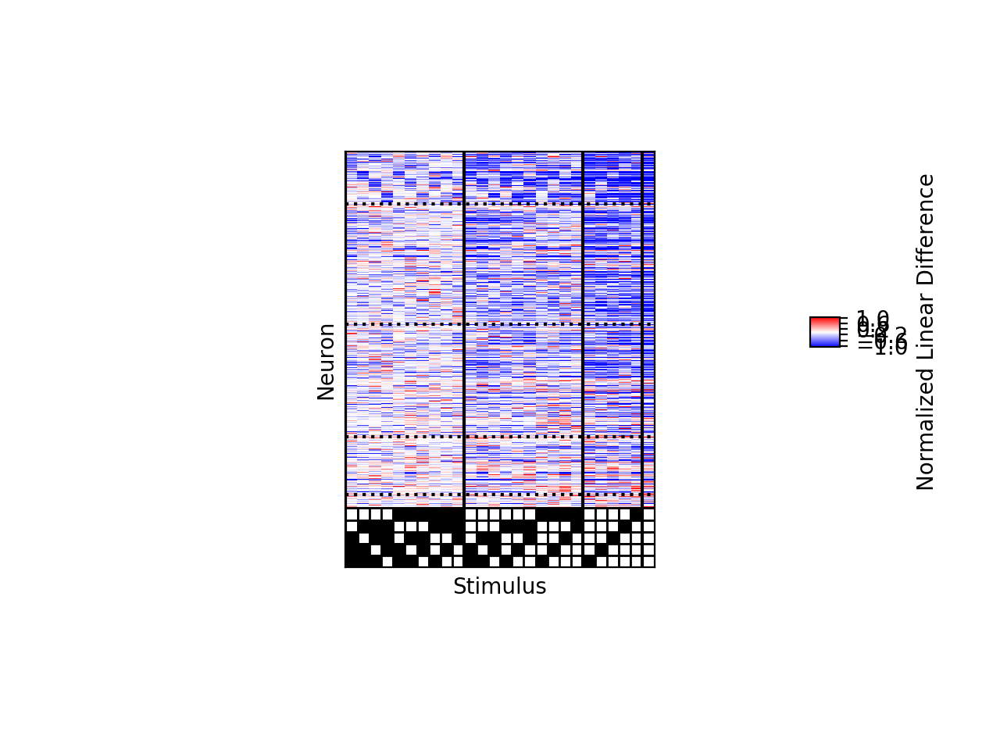

/Users/dan/Documents/notebooks/mossing-PC/nubulator/nub_figures.py:340: UserWarning: Use the colorbar set_ticks() method instead.
  cb.set_label('Normalized Linear Difference')
/Users/dan/Documents/notebooks/mossing-PC/nubulator/nub_figures.py:349: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  


<IPython.core.display.Javascript object>


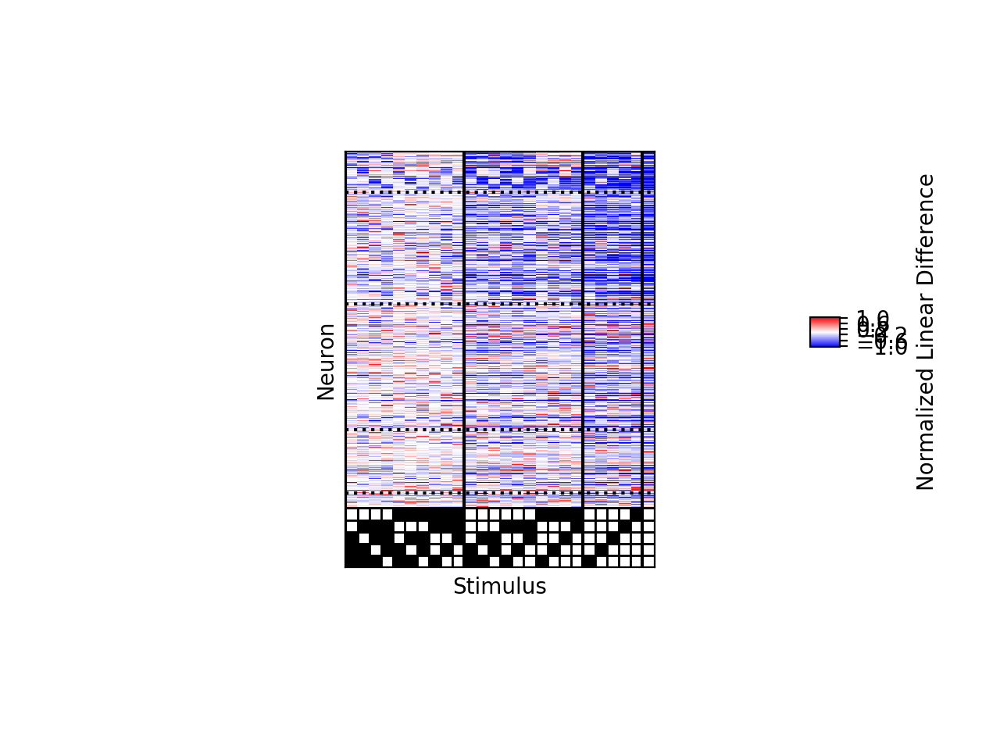

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (11 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_chann

<IPython.core.display.Javascript object>


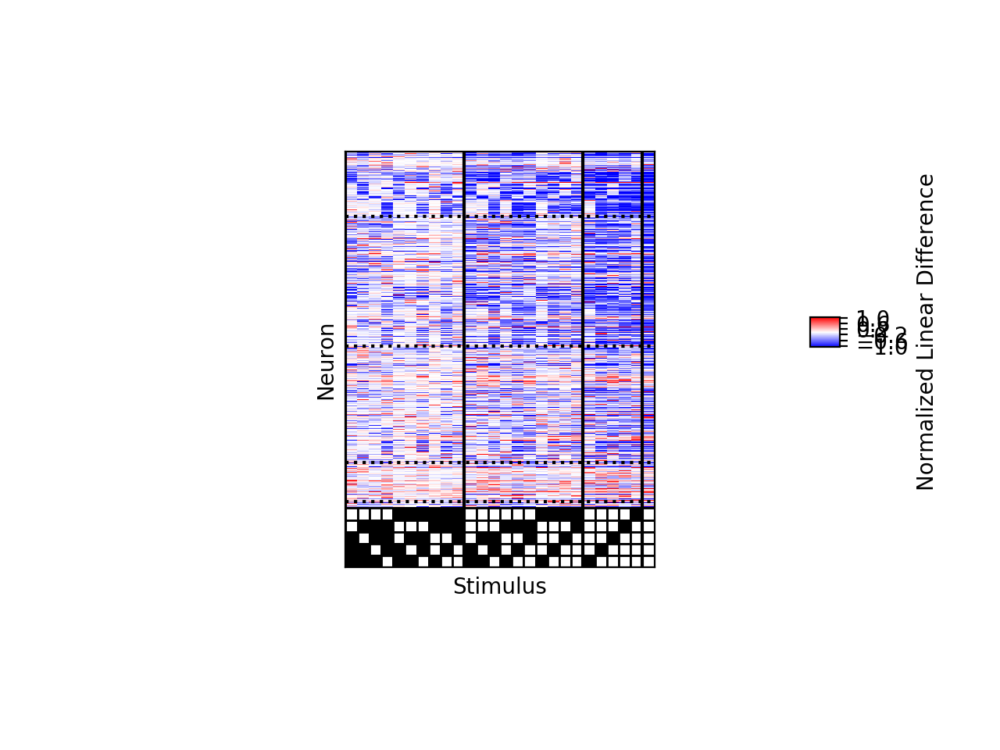

<IPython.core.display.Javascript object>


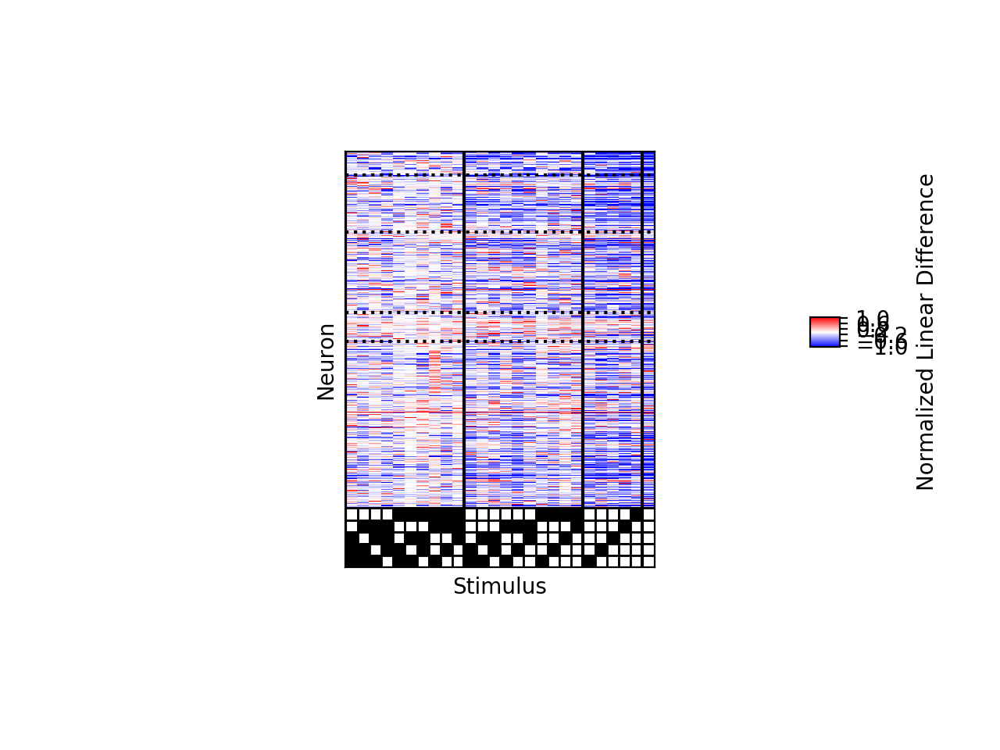

In [30]:
import nub_figures as nf
reload(nf)
reload(utils)
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
run_conditions = [[1],[1],[0,1],[0,1]]
for dsname,lbl,sel,keylist,datafield,run_condition in zip(dsnames[2:],lbls[2:],gen_nub_selector[2:],keylists[2:],datafields[2:],run_conditions[2:]):
# tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
    nf.plot_lin_subtracted(['figures/nub_experienced_non_moving_tuning_curves_'+lbl+'.jpg','figures/nub_experienced_moving_tuning_curves_'+lbl+'.jpg'],dsname,keylist,gen_nub_selector=sel,datafield=datafield,dfof_cutoff=1e-2,run_conditions=run_condition)

# import nub_figures as nf
# reload(nf)
# reload(utils)
# gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
# keylists = [None,None,None,experienced_expts]
# datafields = ['F','F','decon','decon']
# for dsname,lbl,sel,keylist,datafield in zip(dsnames[-2:],lbls[-2:],gen_nub_selector[-2:],keylists,datafields[-2:]):
# # tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
#     nf.plot_lin_subtracted(['figures/nub_experienced_non_moving_lin_subtracted_'+lbl+'.jpg','figures/nub_experienced_moving_lin_subtracted_'+lbl+'.jpg'],dsname,keylist,gen_nub_selector=sel,datafield=datafield)
    

In [27]:
pdb.pm()

> /Users/dan/Documents/notebooks/mossing-PC/nubulator/nub_figures.py(153)plot_patch_no_pref_()
-> pref_no = nub_no[sorteach[lkat,0]]
(Pdb) len(sorteach
*** SyntaxError: unexpected EOF while parsing
(Pdb) len(sorteach)
901
(Pdb) exit


In [48]:
reload(nf)
tunings = nf.compute_tunings(dsname,keylist,datafield,nf.move_fn,gen_nub_selector=gen_nub_selector)

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

AttributeError: 'list' object has no attribute 'keys'

In [7]:
import nub_figures as nf
reload(nf)
reload(utils)
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
for dsname,lbl,sel,keylist,datafield in zip(dsnames,lbls,gen_nub_selector,keylists,datafields):
# tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
    nf.plot_sorted_lin_subtracted(['figures/nub_experienced_non_moving_sorted_lin_subtracted_'+lbl+'.jpg','figures/nub_experienced_moving_sorted_lin_subtracted_'+lbl+'.jpg'],dsname,keylist,gen_nub_selector=sel,datafield=datafield)
    

<HDF5 group "/session_evan_7734_308" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7734_338" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_265" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7736_300" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_291" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']
<HDF5 group "/session_evan_7737_326" (6 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_type', 'mouse_id', 'nub_0']


KeyError: 0

In [6]:
import nub_figures as nf
reload(nf)
reload(utils)
gen_nub_selector = [utils.gen_nub_selector_s1,utils.gen_nub_selector_s1,utils.gen_nub_selector_v1,utils.gen_nub_selector_v1]#_all_sizes
keylists = [None,None,None,experienced_expts]
datafields = ['F','F','decon','decon']
for dsname,lbl,sel,keylist,datafield in zip(dsnames[2:],lbls[2:],gen_nub_selector[2:],keylists[2:],datafields[2:]):
# tuning = nf.compute_tuning(dsname,keylist,'decon',nf.move_fn,gen_nub_selector=gen_nub_selector)
    bounds = nf.compute_bounds(dsname,keylist,gen_nub_selector=sel,datafield=datafield)
    

<HDF5 group "/session_190827_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10616" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190827_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190829_M10077" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_190830_M10619" (8 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'm

In [128]:
bounds

NameError: name 'bounds' is not defined

In [22]:
scale = 0.5


def plot_example_tuning_curves_(bounds,selected_expts,selected_rois,scale=1):
    iiroi = 0
    nroi = len(selected_rois)
    plt.figure(figsize=(10*scale,5*scale))
    these_numbers_of_patches = [np.arange(1,6), np.arange(6,16), np.arange(16,26), np.arange(26,31), np.array((31,))]
    for iexpt,iroi in zip(selected_expts,selected_rois):#
        plt.subplot(nroi,1,iiroi+1)
        yerr_down = bounds[irun][iexpt][2][iroi][nf.evan_order_actual]-bounds[irun][iexpt][0][iroi][nf.evan_order_actual]
        yerr_up = bounds[irun][iexpt][1][iroi][nf.evan_order_actual]-bounds[irun][iexpt][2][iroi][nf.evan_order_actual]
        yerr = np.concatenate((yerr_down[np.newaxis],yerr_up[np.newaxis]),axis=0)
        for itn,tn in enumerate(these_numbers_of_patches):
        # plt.fill_between(np.arange(32),bounds[0][0][0][iroi][nf.evan_order_actual],bounds[0][0][1][iroi][nf.evan_order_actual])
            plt.errorbar(tn,bounds[irun][iexpt][2][iroi][nf.evan_order_actual][tn],c=nf.parula(itn/5),yerr=yerr[:,tn],capsize=2,fmt='.')
        plt.plot(np.arange(32),np.zeros((32,)),linestyle='dashed',c='k')
        plt.ylim((0,0.4))
        plt.axis('off')
        iiroi = iiroi+1

# plt.savefig('figures/example_neurons.jpg',dpi=300)

In [58]:
scale = 0.5

def plot_example_mean_normalized_tuning_curves_(bounds,selected_expts,selected_rois,scale=1):
    iiroi = 0
    nroi = len(selected_rois)
    plt.figure(figsize=(10*scale,5*scale))
    these_numbers_of_patches = [np.arange(1,6), np.arange(6,16), np.arange(16,26), np.arange(26,31), np.array((31,))]
    for iexpt,iroi in zip(selected_expts,selected_rois):#
        plt.subplot(nroi,1,iiroi+1)
        yerr_down = bounds[irun][iexpt][2][iroi][nf.evan_order_actual]-bounds[irun][iexpt][0][iroi][nf.evan_order_actual]
        yerr_up = bounds[irun][iexpt][1][iroi][nf.evan_order_actual]-bounds[irun][iexpt][2][iroi][nf.evan_order_actual]
        yerr = np.concatenate((yerr_down[np.newaxis],yerr_up[np.newaxis]),axis=0)
        mn = np.mean(bounds[irun][iexpt][2][iroi][nf.evan_order_actual])
        for itn,tn in enumerate(these_numbers_of_patches):
        # plt.fill_between(np.arange(32),bounds[0][0][0][iroi][nf.evan_order_actual],bounds[0][0][1][iroi][nf.evan_order_actual])
            plt.errorbar(tn,bounds[irun][iexpt][2][iroi][nf.evan_order_actual][tn]/mn,c=nf.parula(itn/5),yerr=yerr[:,tn]/mn,capsize=2,fmt='.')
        plt.plot(np.arange(32),np.zeros((32,)),linestyle='dashed',c='k')
        plt.ylim((0,10))
        plt.axis('off')
        iiroi = iiroi+1

# plt.savefig('figures/example_neurons.jpg',dpi=300)

In [49]:
scale = 0.5

def plot_100_example_tuning_curves_(bounds,selected_expt,selected_rois,scale=1):
    iiroi = 0
    nroi = len(selected_rois)
    plt.figure(figsize=(10*scale,5*scale))
    iexpt = selected_expt
    these_numbers_of_patches = [np.arange(1,6), np.arange(6,16), np.arange(16,26), np.arange(26,31), np.array((31,))]
    for iiroi,iroi in enumerate(selected_rois):#
        plt.subplot(10,10,iiroi+1)
        yerr_down = bounds[irun][iexpt][2][iroi][nf.evan_order_actual]-bounds[irun][iexpt][0][iroi][nf.evan_order_actual]
        yerr_up = bounds[irun][iexpt][1][iroi][nf.evan_order_actual]-bounds[irun][iexpt][2][iroi][nf.evan_order_actual]
        yerr = np.concatenate((yerr_down[np.newaxis],yerr_up[np.newaxis]),axis=0)
        for itn,tn in enumerate(these_numbers_of_patches):
        # plt.fill_between(np.arange(32),bounds[0][0][0][iroi][nf.evan_order_actual],bounds[0][0][1][iroi][nf.evan_order_actual])
            plt.errorbar(tn,bounds[irun][iexpt][2][iroi][nf.evan_order_actual][tn],c=nf.parula(itn/5),yerr=yerr[:,tn],capsize=2,fmt='.')
        plt.plot(np.arange(32),np.zeros((32,)),linestyle='dashed',c='k')
        plt.ylim((0,0.4))
        plt.axis('off')

# plt.savefig('figures/example_neurons.jpg',dpi=300)

In [50]:
#selected_expts = [0,1,2,3,4]
#selected_rois = [34,21,31,37,91]

x = 1
y = 367
selected_expts = [1,1,3,0,4]
selected_rois = [21,367,37,34,91]

<IPython.core.display.Javascript object>


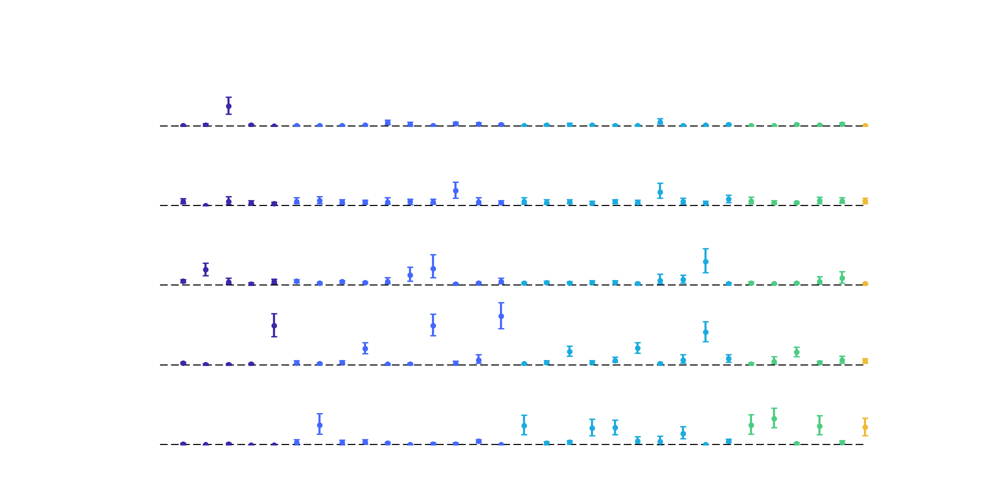

In [60]:
plot_example_tuning_curves_(bounds,selected_expts,selected_rois,scale=1)

<IPython.core.display.Javascript object>


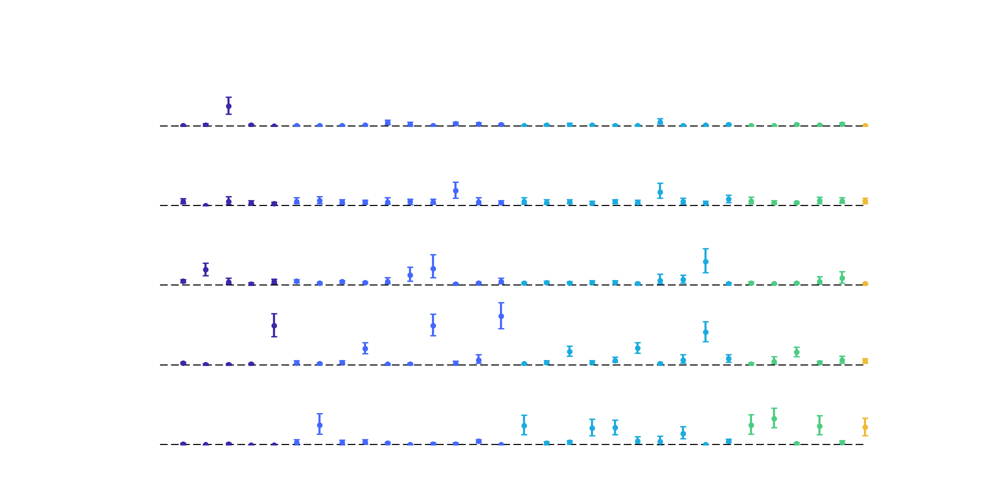

In [47]:
plot_example_tuning_curves_(bounds,selected_expts,selected_rois,scale=1)

<IPython.core.display.Javascript object>


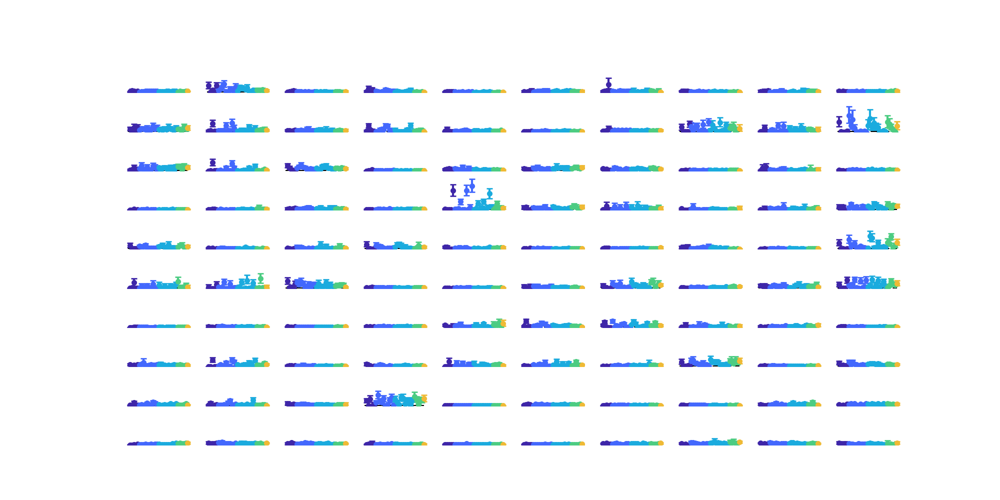

In [41]:
plot_100_example_tuning_curves_(bounds,0,np.arange(0,100),scale=1)

In [140]:
def plot_example_tuning_curves(target,dsname,keylist=None,datafield='decon',gen_nub_selector=utils.gen_nub_selector_v1):
    bounds = nf.compute_bounds(dsname,keylist,gen_nub_selector=gen_nub_selector,datafield=datafield)
    plt.savefig(target,dpi=300)
def plot_example_tuning_curves_faster(target,dsname,keylist=None,datafield='decon',gen_nub_selector=utils.gen_nub_selector_v1):
    bounds = nf.compute_bounds_faster(dsname,keylist,gen_nub_selector=gen_nub_selector,datafield=datafield)
    plt.savefig(target,dpi=300)

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


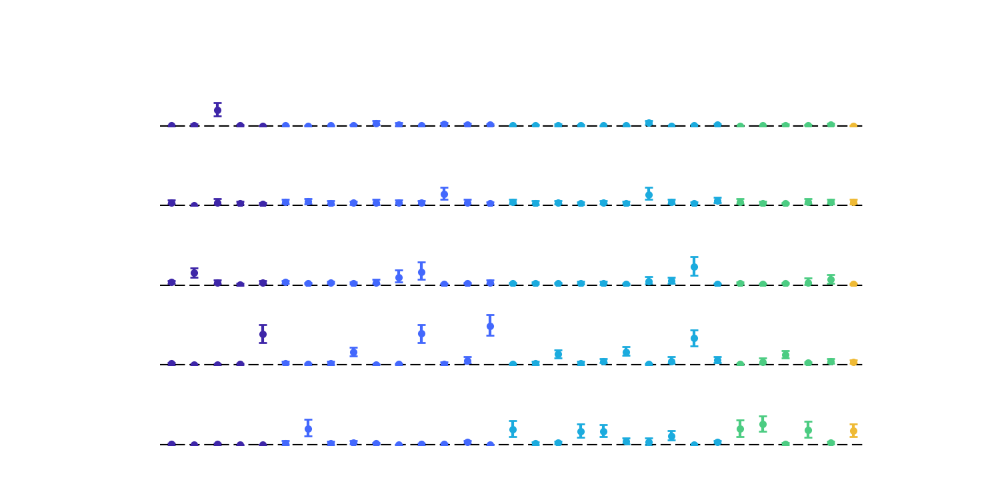

In [82]:
reload(nf)
nf.plot_example_tuning_curves('figures/example_neurons.jpg',dsnames[3],selected_expts,selected_rois,keylist=experienced_expts,scale=0.75)

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

/Users/dan/Documents/notebooks/mossing-PC/nubulator/nub_figures.py:416: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10*scale,len(selected_expts)*scale))


<IPython.core.display.Javascript object>


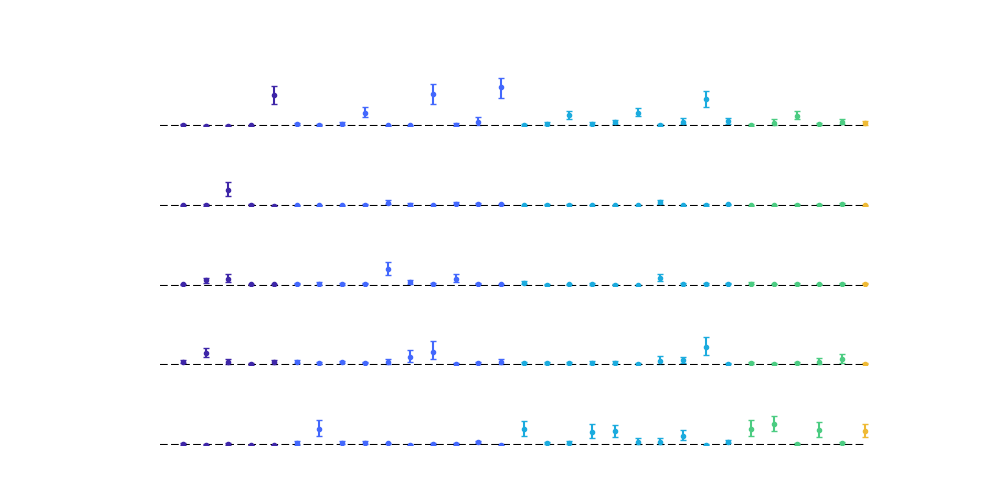

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


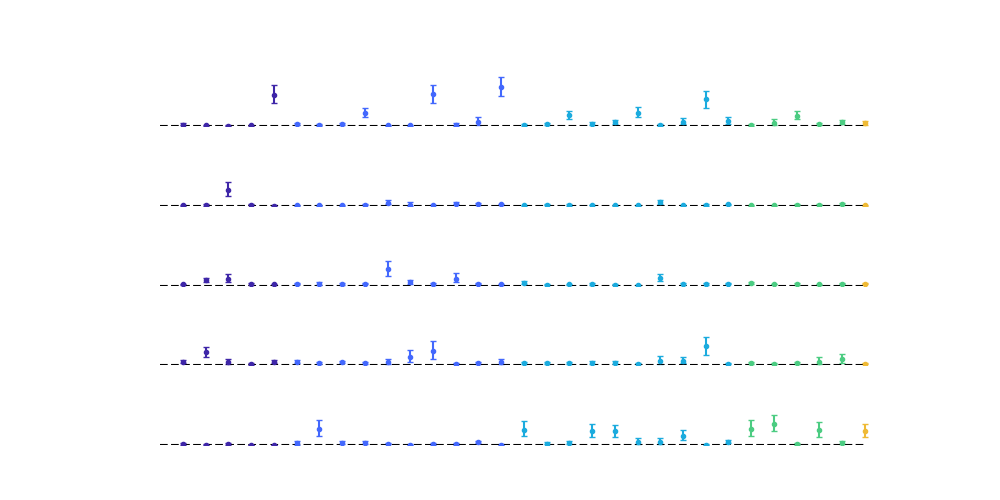

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


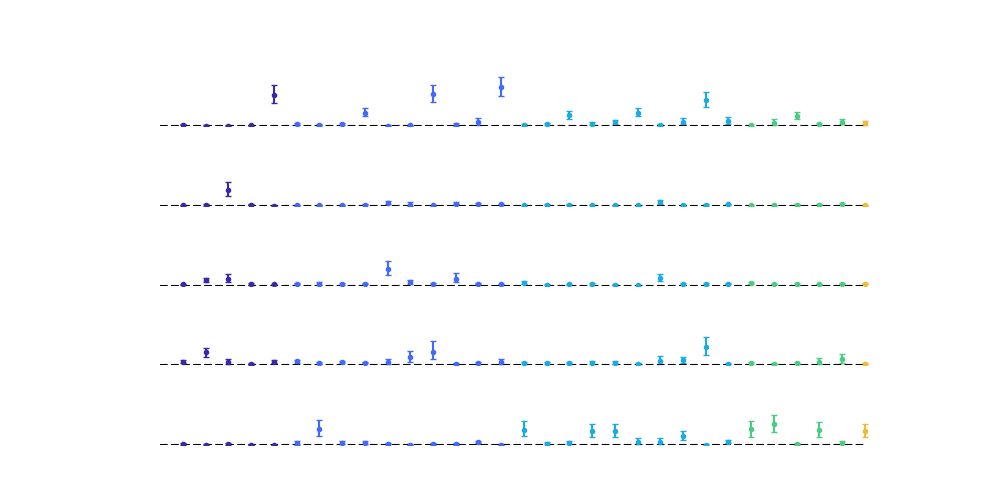

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


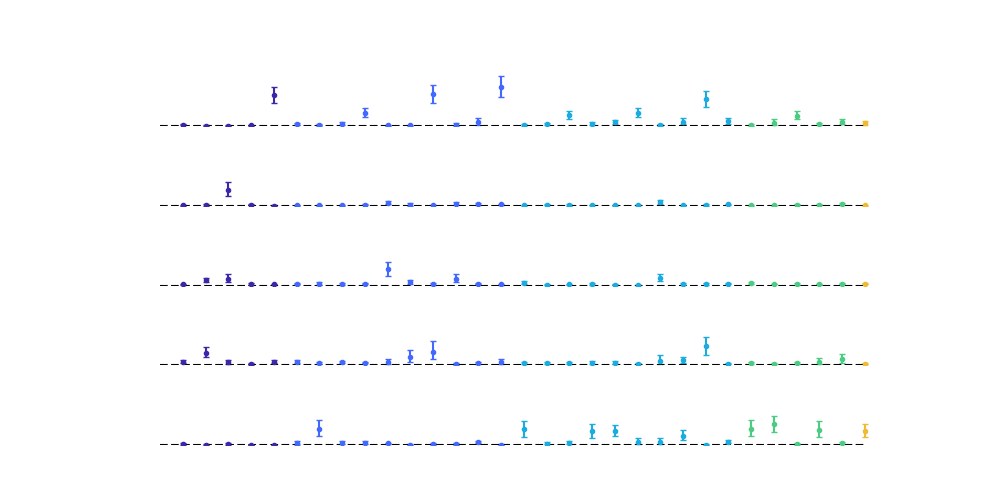

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


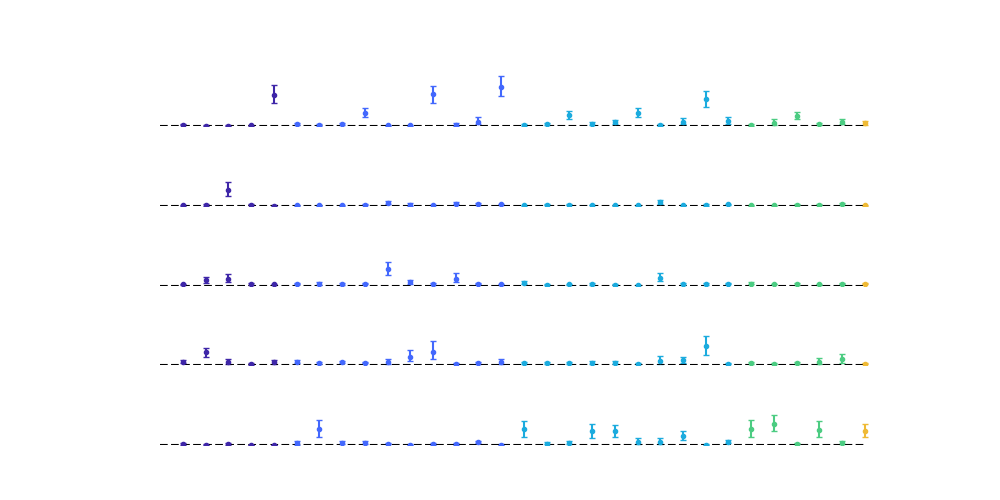

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


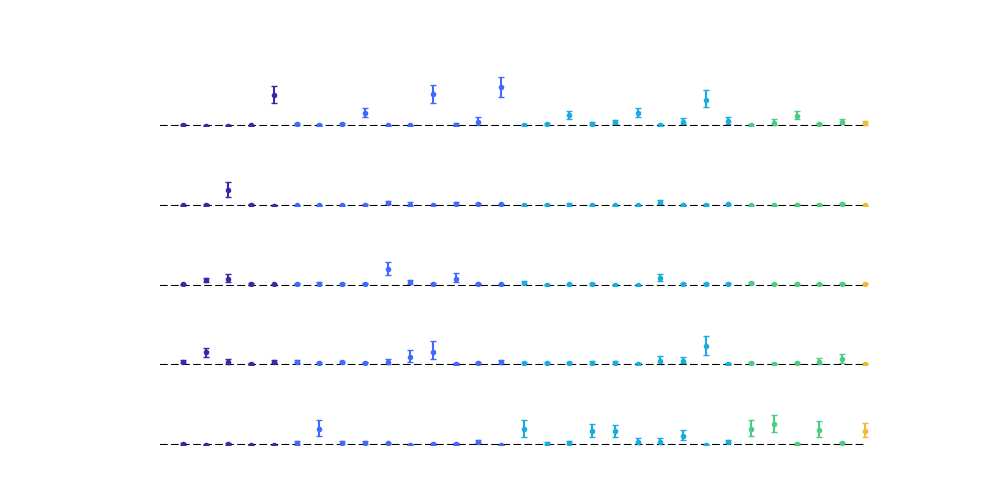

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


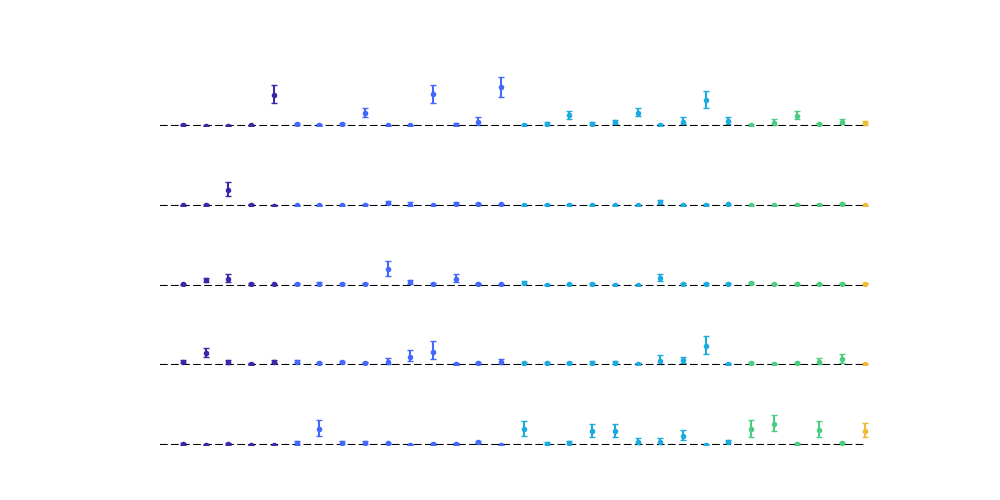

<HDF5 group "/session_191108_M0403" (5 members)>
['cell_id', 'cell_type', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_191119_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200311_M0403" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0293" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', 'mean_green_channel', 'mean_green_channel_enhanced', 'mean_red_channel', 'mean_red_channel_corrected', 'mouse_id', 'nub_0', 'retinotopy_0']
<HDF5 group "/session_200312_M0807" (12 members)>
['cell_center', 'cell_depth', 'cell_id', 'cell_mask', 'cell_type', '

<IPython.core.display.Javascript object>


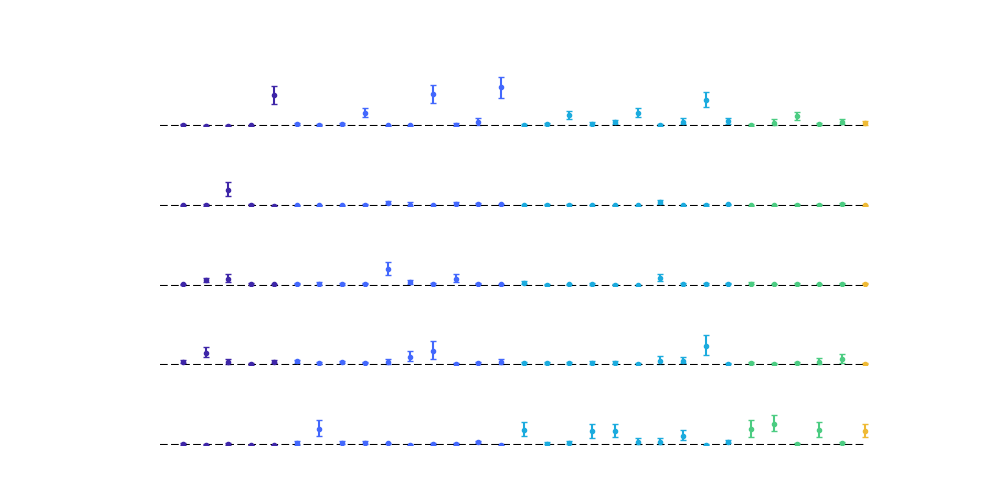

6min 37s ± 9.7 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [148]:
# reload(nf)
# %timeit nf.plot_example_tuning_curves_faster('figures/example_neurons.jpg',dsnames[3],selected_expts,selected_rois,keylist=experienced_expts)

<IPython.core.display.Javascript object>


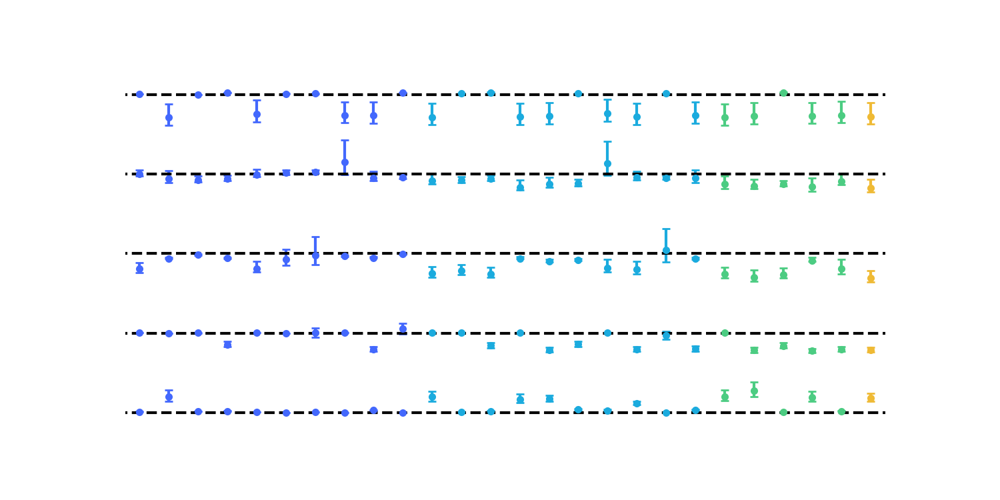

In [83]:
reload(nf)
# bounds = nf.plot_example_lin_subtracted('figures/example_neurons.jpg',dsnames[3],selected_expts,selected_rois,keylist=experienced_expts,run_all=False)
nf.plot_example_lin_subtracted('figures/example_neurons_lin_subtracted.jpg',dsnames[3],selected_expts,selected_rois,keylist=experienced_expts,bounds=bounds,pct=(16,84,50),scale=0.75)

In [152]:
pdb.pm()

> /Users/dan/Documents/notebooks/mossing-PC/nubulator/nub_utils.py(869)<listcomp>()
-> err_lo,err_hi = [x/mx + y*test_norm_response/mx for x,y in zip([err_lo,err_hi],[mx_err_lo,mx_err_hi])]
(Pdb) mx.shape
(1461, 1)
(Pdb) err_lo.shape
*** NameError: name 'err_lo' is not defined
(Pdb) mx_err_lo.shape
*** NameError: name 'mx_err_lo' is not defined
(Pdb) u
> /Users/dan/Documents/notebooks/mossing-PC/nubulator/nub_utils.py(869)subtract_lin_bounds()
-> err_lo,err_hi = [x/mx + y*test_norm_response/mx for x,y in zip([err_lo,err_hi],[mx_err_lo,mx_err_hi])]
(Pdb) mx_err_lo.shape
(1461, 1461)
(Pdb) err_lo.shape
(1461, 32)
(Pdb) mx_ind.shape
(1461,)
(Pdb) err_lo[:,list(mx_ind)].shape
(1461, 1461)
(Pdb) err_lo[np.arange(err_lo.shape[0]),mx_ind].shape
(1461,)
(Pdb) exit


In [10]:
import pyute as ut
with ut.hdf5read(dsnames[2]) as ds:
    print(list(ds.keys()))

['session_190827_M10077', 'session_190827_M10616', 'session_190827_M10619', 'session_190829_M10077', 'session_190830_M10619']


In [138]:
df

,data,roi_index,trial_index,session_id
0,0.000000,0,0,session_191108_M0403
1,0.000000,0,1,session_191108_M0403
2,0.000000,0,2,session_191108_M0403
3,0.008366,0,3,session_191108_M0403
4,0.000000,0,4,session_191108_M0403
...,...,...,...,...
2342395,0.001637,1219,1915,session_200312_M0807
2342396,0.010487,1219,1916,session_200312_M0807
2342397,0.000000,1219,1917,session_200312_M0807
2342398,0.000000,1219,1918,session_200312_M0807
